In [1]:
import py4DSTEM
import numpy as np
import matplotlib.pyplot as plt
import itertools as it
from copy import deepcopy
import pickle
from pathlib import Path
from matplotlib.colors import hsv_to_rgb
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sn
import joblib
import sys
from sklearn.metrics import log_loss
from matplotlib.ticker import PercentFormatter
import warnings
from matplotlib.cm import ScalarMappable
import matplotlib
from pymatgen.symmetry.analyzer import SpacegroupAnalyzer
from sklearn.metrics import r2_score
from RF_Functions import *
import math
%load_ext autoreload
%autoreload 2
from RF_Diffraction_OOP import *
import matplotlib as mpl
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
plt.rcdefaults()
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
from scipy.ndimage import gaussian_filter
from sklearn.decomposition import PCA

In [1]:
# radial_inputs_0 = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_0.joblib')
# radial_inputs_1 = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_1.joblib')

# with open('Model_data/Crystal_sys_inputs/radial_inputs_2.pkl', 'rb') as f:
#     radial_inputs_2 = pickle.load(f)
# with open('Model_data/Crystal_sys_inputs/radial_inputs_3.pkl', 'rb') as f:
#     radial_inputs_3 = pickle.load(f)

# radial_train_ids = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_0_5.joblib')
# radial_test_ids = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_1_5.joblib')

Load Dataset

In [2]:
rf_diff_obj = RF_Diffraction_model('Final_0_05_spacing_radial_dataframe_100423.pkl', 
                                   ['Model_data/Lattice_inputs_and_outputs/radial_cubic_df_w_lattice.joblib', 
                                    'Model_data/Lattice_inputs_and_outputs/radial_monoclinic_df_w_lattice.joblib',
                                    'Model_data/Lattice_inputs_and_outputs/radial_hexagonal_df_w_lattice.joblib', 
                                    'Model_data/Lattice_inputs_and_outputs/SCALED_radial_orthorhombic_df_w_lattice.joblib',
                                    'Model_data/Lattice_inputs_and_outputs/radial_tetragonal_df_w_lattice.joblib', 
                                    'Model_data/Lattice_inputs_and_outputs/radial_trigonal_df_w_lattice.joblib',
                                    'Model_data/Lattice_inputs_and_outputs/radial_triclinic_df_w_lattice.joblib'])

In [2]:
rf_diff_obj2 = RF_Diffraction_model('/pscratch/sd/s/smglsn12/Structure_factors/uncompiled_df_0_05_spacing_200_ang/Full_radial_200_ang_0.pkl', 
                                   ['radial_cubic_df_w_lattice.joblib', 'radial_monoclinic_df_w_lattice.joblib',
                                                                        'radial_hexagonal_df_w_lattice.joblib', 'SCALED_radial_orthorhombic_df_w_lattice.joblib',
                                                                        'radial_tetragonal_df_w_lattice.joblib', 'radial_trigonal_df_w_lattice.joblib',
                                                                        'radial_triclinic_df_w_lattice.joblib'])

In [3]:
rf_diff_obj.load_full_df() # load data from path provided 

In [3]:
rf_diff_obj2.load_full_df()

Figure S1

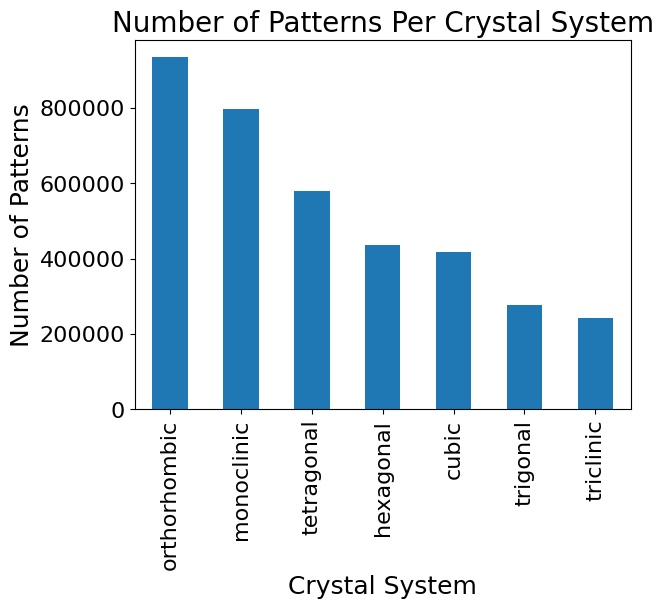

In [4]:
rf_diff_obj.show_distributions()

In [11]:
# fig2_5, scale = visualize_radial_components(rf_diff_obj2, (0.7071067811865476, -0.7071067811865475, 1.5171284458970975e-17), include_x_label = False, include_y_label = False, radial_params = [[12, 6], [18, 6], [6, 6]])

In [24]:
vec_list_temp

array([[0.        , 0.        , 1.        ],
       [0.        , 0.05607045, 0.99842682],
       [0.04821334, 0.04821334, 0.99767277],
       [0.        , 0.11196448, 0.99371221],
       [0.04815843, 0.10420736, 0.99338894],
       [0.09620227, 0.09620227, 0.9907019 ],
       [0.        , 0.16750622, 0.98587102],
       [0.04806611, 0.15995771, 0.98595293],
       [0.09601842, 0.15203053, 0.98370076],
       [0.14374343, 0.14374343, 0.97911983],
       [0.        , 0.22252093, 0.97492791],
       [0.04793515, 0.21528509, 0.97537406],
       [0.09575763, 0.20754326, 0.97352775],
       [0.14335506, 0.19931363, 0.96939332],
       [0.19061555, 0.19061555, 0.96298049],
       [0.        , 0.27683551, 0.96091732],
       [0.04776388, 0.27000983, 0.96167214],
       [0.09541655, 0.26255542, 0.96018766],
       [0.14284703, 0.25448963, 0.95646733],
       [0.18994488, 0.24583125, 0.95051982],
       [0.23660044, 0.23660044, 0.94235899],
       [0.        , 0.33027906, 0.94388333],
       [0.

In [14]:
xtal_path = '/pscratch/sd/s/smglsn12/Structure_factors/Simulated_patterns/calculated_structure_factors/mp-1xtal.joblib'

print(xtal_path)
xtal = joblib.load(xtal_path)

xtal.orientation_plan(
    angle_step_zone_axis=9.0,
    angle_step_in_plane=15.0,  # make this high, doesn't matter
    zone_axis_range='auto')

vec_list_temp = xtal.orientation_vecs
if len(vec_list_temp) > 100:
    print('indicies good! len = ' + str(len(vec_list_temp)))
    indicies = sample(list(np.arange(0, len(vec_list_temp))), 100)
    vec_list = vec_list_temp[indicies]

else:
    print('indicies not good :( len = ' + str(len(vec_list_temp)))
    print('recalcualting zones with angle = 4.0')

    xtal.orientation_plan(
        angle_step_zone_axis=4.0,
        angle_step_in_plane=15.0,
        zone_axis_range='auto')

    vec_list_temp = xtal.orientation_vecs

    if len(vec_list_temp) > 100:
        print('indicies now good! len = ' + str(len(vec_list_temp)))
        indicies = sample(list(np.arange(0, len(vec_list_temp))), 100)
        vec_list = vec_list_temp[indicies]

    else:
        print('indicies not good :( len = ' + str(len(vec_list_temp)))
        print('recalcualting zones with angle = 2.0')
        xtal.orientation_plan(
            angle_step_zone_axis=2.0,
            angle_step_in_plane=15.0,
            zone_axis_range='auto')

        vec_list_temp = xtal.orientation_vecs
        print('indicies finally good! len = ' + str(len(vec_list_temp)))
        indicies = sample(list(np.arange(0, len(vec_list_temp))), 100)
        vec_list = vec_list_temp[indicies]

corners = xtal.orientation_zone_axis_range
vec_list = list(vec_list)
for corner in corners:
    flag = 0
    for elem in vec_list:
        if collections.Counter(list(elem)) == collections.Counter(list(corner)):
            flag = 1
    if flag == 1:
        pass
    else:
        print('missing corner, adding')
        print(corner)
        vec_list.append(corner)

/pscratch/sd/s/smglsn12/Structure_factors/Simulated_patterns/calculated_structure_factors/mp-1xtal.joblib
Automatically detected point group m-3m,
 using arguments: zone_axis_range = 
[[0 1 1]
 [1 1 1]], 
 fiber_axis=None, fiber_angles=None.


Orientation plan: 100%|██████████| 28/28 [00:00<00:00, 100.87 zone axes/s]


indicies not good :( len = 28
recalcualting zones with angle = 4.0
Automatically detected point group m-3m,
 using arguments: zone_axis_range = 
[[0 1 1]
 [1 1 1]], 
 fiber_axis=None, fiber_angles=None.


Orientation plan: 100%|██████████| 120/120 [00:01<00:00, 101.30 zone axes/s]

indicies now good! len = 120


NameError: name 'sample' is not defined

In [23]:
for i in range(100):
    print(rf_diff_obj2.full_df.loc[rf_diff_obj2.full_df.mat_id == 'mp-1'].iloc[i].zone, i)

(-6.123233995736767e-17, -6.123233995736767e-17, 1.0) 0
(0.47720631304279265, 0.5317914906130877, 0.6996227164004999) 1
(0.40746988450470983, 0.40746988450470994, 0.8172738748078497) 2
(0.21804827967810517, 0.6900923661834765, 0.6900923661834765) 3
(0.36711810386521815, 0.36711810386521815, 0.8546628549485544) 4
(0.3539710083386525, 0.5711946271141846, 0.7405681759376413) 5
(0.3148581936032331, 0.5332475497643474, 0.785182379190484) 6
(0.09499093130900482, 0.31688022238145225, 0.9436967985706686) 7
(0.30290544652768614, 0.6738873386790492, 0.6738873386790492) 8
(0.047935148517322584, 0.21528509247246502, 0.9753740567063205) 9
(0.18809377570931843, 0.3546144052028739, 0.9158981139635699) 10
(-7.062398737039529e-17, 0.16750622330473633, 0.9858710185182359) 11
(0.4459251095090297, 0.4459251095090297, 0.7760809193754988) 12
(0.5034214360420124, 0.6109692536181334, 0.6109692536181334) 13
(-8.60511106312209e-17, 0.6234898018587334, 0.7818314824680298) 14
(0.04521316485673081, 0.6213372078793

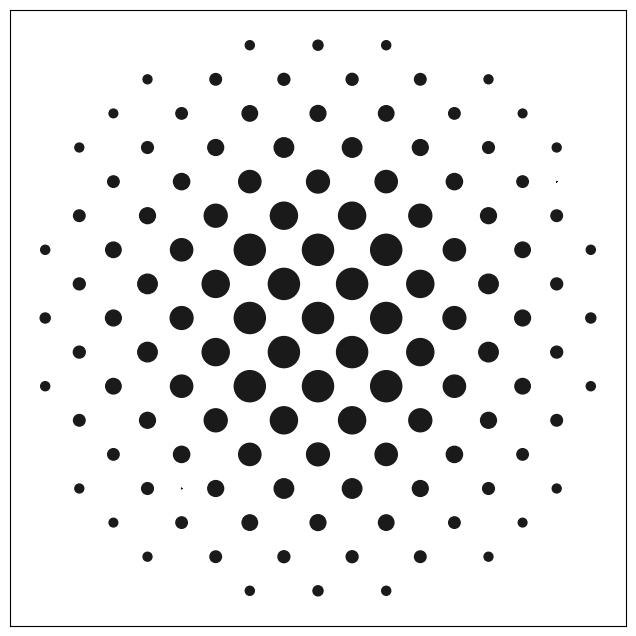

In [29]:
fig, axes = rf_diff_obj2.show_specific_pattern('mp-1', zone = (-6.123233995736767e-17, -6.123233995736767e-17, 1.0),
                                   thickness_col='thickness_200_ang',
                                    include_y_label=False,
                                    include_x_label=False,)

In [30]:
fig.savefig('mp_1_001.pdf', bbox_inches="tight")

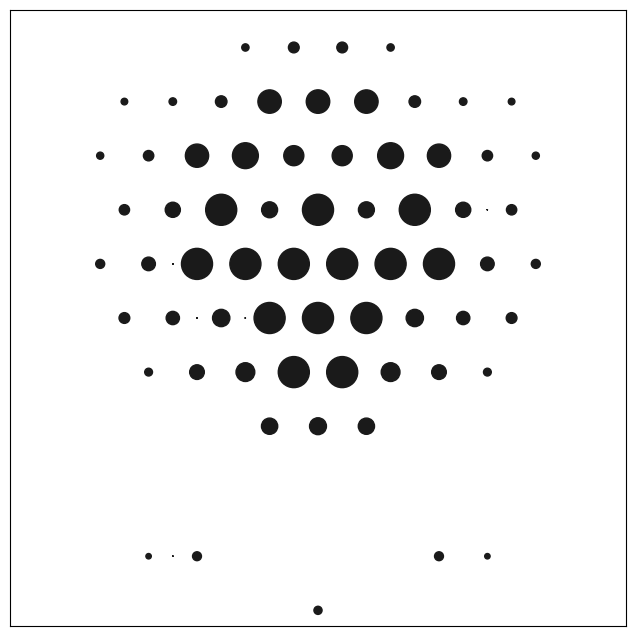

In [39]:
fig, axes = rf_diff_obj2.show_specific_pattern('mp-1', zone = (-8.173614862602576e-17, 0.433883739117558, 0.9009688679024191),
                                   thickness_col='thickness_200_ang',
                                    include_y_label=False,
                                    include_x_label=False,)

In [43]:
0.433883739117558/0.9009688679024191

0.4815746188075285

In [44]:
fig.savefig('mp_1_0_0.48_1.pdf', bbox_inches="tight")

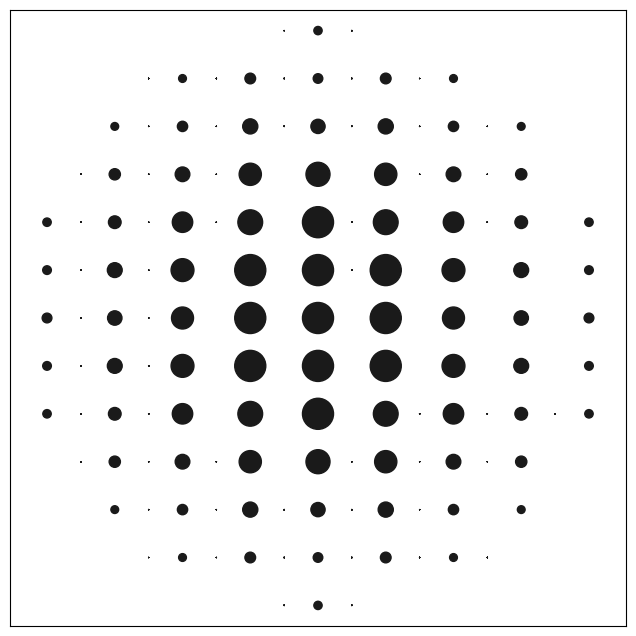

In [31]:
fig, axes = rf_diff_obj2.show_specific_pattern('mp-1', zone = (-8.659560562354934e-17, 0.7071067811865474, 0.7071067811865475),
                                   thickness_col='thickness_200_ang',
                                    include_y_label=False,
                                    include_x_label=False,)

In [32]:
fig.savefig('mp_1_011.pdf', bbox_inches="tight")

In [45]:
0.344496770778373/0.6638230091384574

0.5189587676773634

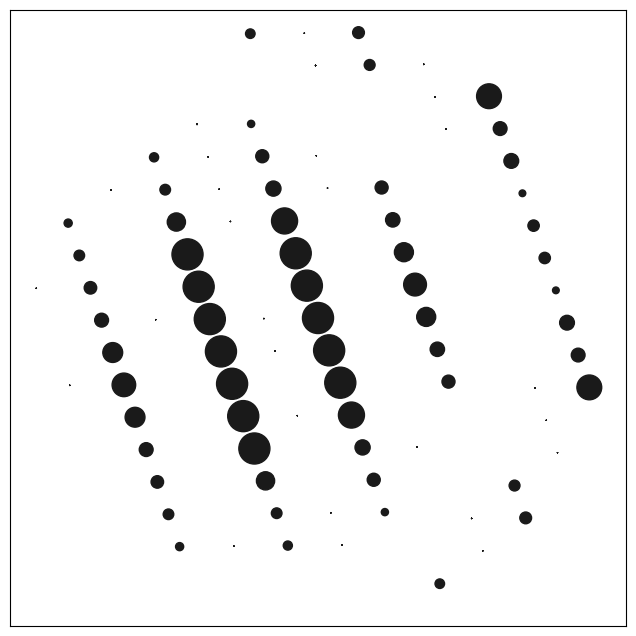

In [46]:
fig, axes = rf_diff_obj2.show_specific_pattern('mp-1', zone = (0.344496770778373, 0.6638230091384574, 0.6638230091384574),
                                   thickness_col='thickness_200_ang',
                                    include_y_label=False,
                                    include_x_label=False,)

In [47]:
fig.savefig('mp_1_0.52_1_1.pdf', bbox_inches="tight")

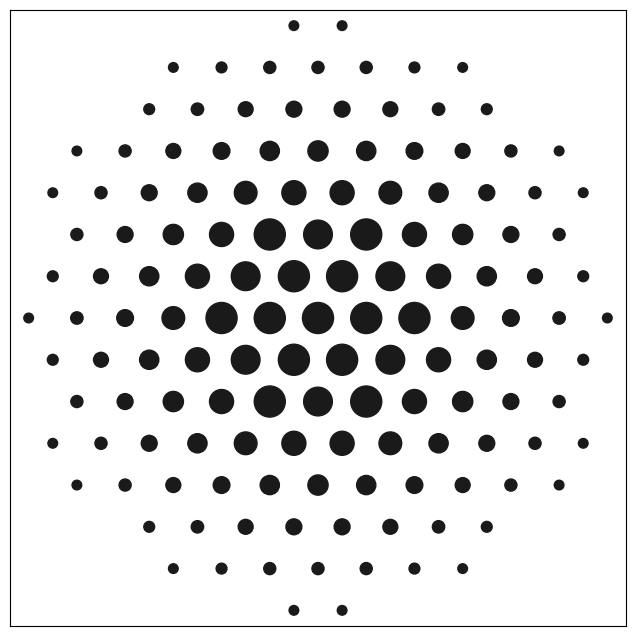

In [33]:
fig, axes = rf_diff_obj2.show_specific_pattern('mp-1', zone = (0.5773502691896257, 0.5773502691896257, 0.5773502691896257),
                                   thickness_col='thickness_200_ang',
                                    include_y_label=False,
                                    include_x_label=False,)

In [34]:
fig.savefig('mp_1_111.pdf', bbox_inches="tight")

In [48]:
0.40746988450470994/0.8172738748078497

0.49857201736750817

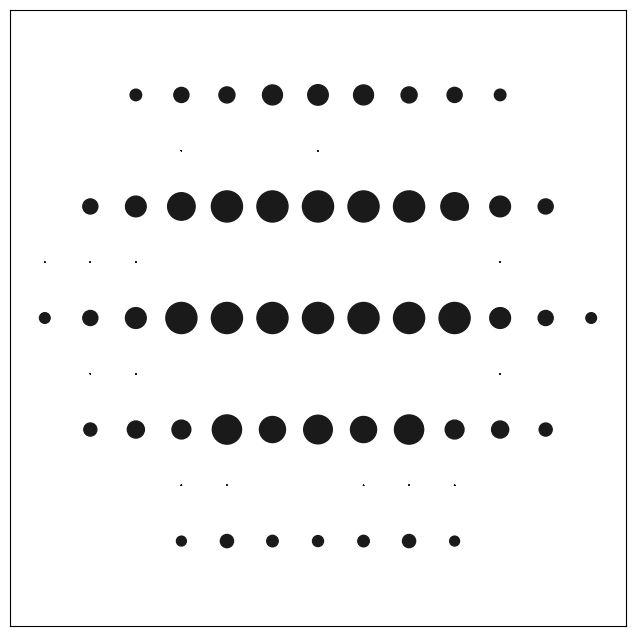

In [49]:
fig, axes = rf_diff_obj2.show_specific_pattern('mp-1', zone = (0.40746988450470983, 0.40746988450470994, 0.8172738748078497),
                                   thickness_col='thickness_200_ang',
                                    include_y_label=False,
                                    include_x_label=False,)

In [50]:
fig.savefig('mp_1_0.5_0.5_1.pdf', bbox_inches="tight")

Figure 1 = turn this into one big function

In [ ]:
fig, scale = visualize_radial_components(rf_diff_obj2, (0.7519243758020778, 0.13895000845294775, 0.6444397785872482), include_x_label = False, include_y_label = False, radial_params = [[12, 6], [18, 6], [6, 6]])


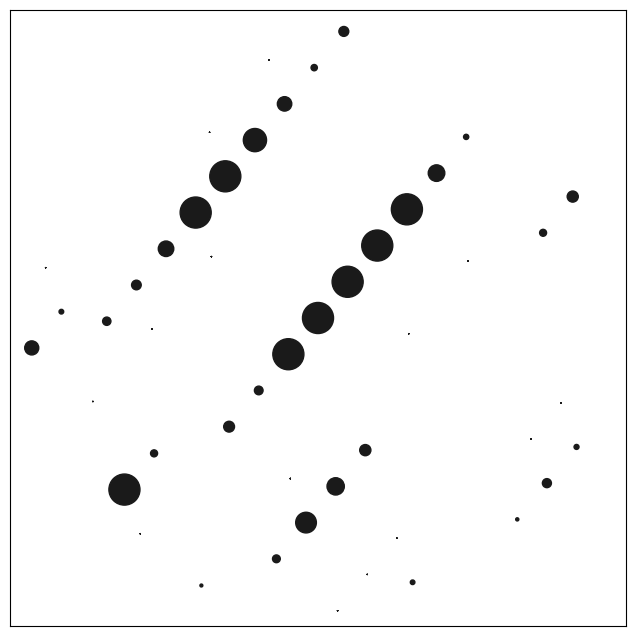

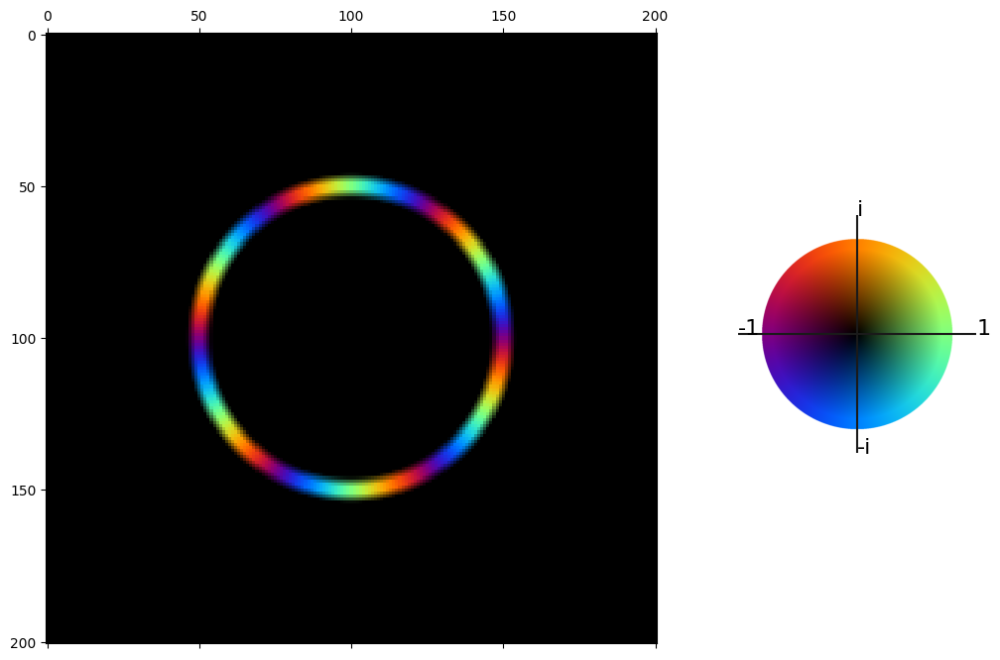

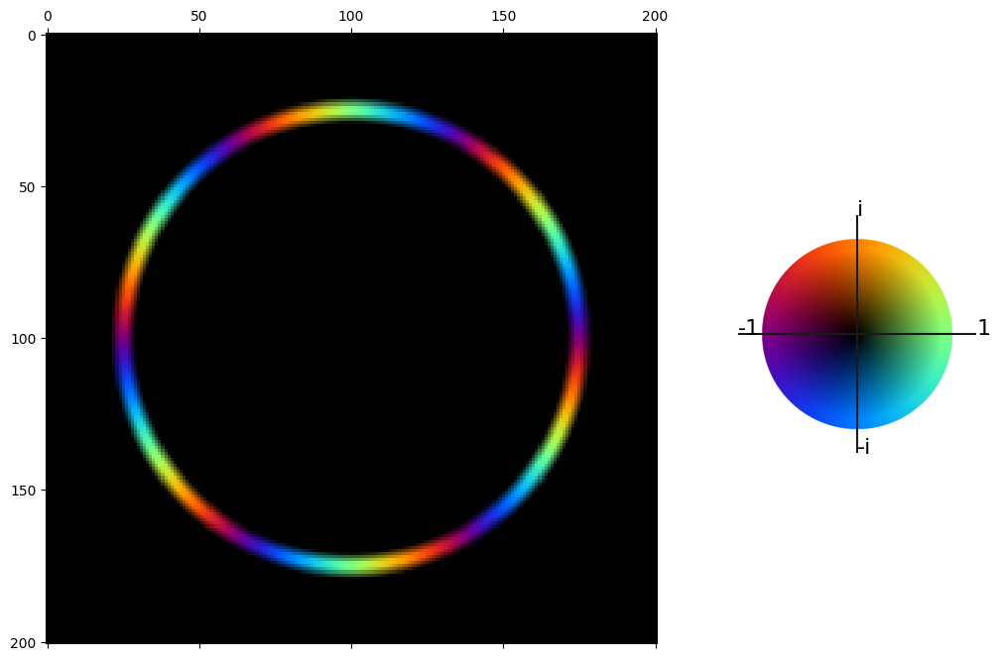

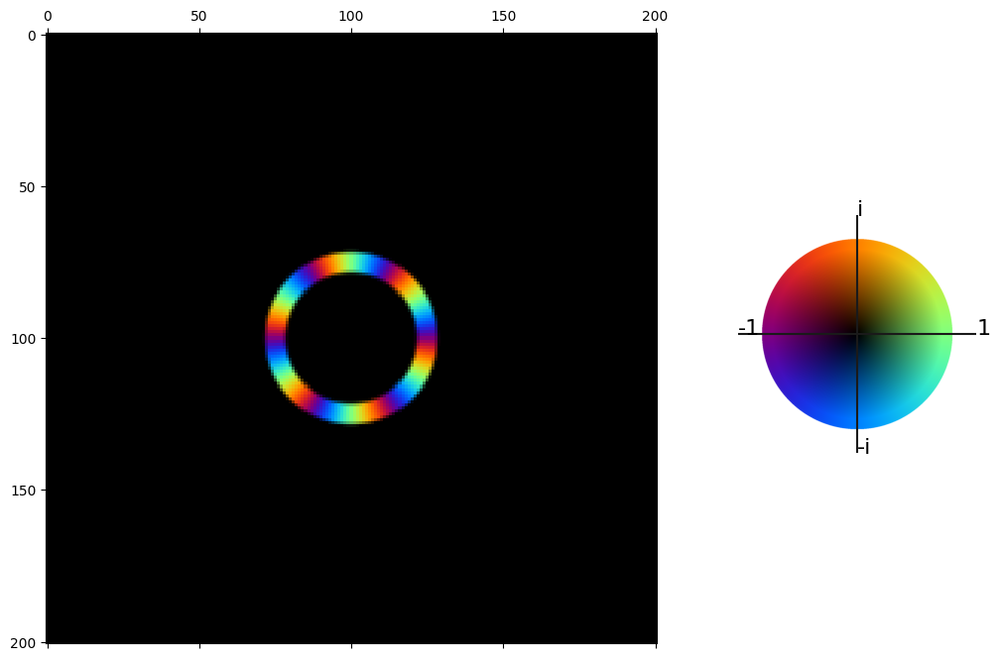

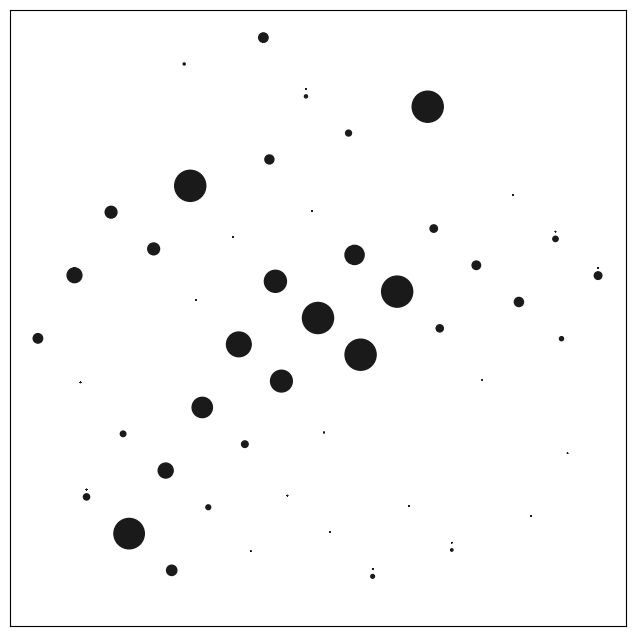

...

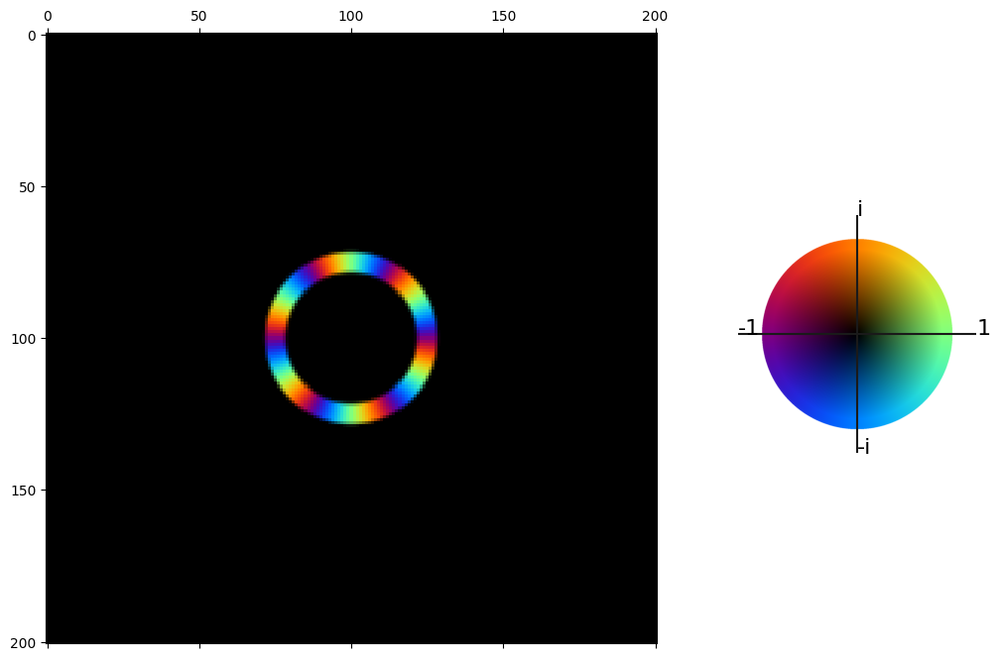

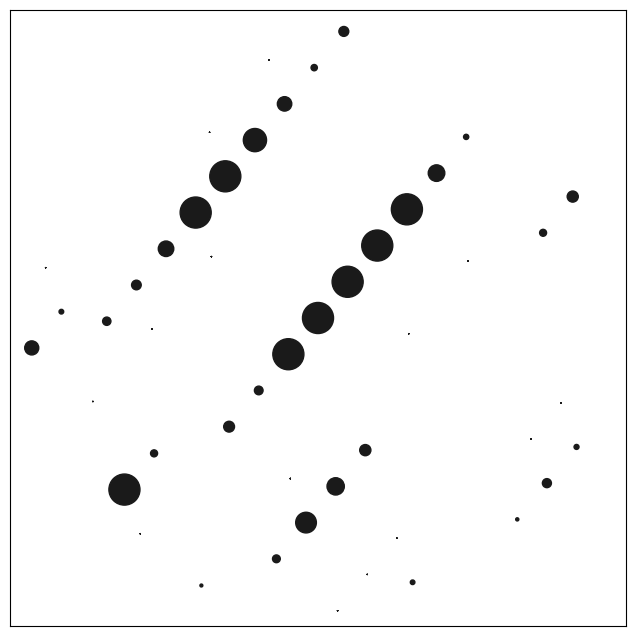

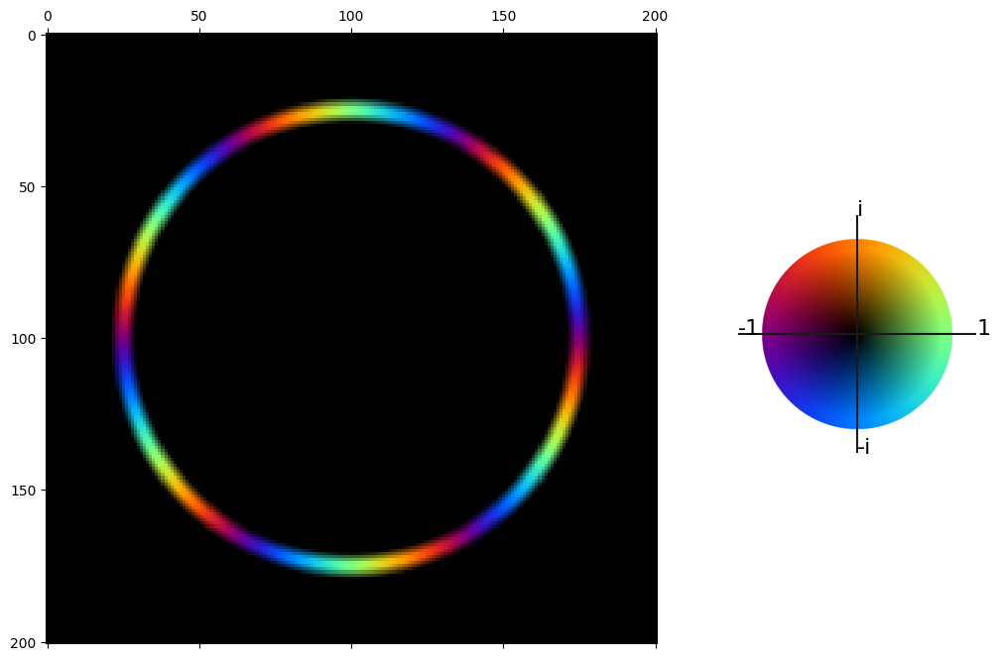

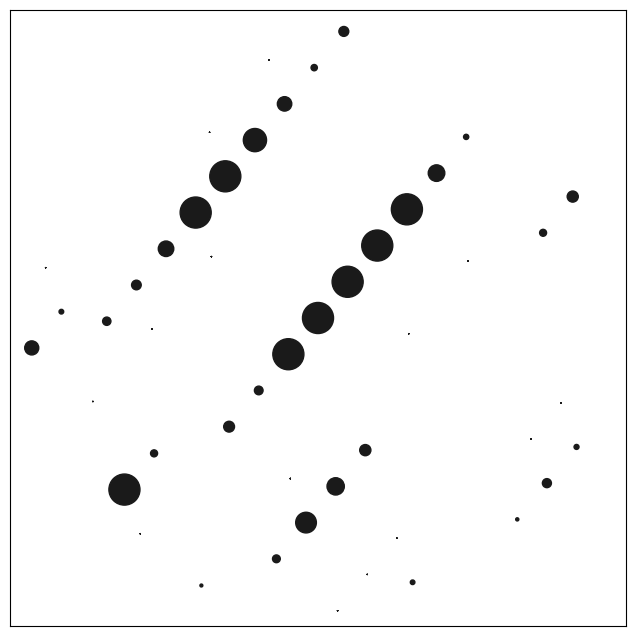

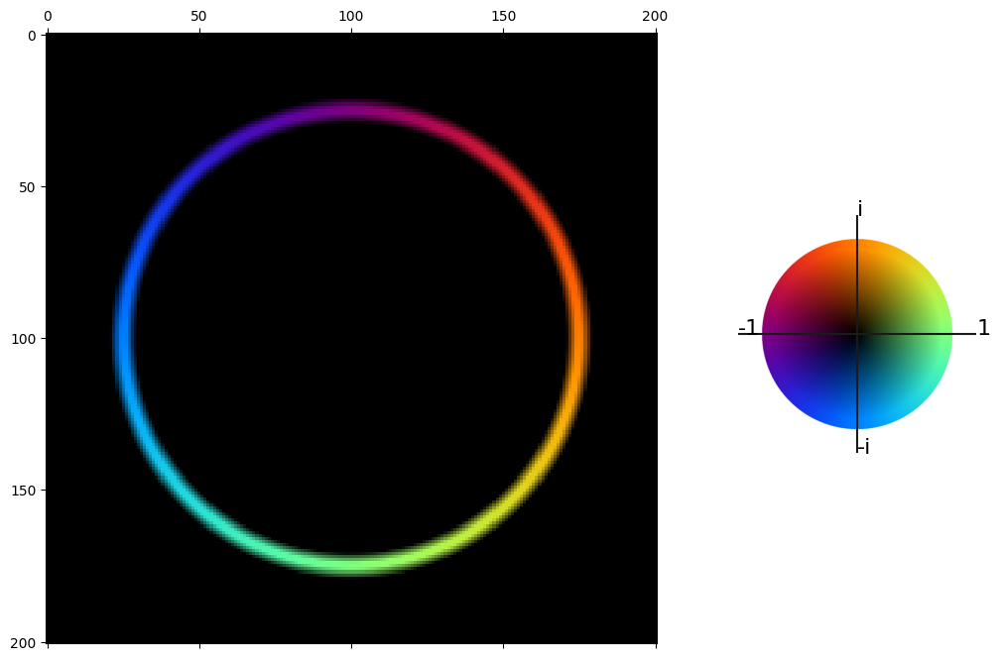

In [4]:
fig, scale = visualize_radial_components(rf_diff_obj2, (0.7519243758020778, 0.13895000845294775, 0.6444397785872482), include_x_label = False, include_y_label = False, radial_params = [[12, 6], [18, 6], [6, 6]])
fig2, scale = visualize_radial_components(rf_diff_obj2, (0.9302839215348991, 0.35907619075631536, 0.075074060537472), include_x_label = False, include_y_label = False, radial_params = [[12, 6], [18, 6], [6, 6]])
fig3, scale = visualize_radial_components(rf_diff_obj2, (0.7519243758020778, 0.13895000845294775, 0.6444397785872482), [[18,6]], include_x_label = False, include_y_label = False)
fig4, scale = visualize_radial_components(rf_diff_obj2, (0.7519243758020778, 0.13895000845294775, 0.6444397785872482), [[18,1]], include_x_label = False, include_y_label = False)

In [16]:
# scale[0].savefig('Figures/Figure 1/radial_basis_colorbar.pdf', bbox_inches="tight")

In [17]:
# plt.rcParams['pdf.fonttype'] = 'truetype'
# fig.savefig('Figures/Figure 1/radial_basis_example_1.pdf', bbox_inches="tight")

In [18]:
# fig2.savefig('Figures/Figure 1/radial_basis_example_2.pdf', bbox_inches="tight")
# plt.rcParams['pdf.fonttype'] = 'truetype'
# fig2.savefig('Figures/Figure 1/pattern_example_2.pdf', bbox_inches="tight")

In [ ]:
# fig2_5.savefig('Figures/Figure 1/pattern_example_3.pdf', bbox_inches="tight")

In [19]:
# fig3.savefig('Figures/Figure 1/radial_basis_example_3.pdf', bbox_inches="tight")

In [20]:
# fig4.savefig('Figures/Figure 1/radial_basis_example_4.pdf', bbox_inches="tight")

Figure 2

In [14]:
# fig, ax = rf_diff_obj2.show_specific_pattern('mp-1001786', zone = (0.7060819365278469, -0.706081936527847, 0.05382005033601193), include_x_label = False, include_y_label = False)
# fig2, ax2 = rf_diff_obj2.show_specific_pattern('mp-1001786', zone = (0.7071067811865476, -0.7071067811865475, 1.5171284458970975e-17), include_x_label = False, include_y_label = False)
# fig3, ax3 = rf_diff_obj2.show_specific_pattern('mp-1001786', zone = (0.9302839215348991, 0.35907619075631536, 0.075074060537472), include_x_label = False, include_y_label = False)

In [23]:
# fig.savefig('Figures/Figure 2/fig2_pattern_example_1.pdf', bbox_inches="tight")

In [8]:
# fig2.savefig('Figures/Figure 2/fig2_pattern_example_2.pdf', bbox_inches="tight")

In [25]:
# fig3.savefig('Figures/Figure 2/fig2_pattern_example_3.pdf', bbox_inches="tight")

In [4]:
rf_diff_obj.condense_crystal_system_output(method='Difference Aggregation', load_from_path = True, num=10,
            path = 'Model_data/Crystal_sys_outputs/10_pattern_lattice_added_difference_aggregation_condensed_df.joblib')

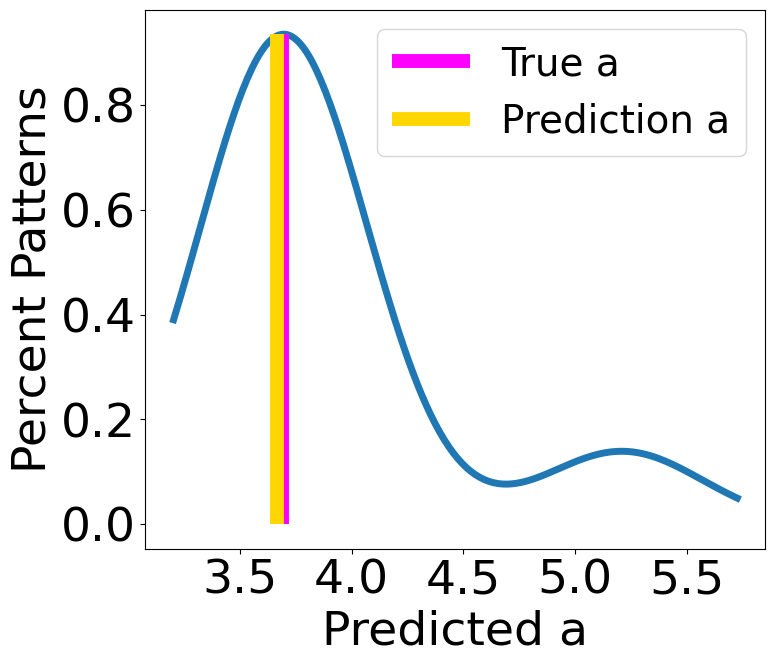

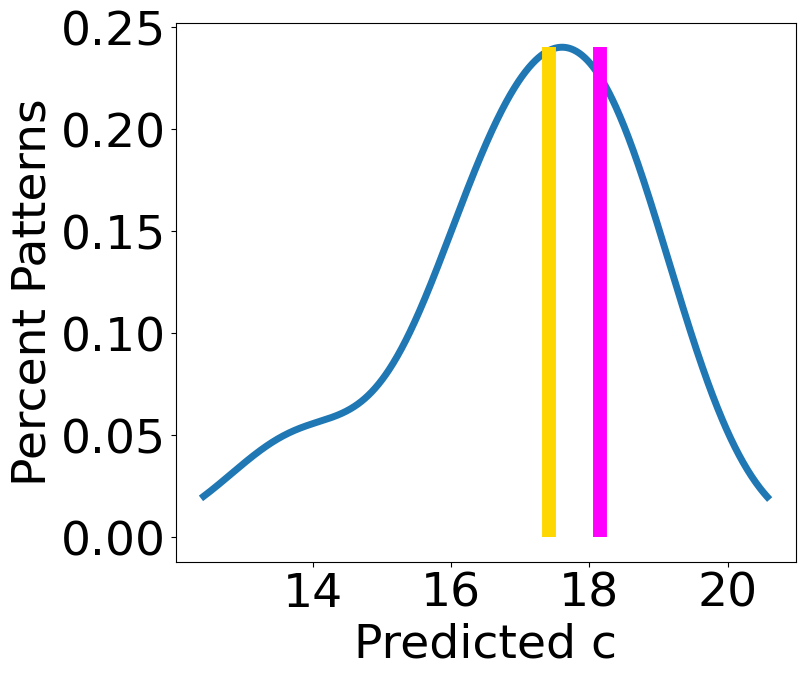

In [5]:
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
t = rf_diff_obj.lattice_visualize_predictions_by_material(material_id = 'mp-1001786', show_plots = False,param_list = ['a','c'], index_list = [0,2],
                                            savefigure=True, include_legend = [True,False], filename='Figures/Figure 1/figure1_lattice_example_',
                                            xticks = [[3.5,4,4.5,5,5.5], [10,12,14,16,18,20]])

Figure S2 - Confusion Matrix with Triclinic, Individual Pattern

Figure S3 - Confusion Matrix without Triclinic, Individual Pattern

In [3]:
# radial_inputs_0 = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_0.joblib')
# radial_inputs_1 = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_1.joblib')

# with open('Model_data/Crystal_sys_inputs/radial_inputs_2.pkl', 'rb') as f:
#     radial_inputs_2 = pickle.load(f)
# with open('Model_data/Crystal_sys_inputs/radial_inputs_3.pkl', 'rb') as f:
#     radial_inputs_3 = pickle.load(f)

# radial_train_ids = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_0_5.joblib')
# radial_test_ids = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_1_5.joblib')

In [6]:
# test_indicies = rf_diff_obj.full_df.loc[rf_diff_obj.full_df['mat_id'].isin(radial_test_ids)].index
# these are the test indicies for the WITH TRICLINIC dataframe even though the training has been done WITHOUT TRICLINIC - do not forget this 
# or you will start to jumble indicies (although it will be quite obvious if this has happened) 

In [7]:
# print('loading crystal system model')
# rf_output_radial = joblib.load('Model_data/Crystal_sys_outputs/crystal_system_model.joblib')
# print('crystal system model loaded')

loading crystal system model
crystal system model loaded


loading crystal system model
crystal system model loaded
crystal system 0.6716139944349833
point group 0.6716139944349833


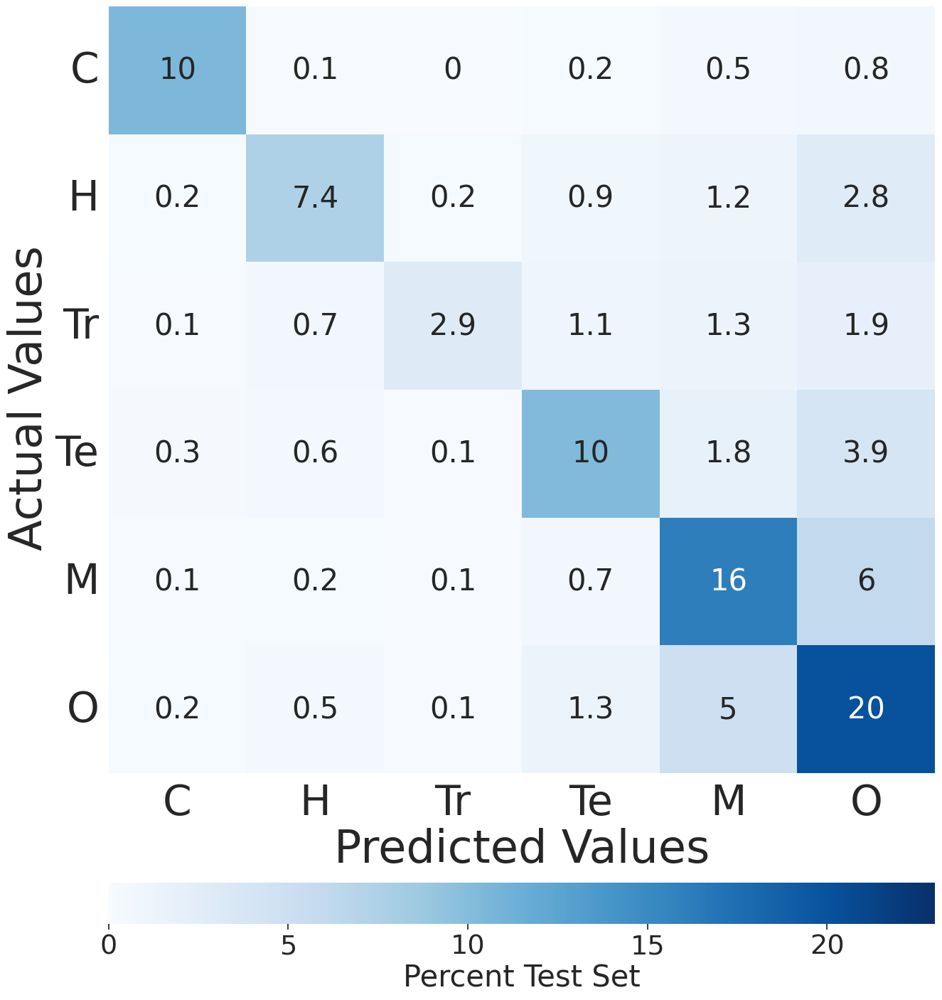

       C     H    Tr    Te     M     O
C   77.0  33.0  31.0  32.0  38.0  34.0
H   40.0  48.0  34.0  33.0  40.0  37.0
Tr  33.0  34.0  44.0  32.0  40.0  33.0
Te  38.0  35.0  31.0  51.0  40.0  36.0
M   33.0  32.0  32.0  32.0  55.0  39.0
O   35.0  33.0  27.0  33.0  46.0  48.0


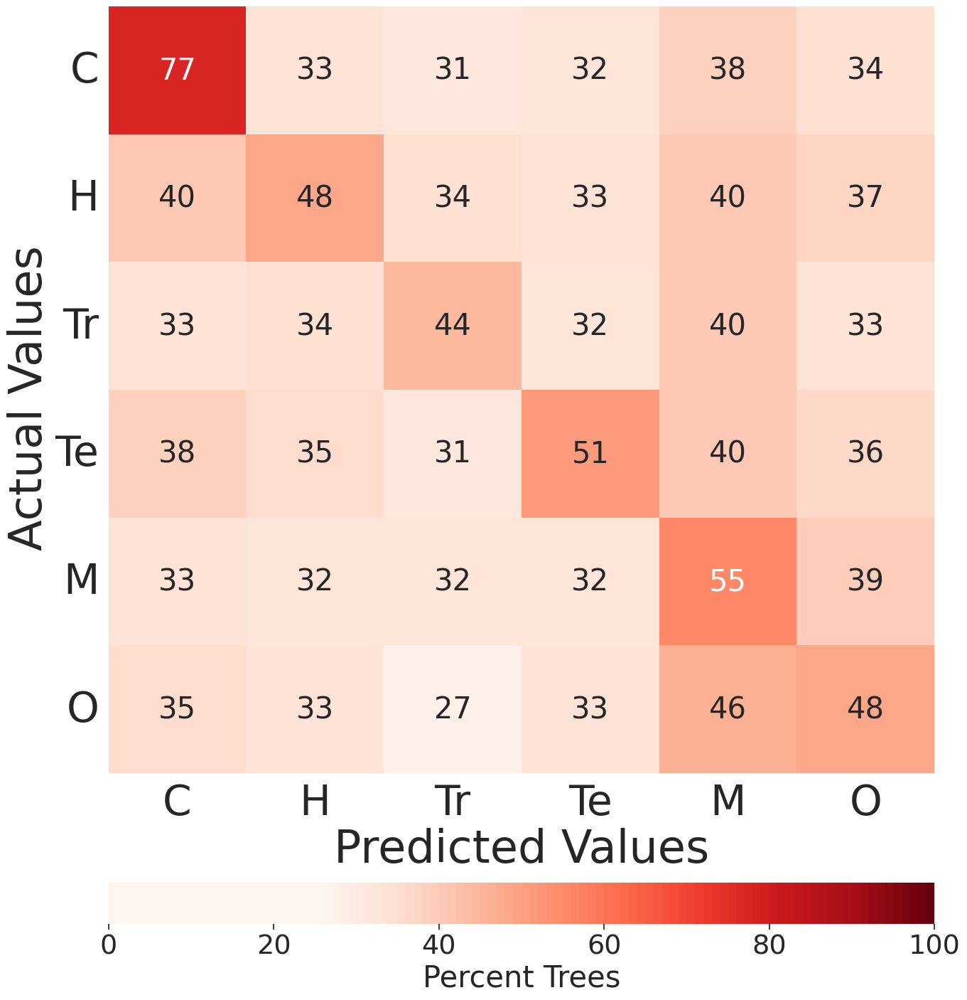

In [10]:
plt.rcParams['pdf.fonttype'] = 'truetype'
sn.set(font_scale=2.5)
rf_diff_obj.show_cm_and_uncertianty_individual_prediction(savefigure=False, reset_output_df = True, 
                                                         figure_path = ['Figures/Figure 3/fig3_individual_prediction_accuracy.pdf', 
                                                                   'Figures/Figure 3/fig3_individual_prediction_confidence.pdf'])

In [11]:
# individual pattern lattice prediction

median_errors_full = []

# for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
# for cry_sys in ['hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
for cry_sys in ['hexagonal']:
    print(cry_sys)
    for pred_type in ['Median']:
        print(pred_type)

        median_errors = rf_diff_obj.visualize_lattice_results_individual(cry_sys, cry_sys_type = 'Predictions Crystal System', 
                                                             prediction_type = pred_type, show_hists = False, show_r2 = True,  savefig=False,
                                                                         update_output_df_with_lattice = True, load_lattice_output_df_from_path = False, savenp = False,
                                                            output_df_path = 'Model_data/Crystal_sys_outputs/Ortho_fixed_MONO_FIXED_LATTICE_UPDATED_output_df_radial.joblib')
        median_errors_full.append(median_errors)

hexagonal
Median
df ready
hexagonal
model loaded
a


KeyError: 'a'

In [12]:
test_out_df = joblib.load('Model_data/Crystal_sys_outputs/Ortho_fixed_MONO_FIXED_LATTICE_UPDATED_output_df_radial.joblib')

In [13]:
test_out_df.loc[test_out_df['Predictions Crystal System'] == 'hexagonal']

,Predictions Crystal System,True Values Crystal System,Confidence Crystal System,Full DF Indicies,Full Predictions Crystal System,mat_id,radial_200_ang_Colin_basis,True Value Space Group,structure,alpha,...,gamma,a,b,c,pred_cry_sys_full_predictions_a,pred_cry_sys_full_predictions_b,pred_cry_sys_full_predictions_c,true_cry_sys_full_predictions_a,true_cry_sys_full_predictions_b,true_cry_sys_full_predictions_c
0,hexagonal,hexagonal,0.5375,1308,"[hexagonal, orthorhombic, cubic, trigonal, tet...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",191,"[[0. 0. 0.] Li, [0.71842299 1.24434511 1.82475...",90.0,...,120.0,4.31,4.31,3.65,"[4.01, 4.24, 4.25, 4.33, 4.46, 4.13, 4.99, 2.4...","[4.01, 4.24, 4.25, 4.33, 4.46, 4.13, 4.99, 2.4...","[3.1, 7.9, 5.37, 3.54, 7.28, 5.01, 3.86, 7.8, ...","[4.01, 4.24, 4.25, 4.33, 4.46, 4.13, 4.99, 2.4...","[4.01, 4.24, 4.25, 4.33, 4.46, 4.13, 4.99, 2.4...","[3.1, 7.9, 5.37, 3.54, 7.28, 5.01, 3.86, 7.8, ..."
1,hexagonal,hexagonal,0.4375,1309,"[tetragonal, hexagonal, tetragonal, cubic, tet...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",191,"[[0. 0. 0.] Li, [0.71842299 1.24434511 1.82475...",90.0,...,120.0,4.31,4.31,3.65,"[3.61, 3.3, 3.1, 3.53, 5.06, 4.47, 3.95, 3.87,...","[3.61, 3.3, 3.1, 3.53, 5.06, 4.47, 3.95, 3.87,...","[3.85, 3.86, 7.57, 11.34, 5.54, 7.46, 6.34, 4....","[3.61, 3.3, 3.1, 3.53, 5.06, 4.47, 3.95, 3.87,...","[3.61, 3.3, 3.1, 3.53, 5.06, 4.47, 3.95, 3.87,...","[3.85, 3.86, 7.57, 11.34, 5.54, 7.46, 6.34, 4...."
3,hexagonal,hexagonal,0.2625,1311,"[hexagonal, cubic, hexagonal, orthorhombic, tr...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",191,"[[0. 0. 0.] Li, [0.71842299 1.24434511 1.82475...",90.0,...,120.0,4.31,4.31,3.65,"[5.95, 4.01, 6.14, 7.18, 4.2, 3.87, 4.1, 5.37,...","[5.95, 4.01, 6.14, 7.18, 4.2, 3.87, 4.1, 5.37,...","[3.51, 5.02, 4.42, 4.24, 4.18, 15.56, 3.92, 4....","[5.95, 4.01, 6.14, 7.18, 4.2, 3.87, 4.1, 5.37,...","[5.95, 4.01, 6.14, 7.18, 4.2, 3.87, 4.1, 5.37,...","[3.51, 5.02, 4.42, 4.24, 4.18, 15.56, 3.92, 4...."
4,hexagonal,hexagonal,0.2375,1312,"[cubic, monoclinic, trigonal, hexagonal, trigo...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",191,"[[0. 0. 0.] Li, [0.71842299 1.24434511 1.82475...",90.0,...,120.0,4.31,4.31,3.65,"[3.99, 3.01, 3.02, 3.66, 4.97, 5.51, 2.92, 3.2...","[3.99, 3.01, 3.02, 3.66, 4.97, 5.51, 2.92, 3.2...","[9.32, 11.49, 3.3800000000000003, 5.25, 4.04, ...","[3.99, 3.01, 3.02, 3.66, 4.97, 5.51, 2.92, 3.2...","[3.99, 3.01, 3.02, 3.66, 4.97, 5.51, 2.92, 3.2...","[9.32, 11.49, 3.3800000000000003, 5.25, 4.04, ..."
5,hexagonal,hexagonal,0.2125,1313,"[cubic, hexagonal, hexagonal, orthorhombic, he...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",191,"[[0. 0. 0.] Li, [0.71842299 1.24434511 1.82475...",90.0,...,120.0,4.31,4.31,3.65,"[4.1, 6.66, 4.13, 4.28, 4.28, 4.28, 5.13, 4.18...","[4.1, 6.66, 4.13, 4.28, 4.28, 4.28, 5.13, 4.18...","[7.47, 4.99, 5.69, 7.03, 7.03, 7.03, 8.14, 6.7...","[4.1, 6.66, 4.13, 4.28, 4.28, 4.28, 5.13, 4.18...","[4.1, 6.66, 4.13, 4.28, 4.28, 4.28, 5.13, 4.18...","[7.47, 4.99, 5.69, 7.03, 7.03, 7.03, 8.14, 6.7..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
859649,hexagonal,hexagonal,0.4875,3679442,"[hexagonal, trigonal, trigonal, tetragonal, he...",mp-9987,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",194,"[[1.66015804 0.95849269 4.6345209 ] Nb, [ 1.66...",90.0,...,120.0,3.32,3.32,11.59,"[3.14, 3.41, 3.63, 4.94, 3.33, 3.09, 3.06, 3.0...","[3.14, 3.41, 3.63, 4.94, 3.33, 3.09, 3.06, 3.0...","[14.13, 14.839999999999998, 13.75, 10.91, 13.9...","[3.14, 3.41, 3.63, 4.94, 3.33, 3.09, 3.06, 3.0...","[3.14, 3.41, 3.63, 4.94, 3.33, 3.09, 3.06, 3.0...","[14.13, 14.839999999999998, 13.75, 10.91, 13.9..."
859650,hexagonal,hexagonal,0.45,3679443,"[hexagonal, trigonal, tetragonal, hexagonal, h...",mp-9987,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",194,"[[1.66015804 0.95849269 4.6345209 ] Nb, [ 1.66...",90.0,

In [14]:
rf_diff_obj.output_df.loc[rf_diff_obj.output_df['Predictions Crystal System'] == 'hexagonal']

,Predictions Crystal System,True Values Crystal System,Confidence Crystal System,Full DF Indicies,Full Predictions Crystal System,mat_id,radial_200_ang_Colin_basis,pred_cry_sys_full_predictions_a,pred_cry_sys_full_predictions_b,pred_cry_sys_full_predictions_c,true_cry_sys_full_predictions_a,true_cry_sys_full_predictions_b,true_cry_sys_full_predictions_c
0,hexagonal,hexagonal,0.5375,1308,"[hexagonal, orthorhombic, cubic, trigonal, tet...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...","[4.01, 4.24, 4.25, 4.33, 4.46, 4.13, 4.99, 2.4...","[4.01, 4.24, 4.25, 4.33, 4.46, 4.13, 4.99, 2.4...","[3.1, 7.9, 5.37, 3.54, 7.28, 5.01, 3.86, 7.8, ...","[4.01, 4.24, 4.25, 4.33, 4.46, 4.13, 4.99, 2.4...","[4.01, 4.24, 4.25, 4.33, 4.46, 4.13, 4.99, 2.4...","[3.1, 7.9, 5.37, 3.54, 7.28, 5.01, 3.86, 7.8, ..."
1,hexagonal,hexagonal,0.4375,1309,"[tetragonal, hexagonal, tetragonal, cubic, tet...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...","[3.61, 3.3, 3.1, 3.53, 5.06, 4.47, 3.95, 3.87,...","[3.61, 3.3, 3.1, 3.53, 5.06, 4.47, 3.95, 3.87,...","[3.85, 3.86, 7.57, 11.34, 5.54, 7.46, 6.34, 4....","[3.61, 3.3, 3.1, 3.53, 5.06, 4.47, 3.95, 3.87,...","[3.61, 3.3, 3.1, 3.53, 5.06, 4.47, 3.95, 3.87,...","[3.85, 3.86, 7.57, 11.34, 5.54, 7.46, 6.34, 4...."
3,hexagonal,hexagonal,0.2625,1311,"[hexagonal, cubic, hexagonal, orthorhombic, tr...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...","[5.95, 4.01, 6.14, 7.18, 4.2, 3.87, 4.1, 5.37,...","[5.95, 4.01, 6.14, 7.18, 4.2, 3.87, 4.1, 5.37,...","[3.51, 5.02, 4.42, 4.24, 4.18, 15.56, 3.92, 4....","[5.95, 4.01, 6.14, 7.18, 4.2, 3.87, 4.1, 5.37,...","[5.95, 4.01, 6.14, 7.18, 4.2, 3.87, 4.1, 5.37,...","[3.51, 5.02, 4.42, 4.24, 4.18, 15.56, 3.92, 4...."
4,hexagonal,hexagonal,0.2375,1312,"[cubic, monoclinic, trigonal, hexagonal, trigo...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...","[3.99, 3.01, 3.02, 3.66, 4.97, 5.51, 2.92, 3.2...","[3.99, 3.01, 3.02, 3.66, 4.97, 5.51, 2.92, 3.2...","[9.32, 11.49, 3.3800000000000003, 5.25, 4.04, ...","[3.99, 3.01, 3.02, 3.66, 4.97, 5.51, 2.92, 3.2...","[3.99, 3.01, 3.02, 3.66, 4.97, 5.51, 2.92, 3.2...","[9.32, 11.49, 3.3800000000000003, 5.25, 4.04, ..."
5,hexagonal,hexagonal,0.2125,1313,"[cubic, hexagonal, hexagonal, orthorhombic, he...",mp-1001581,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...","[4.1, 6.66, 4.13, 4.28, 4.28, 4.28, 5.13, 4.18...","[4.1, 6.66, 4.13, 4.28, 4.28, 4.28, 5.13, 4.18...","[7.47, 4.99, 5.69, 7.03, 7.03, 7.03, 8.14, 6.7...","[4.1, 6.66, 4.13, 4.28, 4.28, 4.28, 5.13, 4.18...","[4.1, 6.66, 4.13, 4.28, 4.28, 4.28, 5.13, 4.18...","[7.47, 4.99, 5.69, 7.03, 7.03, 7.03, 8.14, 6.7..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
859649,hexagonal,hexagonal,0.4875,3679442,"[hexagonal, trigonal, trigonal, tetragonal, he...",mp-9987,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...","[3.14, 3.41, 3.63, 4.94, 3.33, 3.09, 3.06, 3.0...","[3.14, 3.41, 3.63, 4.94, 3.33, 3.09, 3.06, 3.0...","[14.13, 14.839999999999998, 13.75, 10.91, 13.9...","[3.14, 3.41, 3.63, 4.94, 3.33, 3.09, 3.06, 3.0...","[3.14, 3.41, 3.63, 4.94, 3.33, 3.09, 3.06, 3.0...","[14.13, 14.839999999999998, 13.75, 10.91, 13.9..."
859650,hexagonal,hexagonal,0.45,3679443,"[hexagonal, trigonal, tetragonal, hexagonal, h...",mp-9987,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...","[3.12, 3.34, 2.92, 3.19, 3.33, 3.1300000000000...","[3.12, 3.34, 2.92, 3.19, 3.33, 3.1300000000000...","[13.940000000000001, 12.55, 11.11, 13.18, 13.9...","[3.12, 3.34, 2.92, 3.19, 3.33, 3.1300000000000...","[3.12, 3.34, 2.92, 3.19, 3.33, 3.1300000000000...","[13.940000000000001, 12.55, 11.11, 13.18, 13.9..."
859651,hexagonal,hexagonal,0.45,3679444,"[tetragonal, hexagonal, orthorhombic, hexagona...",mp-9987,"[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...","[5.34, 3.64, 5.3, 3.22, 4.06, 3.58, 3.19, 4.15...","[5.34, 3.64, 5.3, 3.22, 4.06, 3.58, 3.19, 4.15...","[9.14, 5.58, 7.29, 11.38, 4.36, 11.25, 13.38, ...","[5.34, 3.64, 5.3, 3.22, 4.06, 3.58, 3.19, 4.

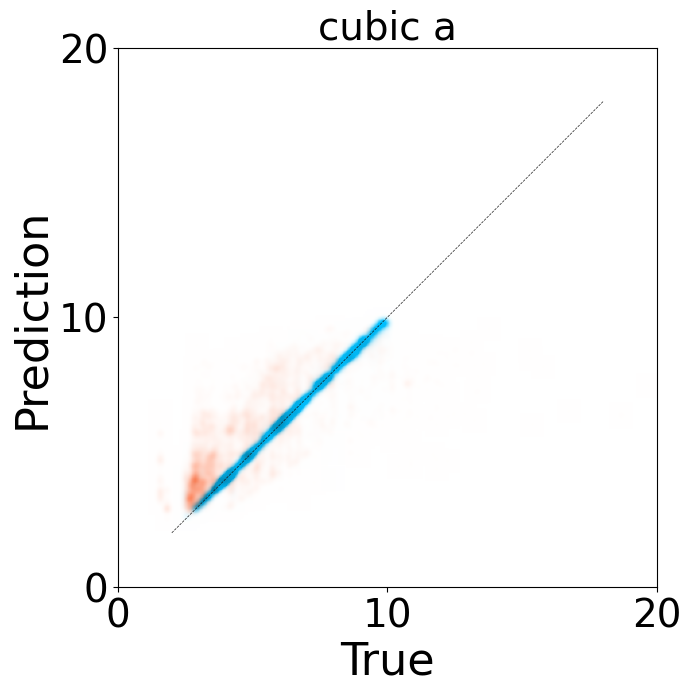

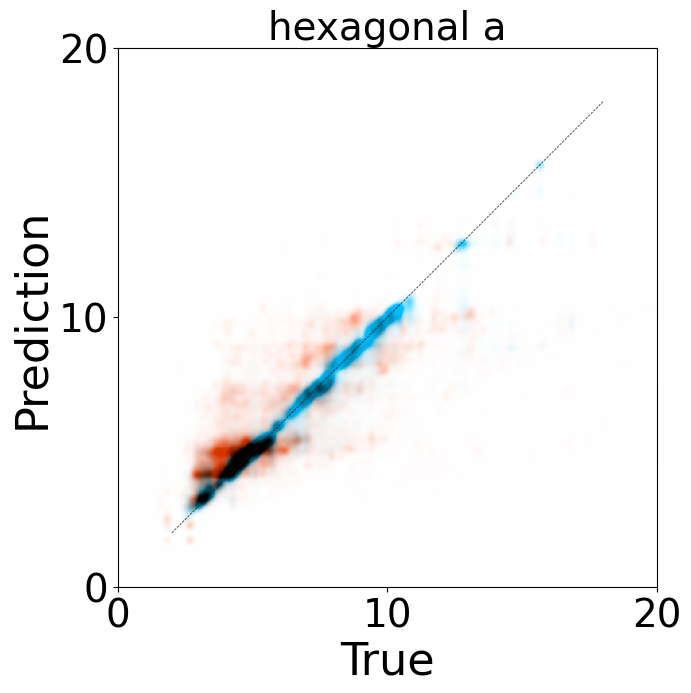

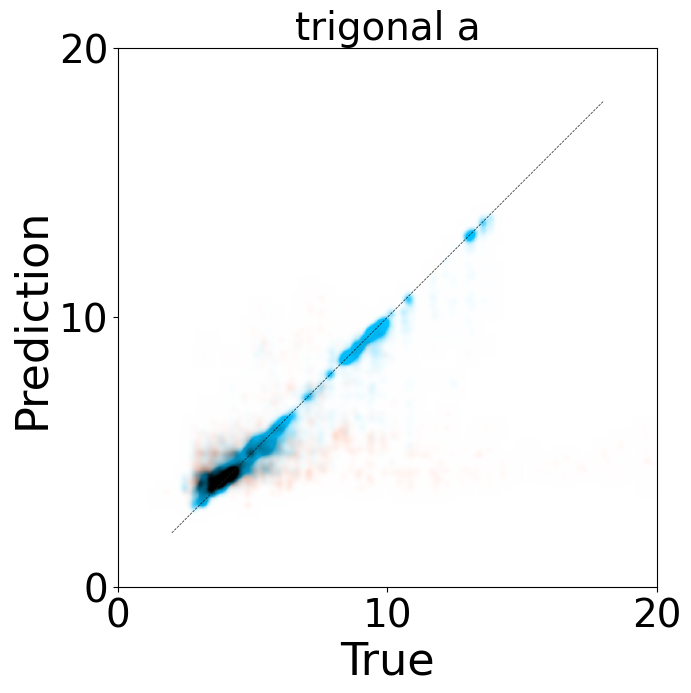

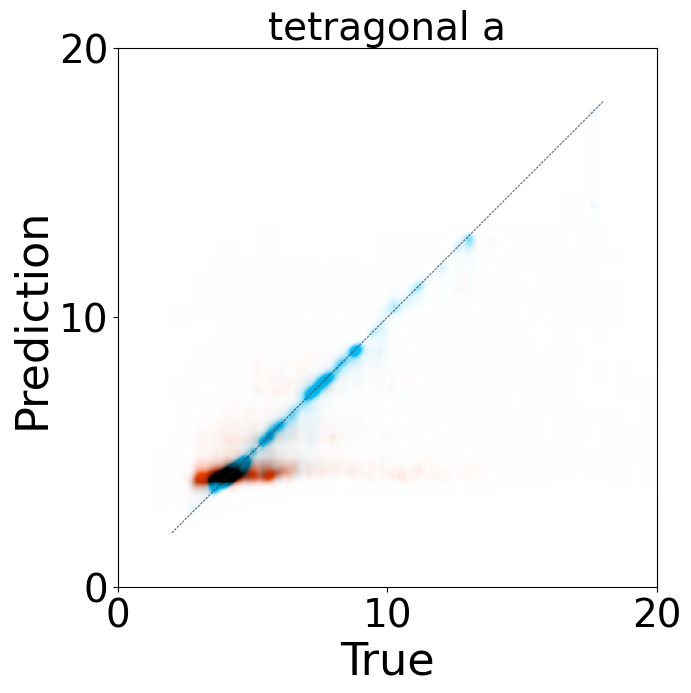

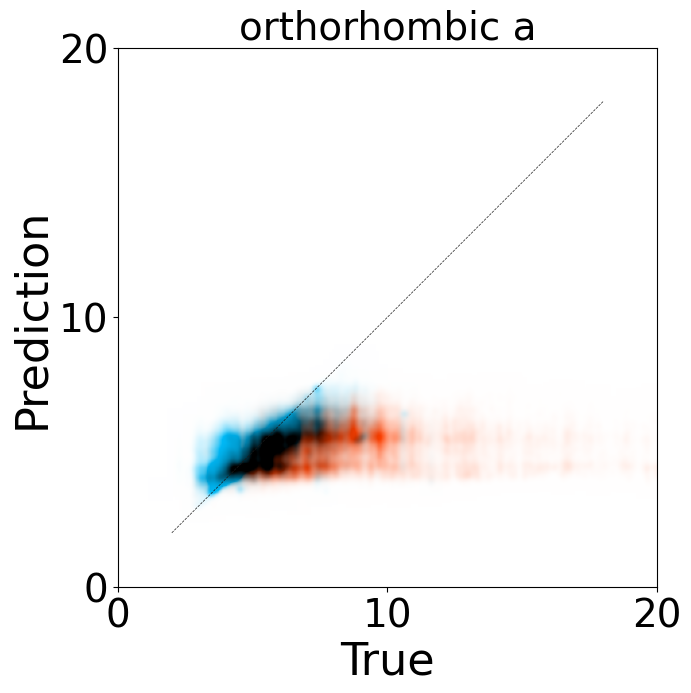

...

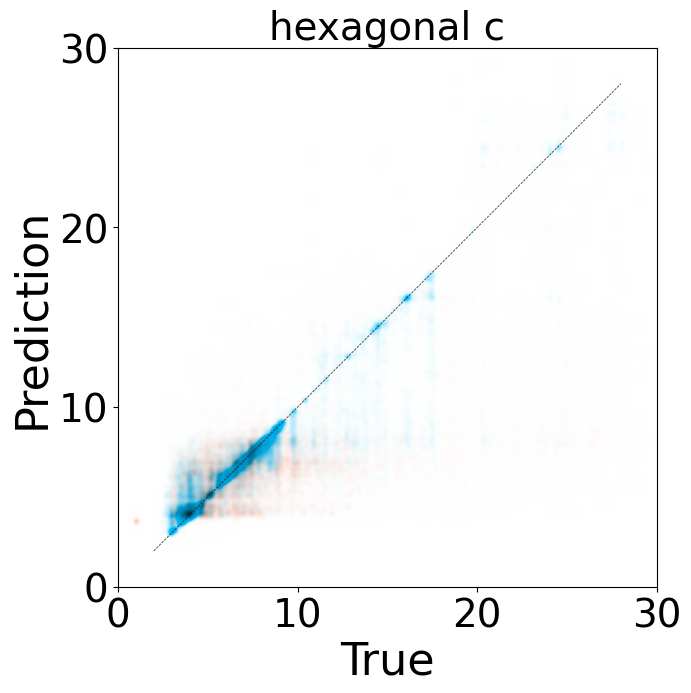

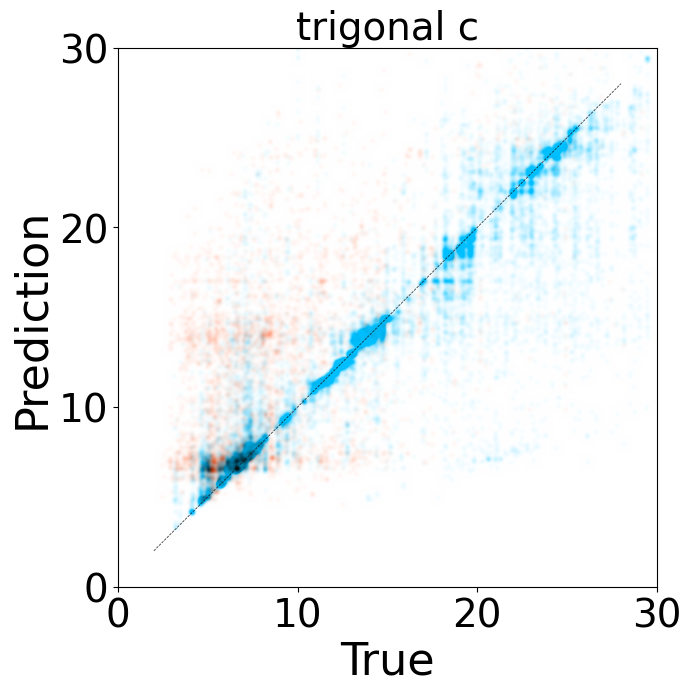

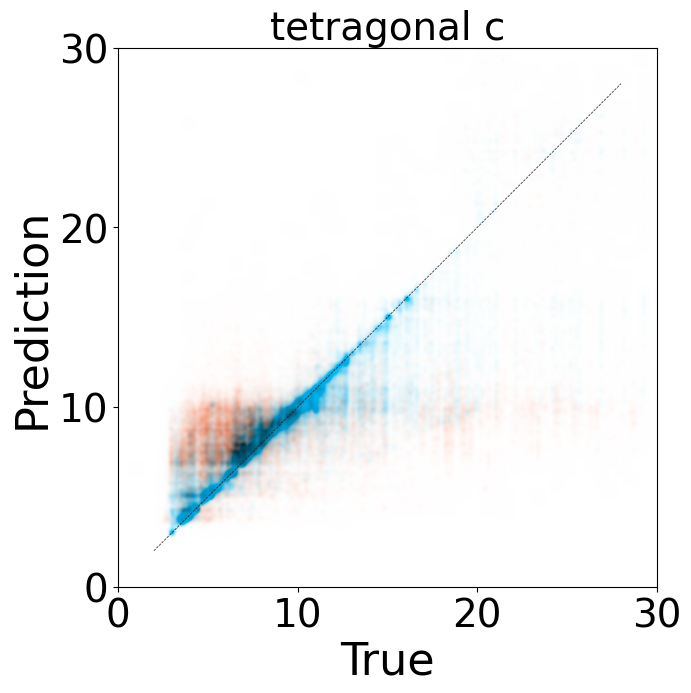

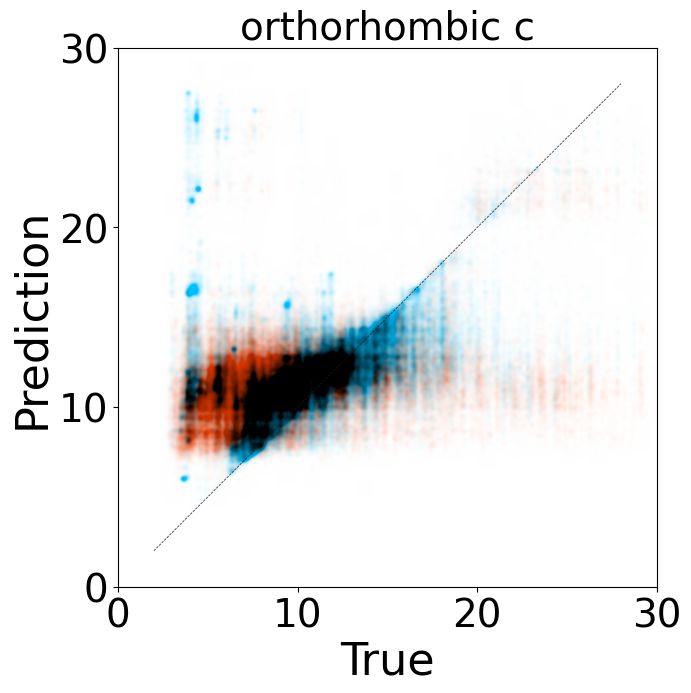

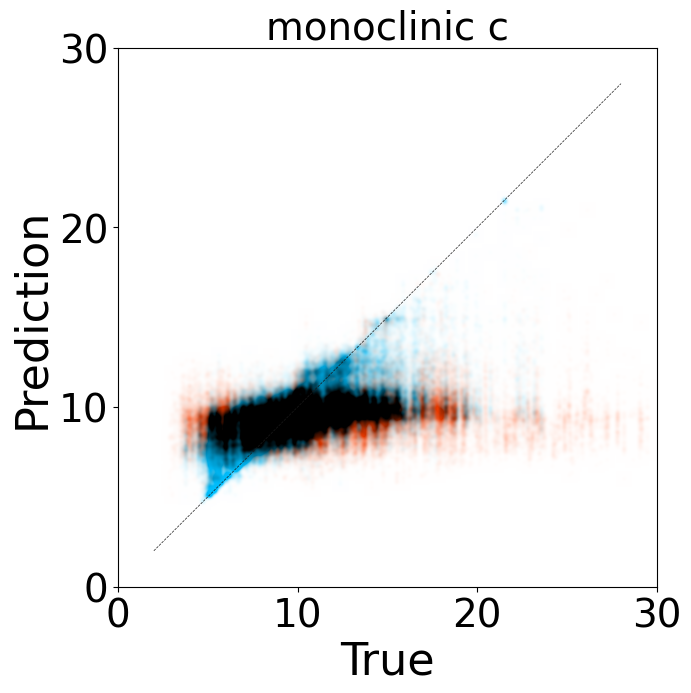

In [7]:
mpl.style.use('default')
for param in ['a', 'b', 'c']:
    for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
        output_set = np.load('/pscratch/sd/s/smglsn12/ML_Crystal_Structure_Diffraction/Model_data/individual_pattern_'+cry_sys+'_'+param+'.npy', allow_pickle=True)
        true_val_acc = output_set[0]
        median_per_pattern_acc = output_set[1]
        true_val_inacc = output_set[2]
        median_per_pattern_inacc = output_set[3]
        # plt.figure(figsize=(8, 7))
        # plt.scatter(true_val_inacc, median_per_pattern_inacc, alpha = 0.1, label = "Innacurate Crystal System",
        #            color = '#FF7F0E')
        # plt.scatter(true_val_acc, median_per_pattern_acc, alpha = 0.1, label = 'True Crystal System',
        #            color = '#1F77B4')
        # plt.plot(np.linspace(min(true_val_inacc), max(true_val_inacc), 100),
        #          np.linspace(min(true_val_inacc), max(true_val_inacc), 100), linestyle = '--', color = 'k')
        # plt.yticks(fontsize=20)
        # plt.xticks(fontsize = 20)
        # plt.xlabel('True', fontsize = 30)
        # plt.ylabel('Prediction', fontsize = 30)
        # plt.legend(fontsize = 18)
        # plt.show()
        if param == 'a':
            rmax=20
        if param == 'b':
            rmax=20
        if param == 'c':
            rmax=30
        if param in ['a','b']:
            if cry_sys == 'cubic':
                scale_saturation = (5.0, 20.0)
            if cry_sys == 'hexagonal':
                scale_saturation = (15.0, 30.0)
            if cry_sys == 'trigonal':
                scale_saturation = (25.0, 25.0)
            if cry_sys == 'tetragonal':
                scale_saturation = (30.0, 25.0)
            if cry_sys == 'orthorhombic':
                scale_saturation = (10.0, 10.0)
            if cry_sys == 'monoclinic':
                scale_saturation = (15.0, 10.0)
                
        if param in ['c']:
            if cry_sys == 'cubic':
                scale_saturation = (5.0, 25.0)
            if cry_sys == 'hexagonal':
                scale_saturation = (30, 25.0)
            if cry_sys == 'trigonal':
                scale_saturation = (25.0, 25.0)
            if cry_sys == 'tetragonal':
                scale_saturation = (27.5, 25.0)
            if cry_sys == 'orthorhombic':
                scale_saturation = (20.0, 20.0)
            if cry_sys == 'monoclinic':
                scale_saturation = (20.0, 20.0)
        fig,ax = plot_hist_2D(
                true_val_acc,
                median_per_pattern_acc,
                true_val_inacc,
                median_per_pattern_inacc,
                figsize = (8, 7),
                r_max = rmax,
                scale_saturation = scale_saturation,
                title=cry_sys+' '+param,
                dr=0.05,
                r_sigma=0.1
                )
        
        plt.rcParams['pdf.fonttype'] = 'truetype'
        # fig.savefig('Individual Pattern '+cry_sys+' '+param+'.pdf', bbox_inches="tight")

In [ ]:
pattern_output = np.load('individual_pattern_cubic_a.npy', allow_pickle=True)

true_val_acc = tetragonal_a[0]
median_per_pattern_acc = tetragonal_a[1]
true_val_inacc = tetragonal_a[2]
median_per_pattern_inacc = tetragonal_a[3]

plt.figure(figsize=(8, 7))

plt.scatter(true_val_inacc, median_per_pattern_inacc, alpha = 0.1, label = "Innacurate Crystal System", 
           color = '#ff7f0e')

plt.scatter(true_val_acc, median_per_pattern_acc, alpha = 0.1, label = 'True Crystal System',
           color = '#1f77b4')


plt.plot(np.linspace(min(true_val_inacc), max(true_val_inacc), 100), 
         np.linspace(min(true_val_inacc), max(true_val_inacc), 100), linestyle = '--', color = 'k')
plt.yticks(fontsize=20)
plt.xticks(fontsize = 20)   
plt.xlabel('True', fontsize = 30)
plt.ylabel('Prediction', fontsize = 30)
plt.legend(fontsize = 18)
plt.show()

cubic
Median
a
Median All 0.02999999999999936


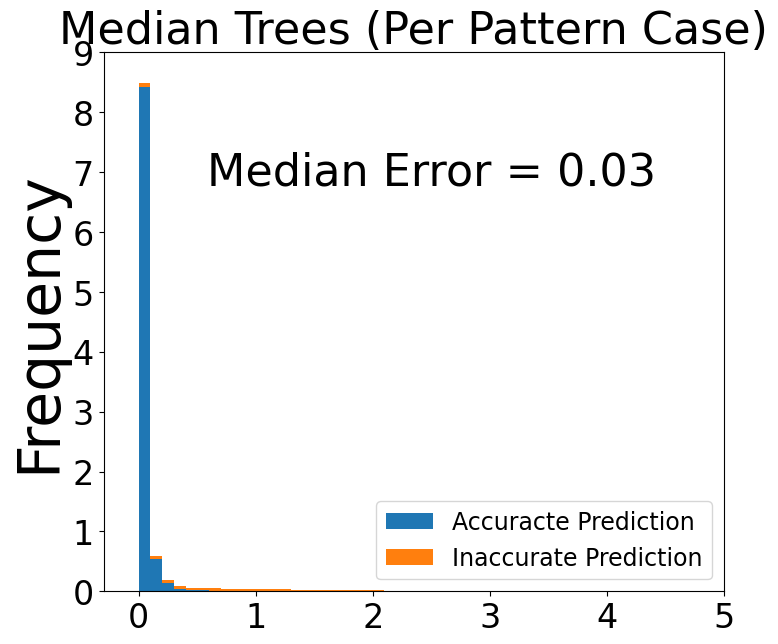

b
Median All 0.02999999999999936


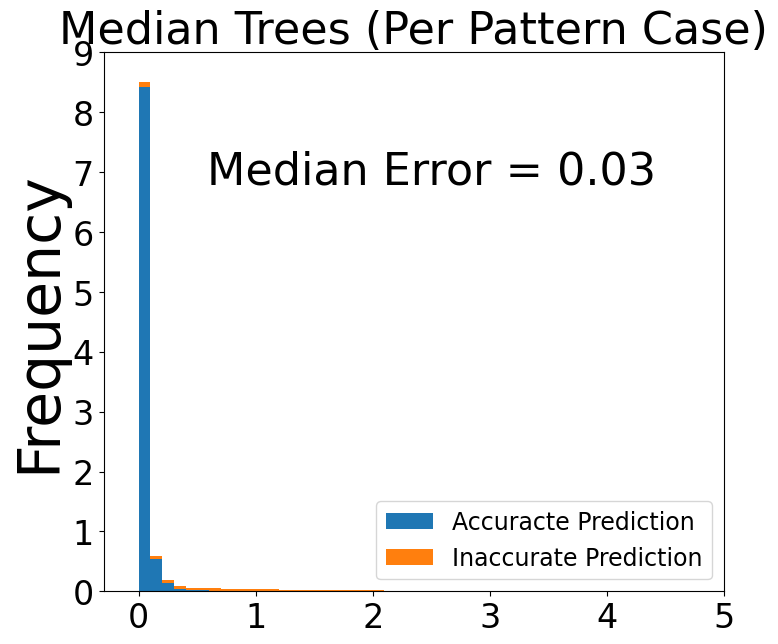

c
Median All 0.02999999999999936


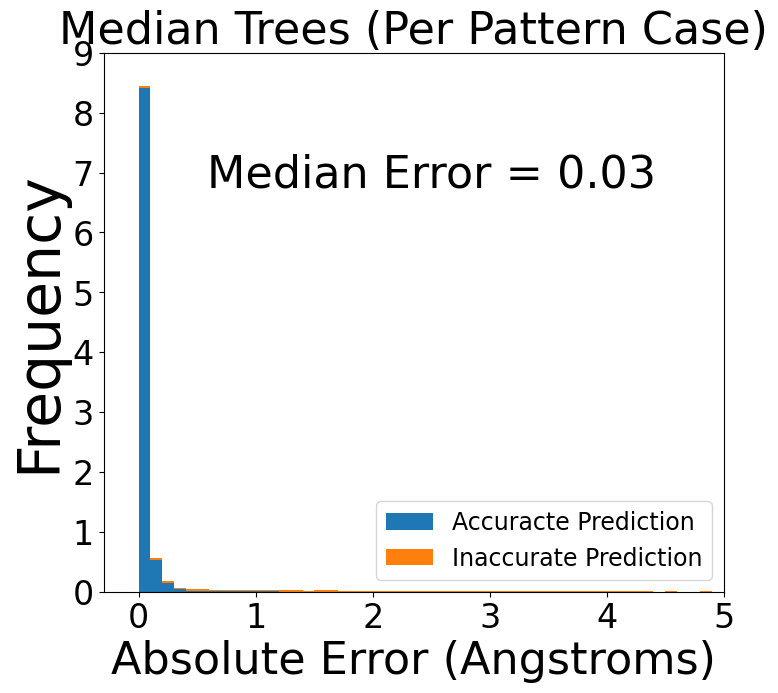

hexagonal
Median
a
Median All 0.1200000000000001


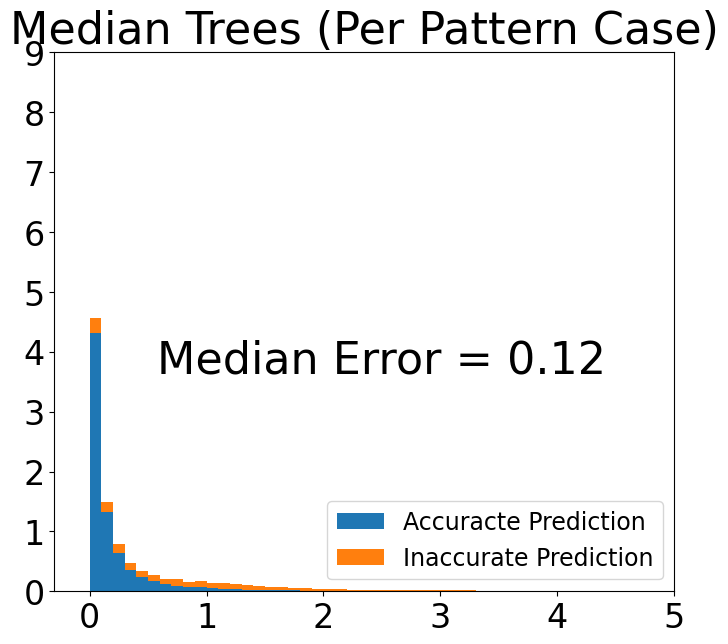

b
Median All 0.1200000000000001


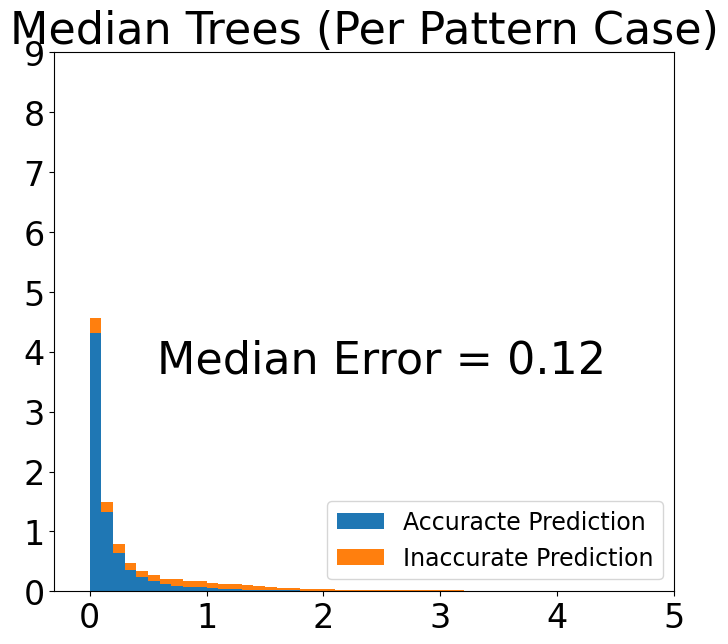

c
Median All 0.25500000000000034


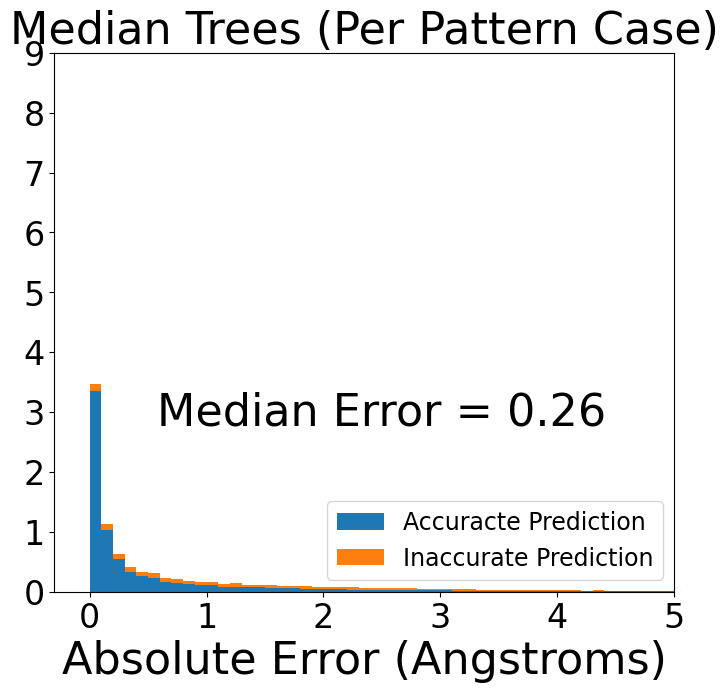

trigonal
Median
a
Median All 0.09000000000000075


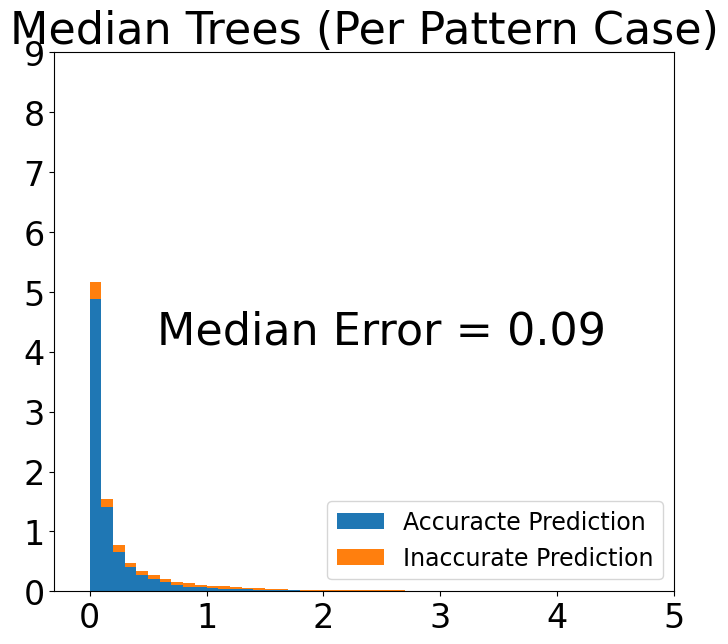

b
Median All 0.09000000000000075


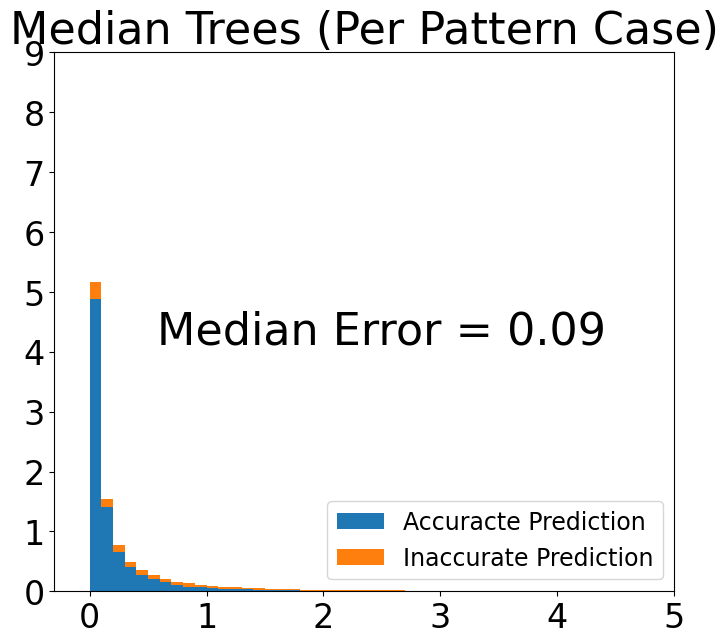

c
Median All 0.5950000000000006


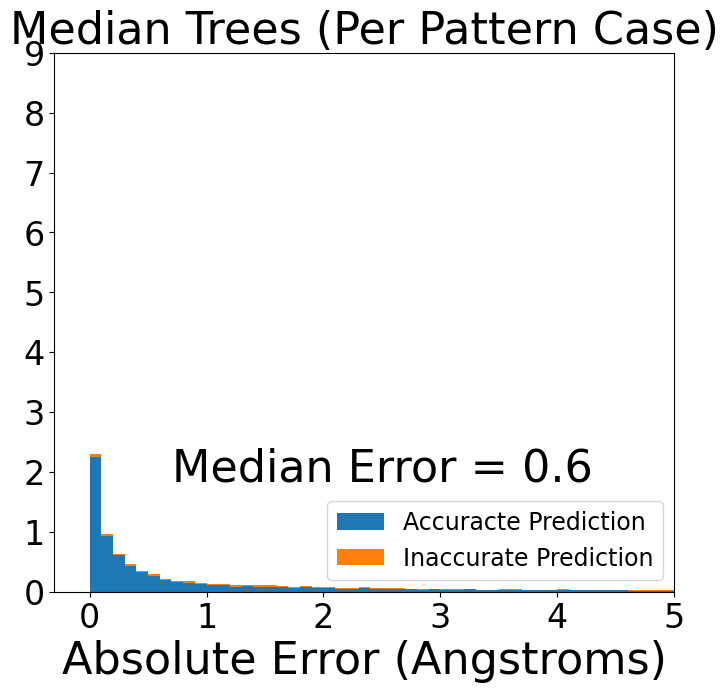

tetragonal
Median
a
Median All 0.13000000000000078


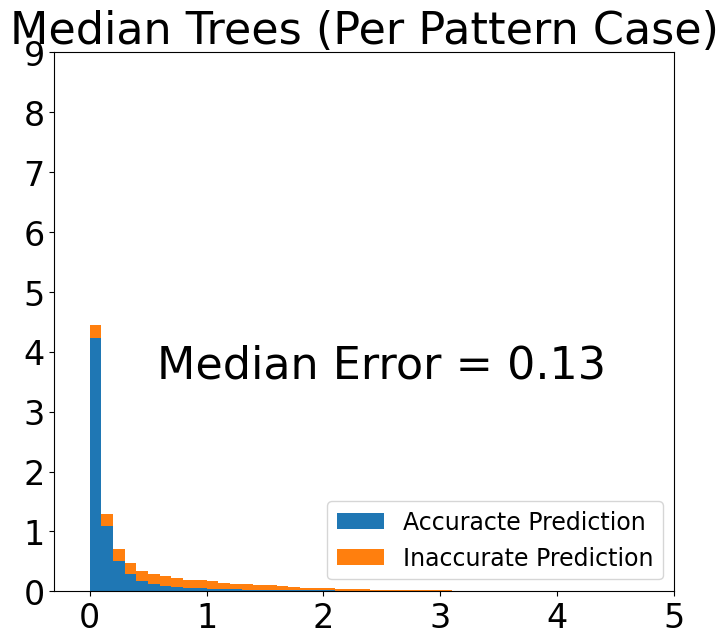

b
Median All 0.1299999999999999


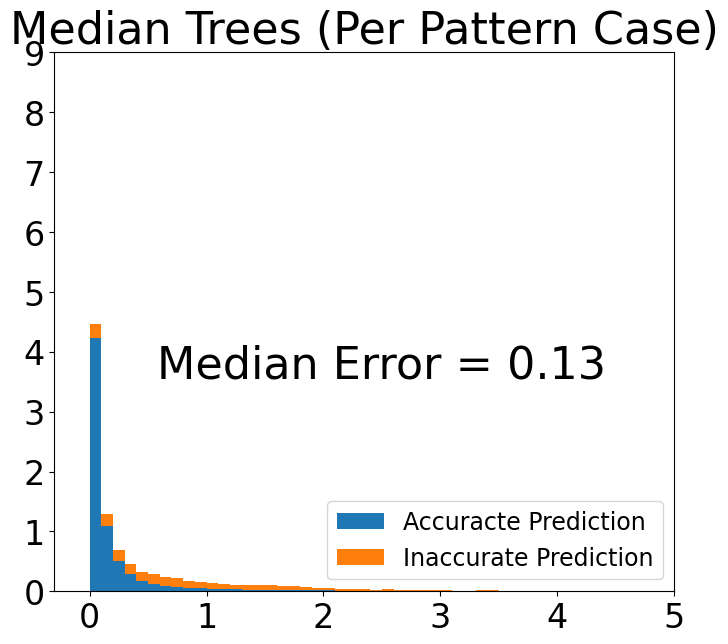

c
Median All 0.5400000000000009


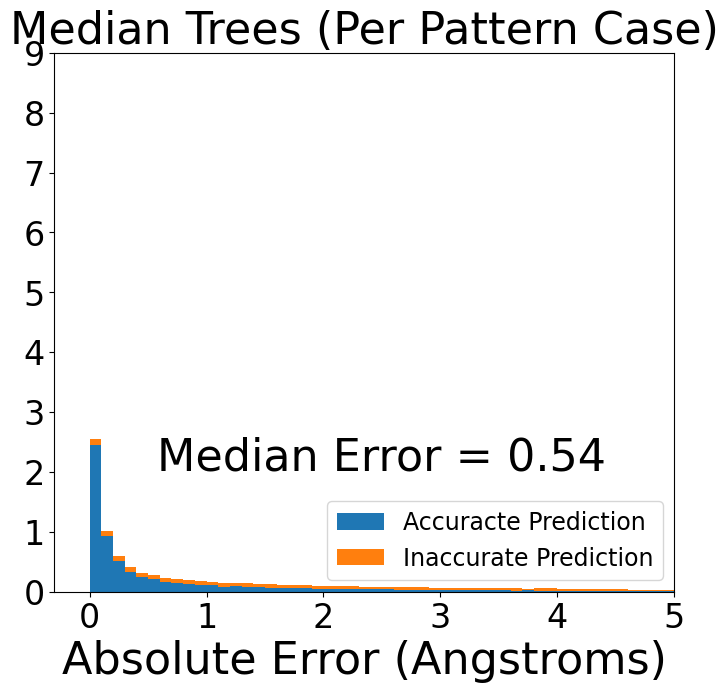

orthorhombic
Median
a
Median All 0.6100000000000003


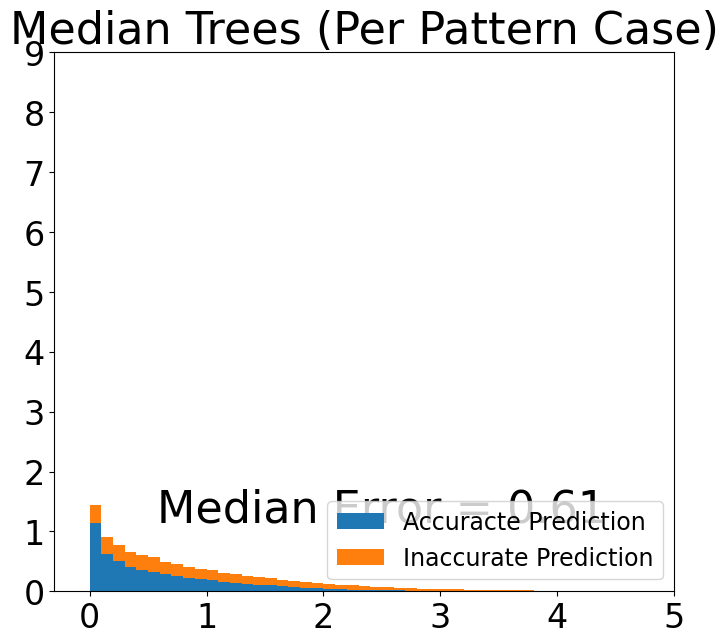

b
Median All 0.7649999999999997


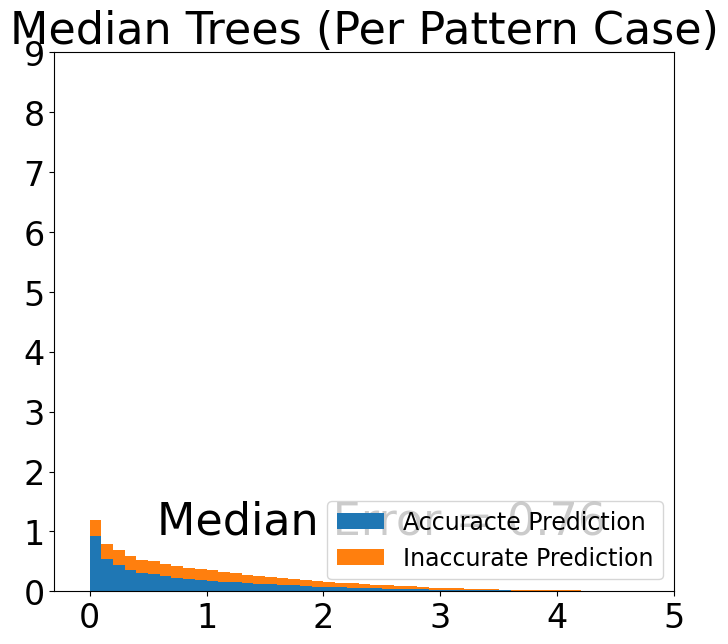

c
Median All 1.3650000000000002


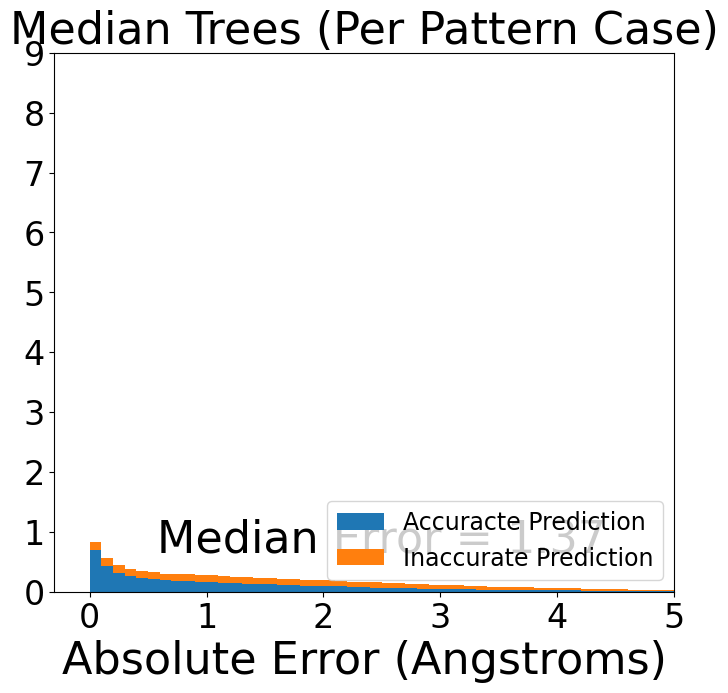

monoclinic
Median
a
Median All 1.2449999999999992


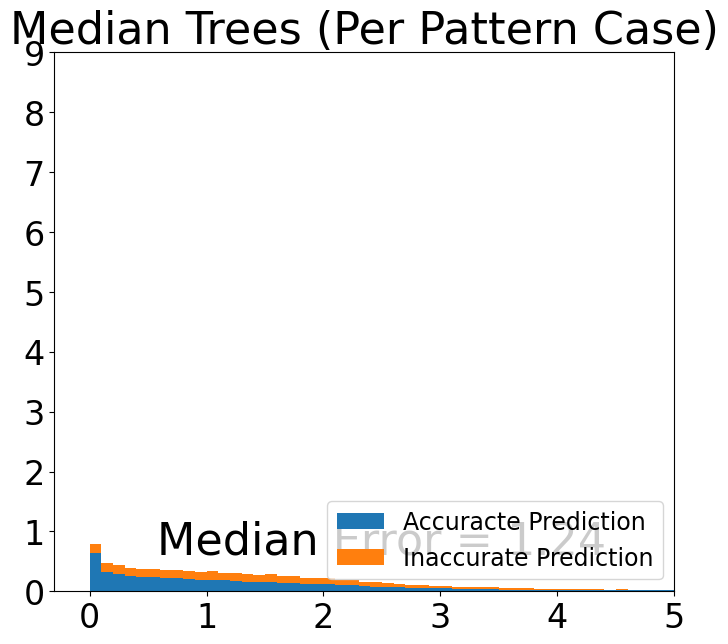

b
Median All 1.1050000000000004


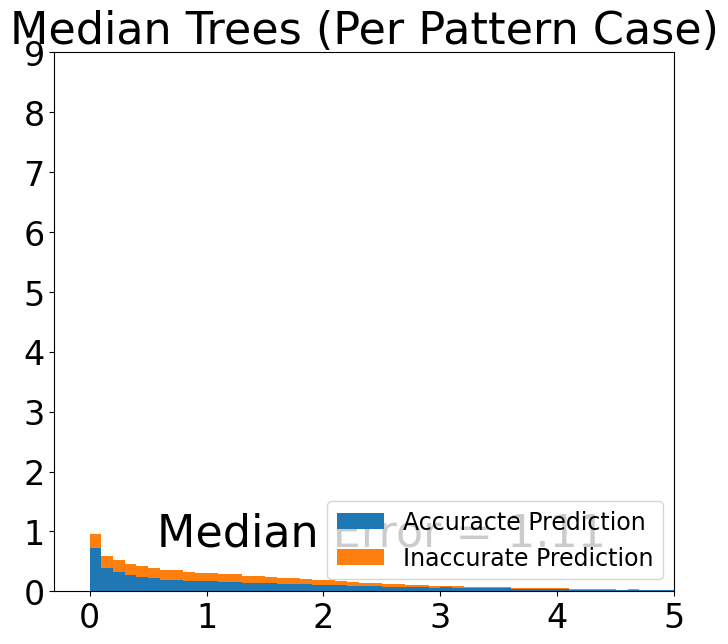

c
Median All 1.4749999999999996


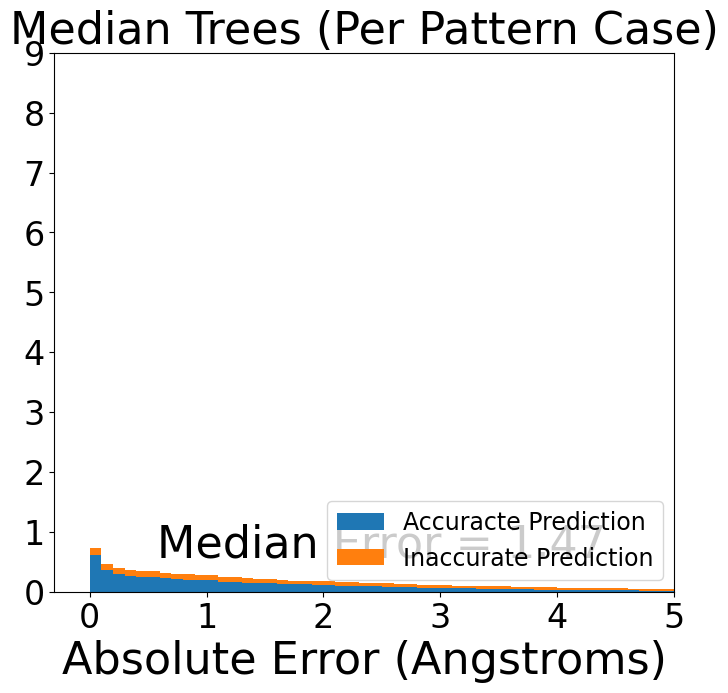

In [14]:
median_errors_full = []
xlims = [[-0.3, 5], [-0.3, 5], [-0.3, 5], [-0.3, 5], [-0.3, 5], [-0.3,5]]
count = 0

for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
# for cry_sys in ['hexagonal']:
    print(cry_sys)
    # for pred_type in ['Mean', 'Median']:
    for pred_type in ['Median']:
        print(pred_type)

        median_errors = rf_diff_obj.visualize_lattice_results_individual(cry_sys, cry_sys_type = 'Predictions Crystal System', 
                                                             prediction_type = pred_type, show_hists = True, show_r2 = False,  savefig=True,
                                                                         update_output_df_with_lattice = False, load_lattice_output_df_from_path = False,
                                                            output_df_path = 'Model_data/Crystal_sys_outputs/Ortho_fixed_MONO_FIXED_LATTICE_UPDATED_output_df_radial.joblib',
                                                                        xlim=xlims[count], use_xlim = True, ylims = [0,9])
        median_errors_full.append(median_errors)
        count += 1

In [ ]:
median_errors_full = []
xlims = [[-0.3, 5], [-0.3, 5], [-0.3, 5], [-0.3, 5], [-0.3, 5], [-0.3,5]]
count = 0

for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
# for cry_sys in ['hexagonal']:
    print(cry_sys)
    # for pred_type in ['Mean', 'Median']:
    for pred_type in ['Median']:
        print(pred_type)

        median_errors = rf_diff_obj.visualize_lattice_results_individual(cry_sys, cry_sys_type = 'Predictions Crystal System', 
                                                             prediction_type = pred_type, show_hists = True, show_r2 = False,  savefig=False,
                                                                         update_output_df_with_lattice = False, load_lattice_output_df_from_path = False,
                                                            output_df_path = 'Model_data/Crystal_sys_outputs/Ortho_fixed_MONO_FIXED_LATTICE_UPDATED_output_df_radial.joblib',
                                                                        xlim=xlims[count], use_xlim = True, ylims = [0,9])
        median_errors_full.append(median_errors)
        count += 1

In [26]:
rf_diff_obj.condensed_output_df.iloc[0]['Full Df Indicies']

[1345, 1349, 1332, 1343, 1308, 1400, 1388, 1333, 1343, 1366]

In [35]:
for mat in rf_diff_obj.output_df.mat_id.unique():
    a1 = rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df['mat_id'] == mat]['true_cry_sys_full_predictions_a'].iloc[0][0][0]
    a2 = rf_diff_obj.output_df.loc[rf_diff_obj.output_df['mat_id'] == mat]['true_cry_sys_full_predictions_a'].iloc[0][0]
    if a1!=a2:
        print(a1, a2, mat)

In [27]:
rf_diff_obj.add_lattice_data_to_condensed_df()

df ready
trigonal
model loaded
hexagonal
model loaded
monoclinic
model loaded
orthorhombic
model loaded
tetragonal
model loaded
cubic
model loaded


In [33]:
# joblib.dump(rf_diff_obj.condensed_output_df, 'Model_data/Crystal_sys_outputs/10_pattern_lattice_added_difference_aggregation_condensed_df.joblib')

['Model_data/Crystal_sys_outputs/10_pattern_lattice_added_difference_aggregation_condensed_df.joblib']

In [ ]:
# individual pattern space group prediction 

In [26]:
for cry_sys in ['cubic']:
    df = rf_diff_obj.show_individual_sg_predictions(cry_sys, use_only_correct_cry_sys=False)
    # 0.8763960923793728

cubic


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.2s remaining:    9.1s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.5s remaining:    0.5s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.6s finished


Accurate Accuracy


KeyError: 'True Value Space Group'

In [54]:
for cry_sys in ['cubic', 'hexagonal','trigonal','tetragonal', 'monoclinic', 'orthorhombic']:
    df = rf_diff_obj.show_individual_sg_predictions(cry_sys, use_only_correct_cry_sys=False)

cubic


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.1s remaining:    5.8s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.4s remaining:    0.3s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.5s finished


Accurate Accuracy
0.933408929206688
Inaccurate Accuracy
0.0
All Accuracy
0.8618028041795824
hexagonal


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.4s remaining:   15.5s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.6s remaining:    0.5s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.7s finished


Accurate Accuracy
0.8352503702769987
Inaccurate Accuracy
0.0
All Accuracy
0.6519413117536372
trigonal


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.1s remaining:    3.0s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.2s finished


Accurate Accuracy
0.8300305786108574
Inaccurate Accuracy
0.0
All Accuracy
0.7124936083177092
tetragonal


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.5s remaining:   20.5s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    1.1s remaining:    1.0s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    1.4s finished


Accurate Accuracy
0.7662358258663072
Inaccurate Accuracy
0.0
All Accuracy
0.5396515134591757
monoclinic


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.3s remaining:   12.9s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.7s remaining:    0.6s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.9s finished


Accurate Accuracy
0.6471069770137425
Inaccurate Accuracy
0.0
All Accuracy
0.4031739010728616
orthorhombic


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    1.2s remaining:   51.1s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    3.3s remaining:    2.9s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    4.2s finished


Accurate Accuracy
0.5470361048932395
Inaccurate Accuracy
0.0
All Accuracy
0.309605001887195


In [10]:
# rf_diff_obj.condense_crystal_system_output(method = 'Difference Aggregation')

In [48]:
# joblib.dump(rf_diff_obj.condensed_output_df, 'Model_data/Crystal_sys_outputs/difference_aggregation_condensed_df.joblib')

In [49]:
rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df.mat_id == 'mp-1001786']

,index,mat_id,True Values Crystal System,Full Predictions Crystal System,Aggregate Predictions Crystal System,Prediction Confidence,Full Df Indicies,Averaged Weights Crystal System,Full Weights Crystal System,pred_cry_sys_full_predictions_a,...,true_median_a,full_true_median_a,true_median_b,full_true_median_b,true_median_c,full_true_median_c,reference_id,true_a,true_b,true_c
2,0,mp-1001786,trigonal,NaN,trigonal,0.816171,"[2520, 2521, 2522, 2523, 2524, 2525, 2526, 252...","{'cubic': [0.037500000000000006, 0.03749999999...","{'cubic': 0.20000000000000007, 'hexagonal': 0....","[[3.44, 3.43, 3.5, 4.75, 6.26, 3.53, 2.87, 4.9...",...,3.73,"[3.73, 3.895, 3.84, 3.67, 3.815, 3.795, 3.7350...",3.73,"[3.73, 3.895, 3.84, 3.67, 3.815, 3.795, 3.7350...",17.13,"[18.71, 11.844999999999999, 18.740000000000002...",mp-1001786,3.69,3.69,18.15


In [32]:
rf_diff_obj.condensed_output_df.iloc[2]['Averaged Weights Crystal System']

{'cubic': [0.06250000000000003],
 'hexagonal': [],
 'tetragonal': [0.06249999999999997, 0.024999999999999994],
 'trigonal': [0.22500000000000003,
  0.39999999999999997,
  0.0875,
  0.0875,
  0.037500000000000006,
  0.22500000000000003],
 'monoclinic': [],
 'orthorhombic': [0.0]}

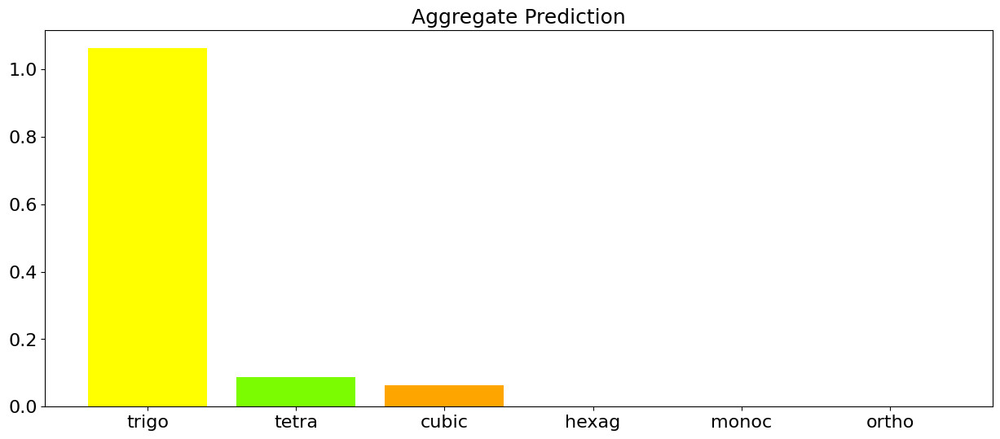

In [13]:
sorted_df = sorted(rf_diff_obj.condensed_output_df.iloc[2]['Full Weights Crystal System'].items(), key=lambda x: x[1], reverse=True)

labels = []
for i in sorted_df:
    labels.append(i[0][0:5])
plt.figure(figsize = (15,6))
# plt.title(rf_diff_obj.condensed_output_df.iloc[0]['mat_id'] + ' Difference Aggregate', fontsize = 18)
plt.title('Aggregate Prediction', fontsize = 18)
colors = ['yellow', 'lawngreen', 'orange', 'purple', 'orange', 'deepskyblue']
for i in range(0, 6): 
    plt.bar(labels[i], sorted_df[i][1], color = colors[i])
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.savefig('agg_pred_example'+'.pdf', bbox_inches="tight")
plt.show()

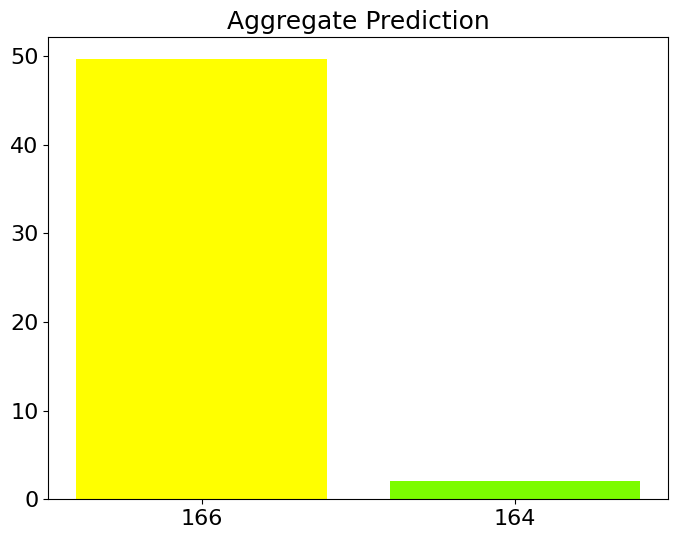

In [47]:
sorted_df = sorted(out_df.loc[out_df['material_id'] == 'mp-1001786']['averaged_weights_space_group'].items(), key=lambda x: x[1], reverse=True)[0][1]

labels = []
for i in sorted_df.keys():
    labels.append(i[0:5])
plt.figure(figsize = (8,6))
# plt.title(rf_diff_obj.condensed_output_df.iloc[0]['mat_id'] + ' Difference Aggregate', fontsize = 18)
plt.title('Aggregate Prediction', fontsize = 18)
colors = ['yellow', 'lawngreen', 'orange', 'purple', 'orange', 'deepskyblue']
for i in range(0, 2): 
    plt.bar(labels[i], sorted_df[labels[i]], color = colors[i])
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.savefig('SG_agg_pred_example'+'.pdf', bbox_inches="tight")
plt.show()

In [39]:
sorted_df[0][1]

{'166': 49.6484375,
 '164': 2.0390625,
 '161': 0,
 '162': 0,
 '160': 0,
 '163': 0,
 '148': 0,
 '167': 0,
 '158': 0,
 '156': 0,
 '150': 0,
 '147': 0,
 '152': 0,
 '154': 0,
 '146': 0,
 '145': 0,
 '149': 0,
 '157': 0,
 '165': 0,
 '155': 0,
 '144': 0,
 '159': 0,
 '151': 0}

In [14]:
count = 0
for i in range(0, len(rf_diff_obj.condensed_output_df)):
    row = rf_diff_obj.condensed_output_df.iloc[i]
    if row['True Values Crystal System'] == row['Aggregate Predictions Crystal System']:
        count += 1
count

7033

In [15]:
count/len(rf_diff_obj.condensed_output_df)

0.8226693180488946

crystal system 0.7912036495496549


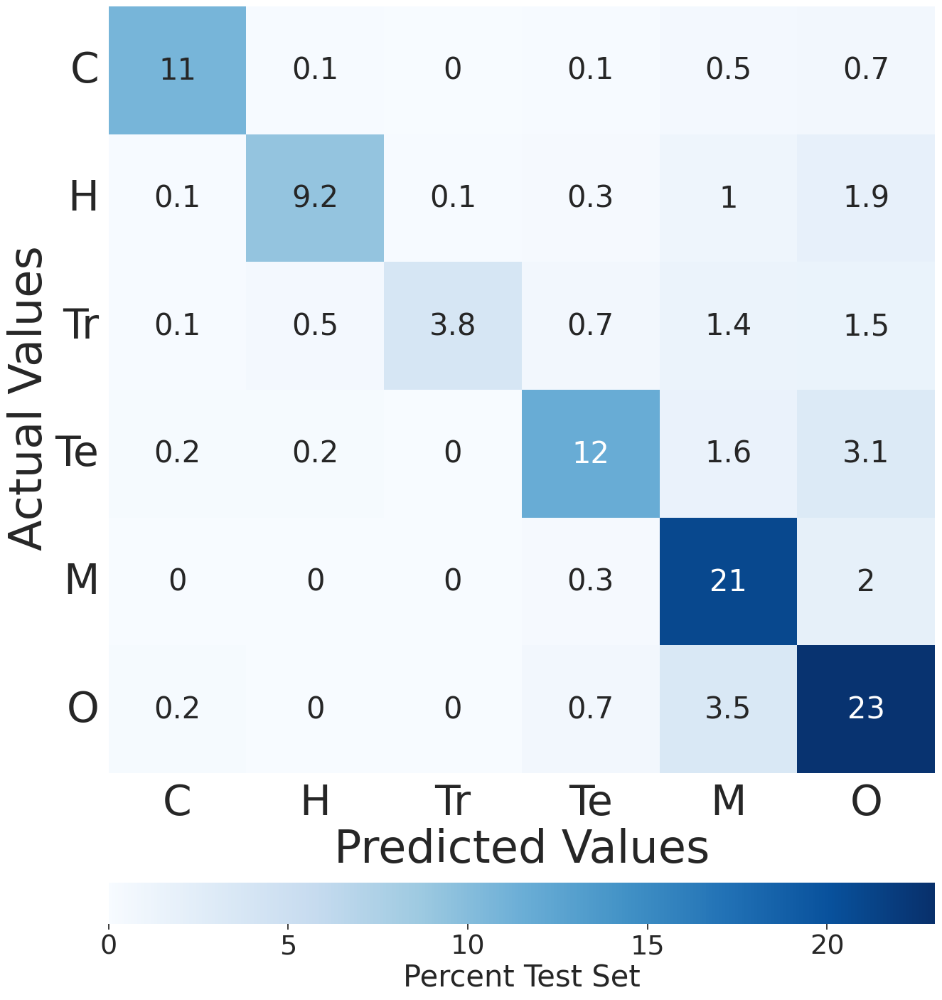

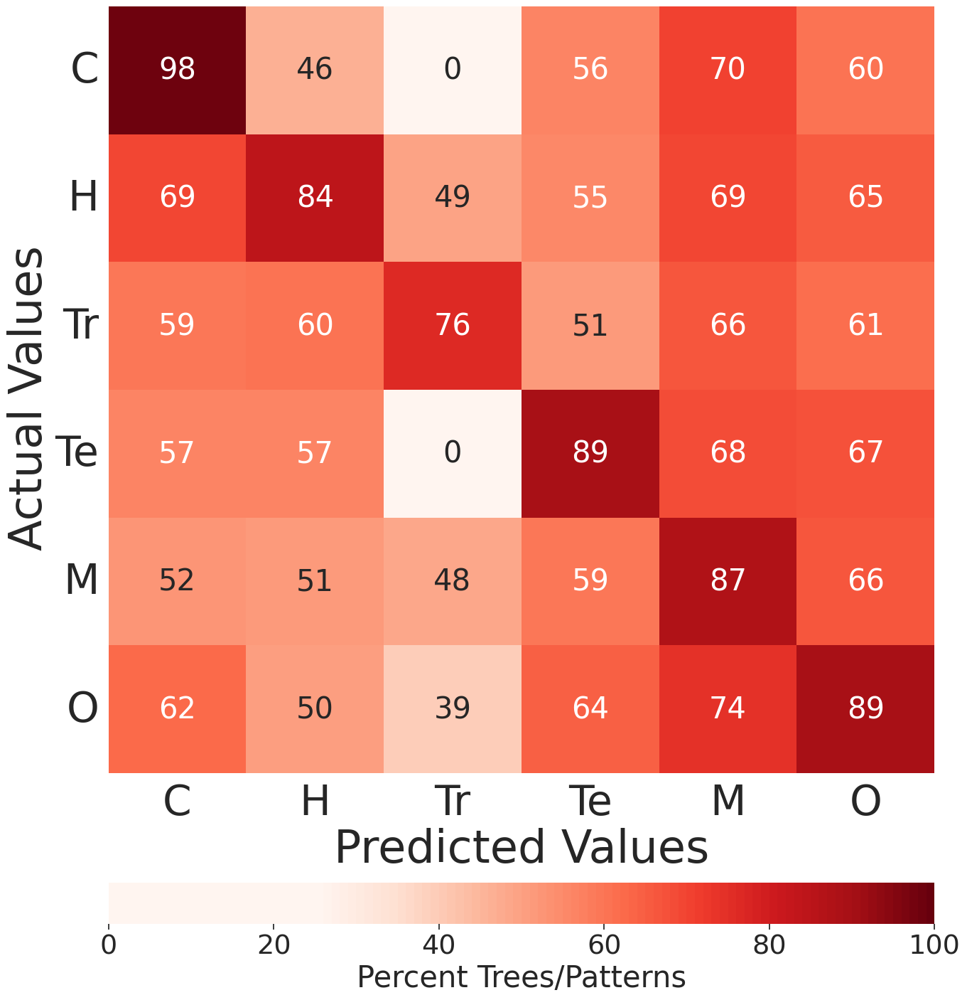

In [8]:
plt.rcParams['pdf.fonttype'] = 'truetype'
sn.set(font_scale=2.5)
rf_diff_obj.show_aggregate_confusion_matrix(show_individual = False, savefigure = True, 
                                              filenames = ['Figures/Figure 3/10_pattern_fig3_aggregate_prediction_accuracy',
                                                            'Figures/Figure 3/10_pattern_fig3_aggregate_prediction_confidence'])

In [ ]:
plt.rcParams['pdf.fonttype'] = 'truetype'
sn.set(font_scale=2.5)
rf_diff_obj.show_aggregate_confusion_matrix(show_individual = False, savefigure = True, 
                                              filenames = ['Figures/Figure 3/10_pattern_fig3_aggregate_prediction_accuracy',
                                                            'Figures/Figure 3/10_pattern_fig3_aggregate_prediction_confidence'])

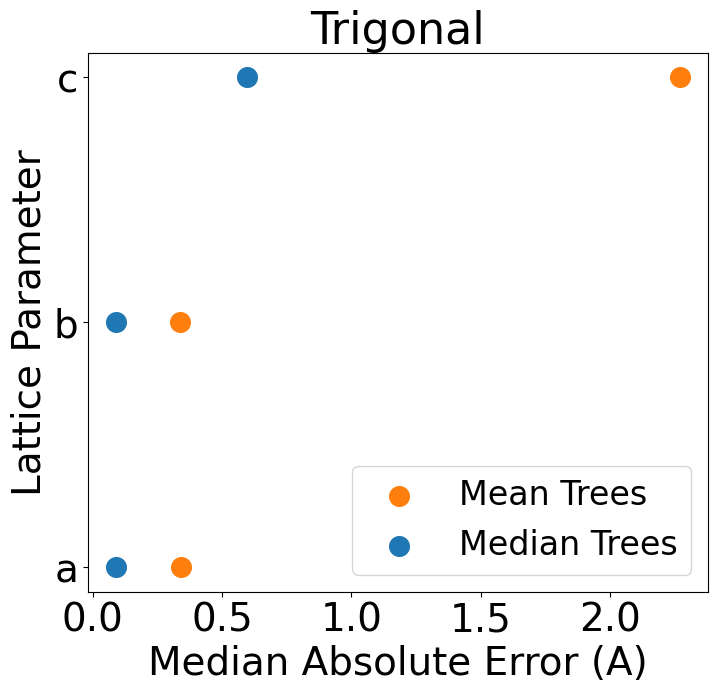

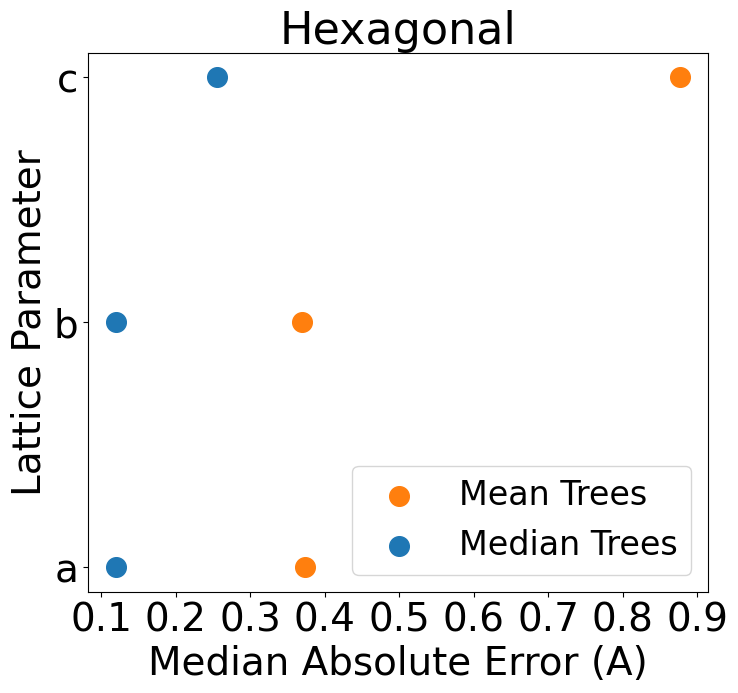

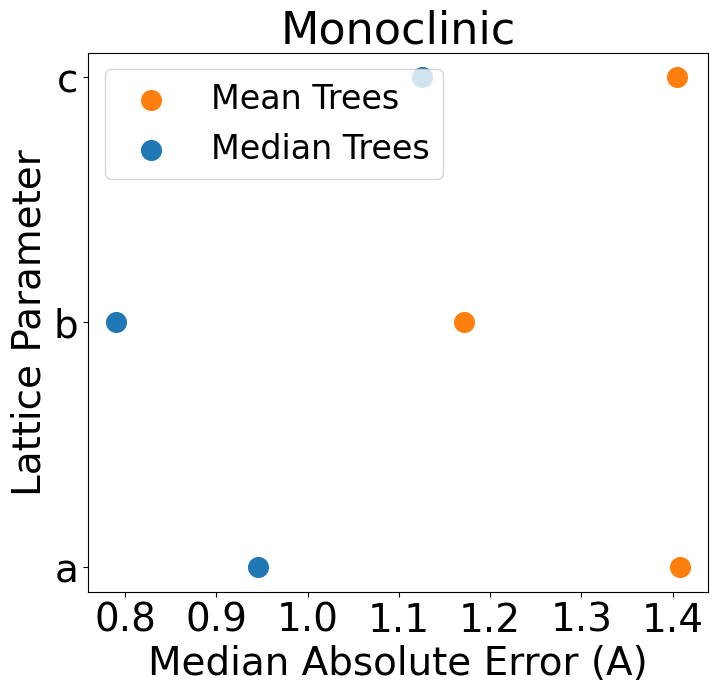

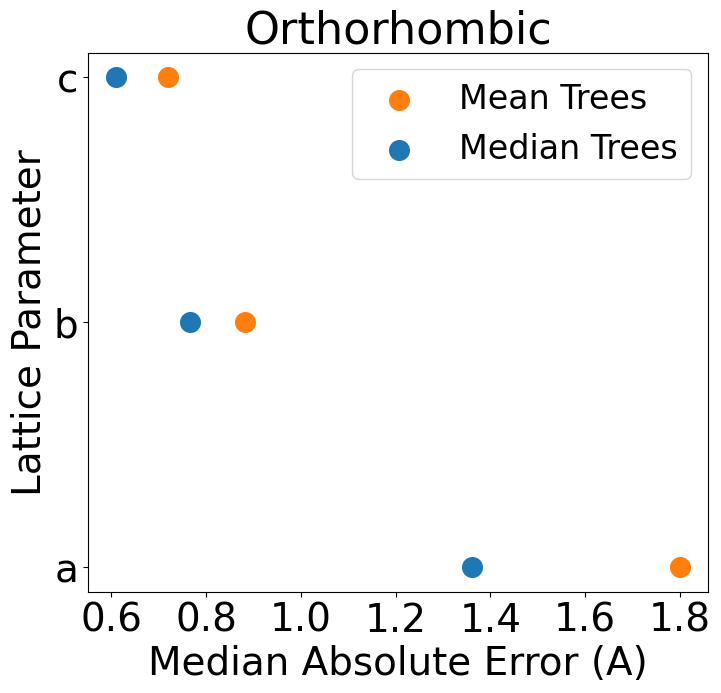

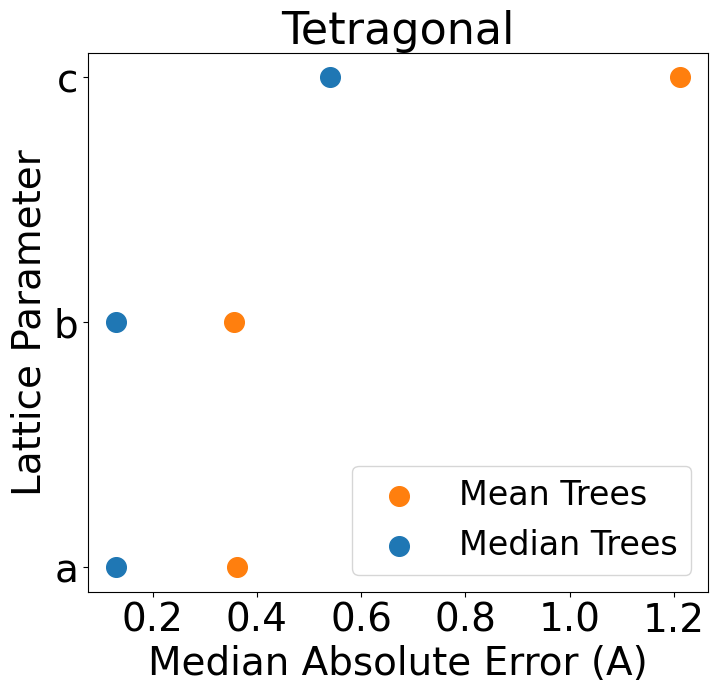

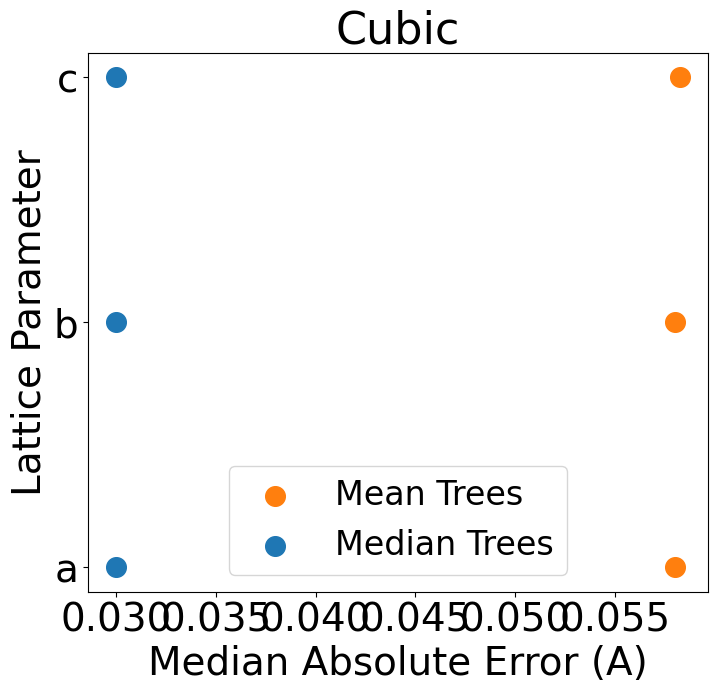

In [228]:
plt.style.use('default')

vals = np.arange(0, len(median_errors_full),2)
params = ['a', 'b', 'c']
cry_sys_vals = ['trigonal', 'hexagonal', 'monoclinic', 'orthorhombic', 'tetragonal', 'cubic']
count = 0
for i in vals:
    plt.figure(figsize = (8,7))
    plt.title(cry_sys_vals[count].capitalize(), fontsize = 32)
    plt.xticks(fontsize = 28)
    plt.yticks(fontsize = 28)
    plt.ylabel('Lattice Parameter', fontsize = 28)
    plt.xlabel('Median Absolute Error (A)', fontsize = 28)

    mean_vals = median_errors_full[i]
    median_vals = median_errors_full[i+1]
    if len(mean_vals) == 3:
        for k in range(0, len(mean_vals)):
            if k == 0:
                plt.scatter(mean_vals[k], params[k], s=200, color = '#ff7f0e', label = 'Mean Trees')
            else:
                plt.scatter(mean_vals[k], params[k], s=200, color = '#ff7f0e')

        for l in range(0, len(median_vals)):
            if l == 0:
                plt.scatter(median_vals[l], params[l], s=200, color = '#1f77b4', label = 'Median Trees')
            else:
                plt.scatter(median_vals[l], params[l], s=200, color = '#1f77b4')
                
    if len(mean_vals) > 3:
        for k in range(0, len(mean_vals)):
            if k == 0:
                plt.scatter(mean_vals[k], params[k], s=200, color = '#ff7f0e', label = 'Mean Trees')
            if k in [3,6]:
                ind = int(k/3)
                plt.scatter(mean_vals[k], params[ind], s=200, color = '#ff7f0e')

        for l in range(0, len(median_vals)):
            if l == 0:
                plt.scatter(median_vals[l], params[l], s=200, color = '#1f77b4', label = 'Median Trees')
            if l in [3,6]:
                ind=int(l/3)
                plt.scatter(median_vals[l], params[ind], s=200, color = '#1f77b4')

    plt.legend(fontsize = 24)
    count +=1 


In [4]:
# mono_train_ids = joblib.load('Model_data/Lattice_inputs_and_outputs/monoclinic_lattice_train_ids.joblib')

In [8]:
# 'mp-9850' in mono_train_ids

In [3]:
# rf_diff_obj.condensed_output_df = joblib.load('Model_data/Crystal_sys_outputs/10_pattern_lattice_added_difference_aggregation_condensed_df.joblib')

In [2]:
# rf_diff_obj.add_full_pred_median_to_condensed_df()

cubic
a
Median All 0.020000000000000462


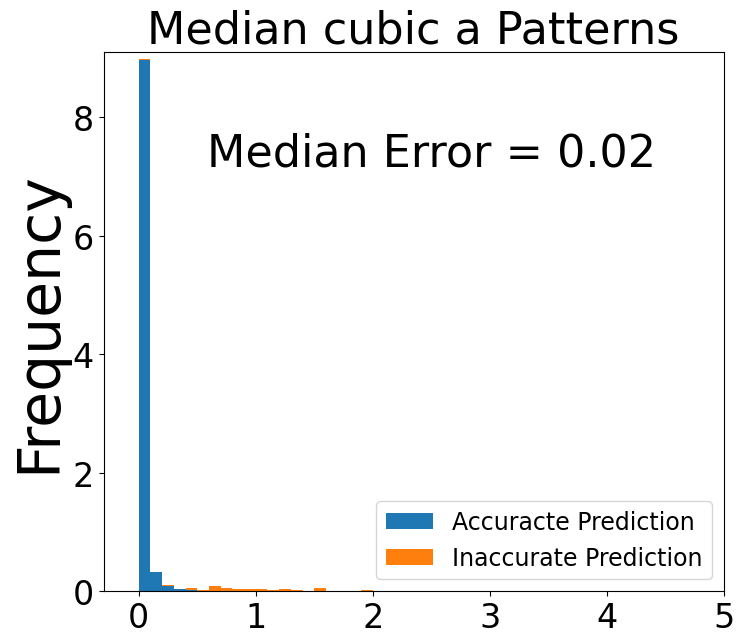

b
Median All 0.020000000000000462


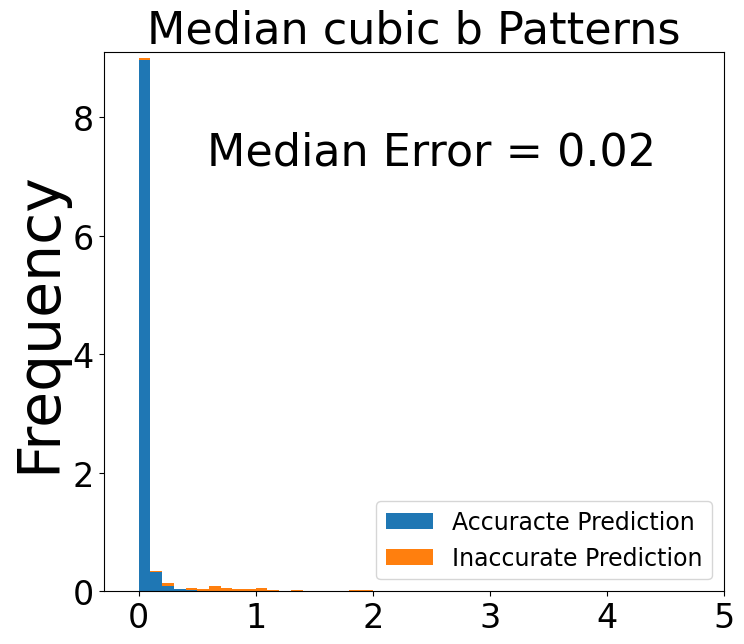

c
Median All 0.020000000000000462


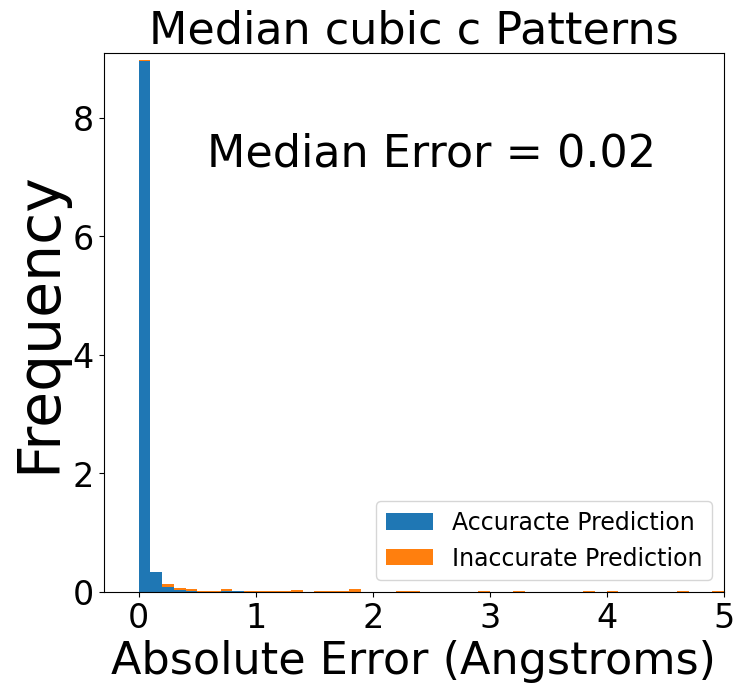

hexagonal
a
Median All 0.08500000000000085


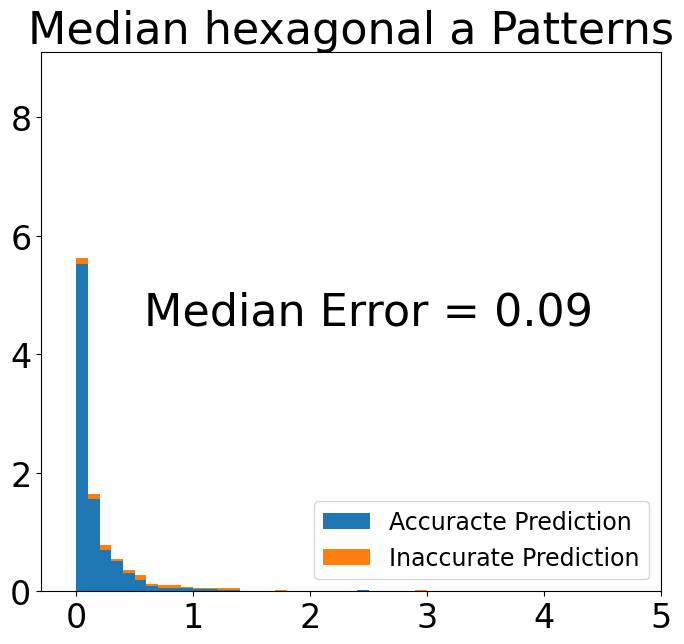

b
Median All 0.08500000000000085


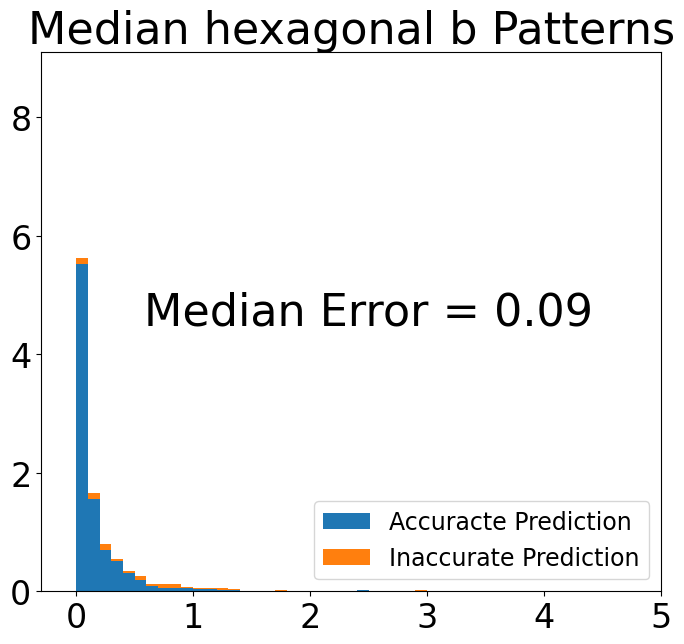

c
Median All 0.15499999999999936


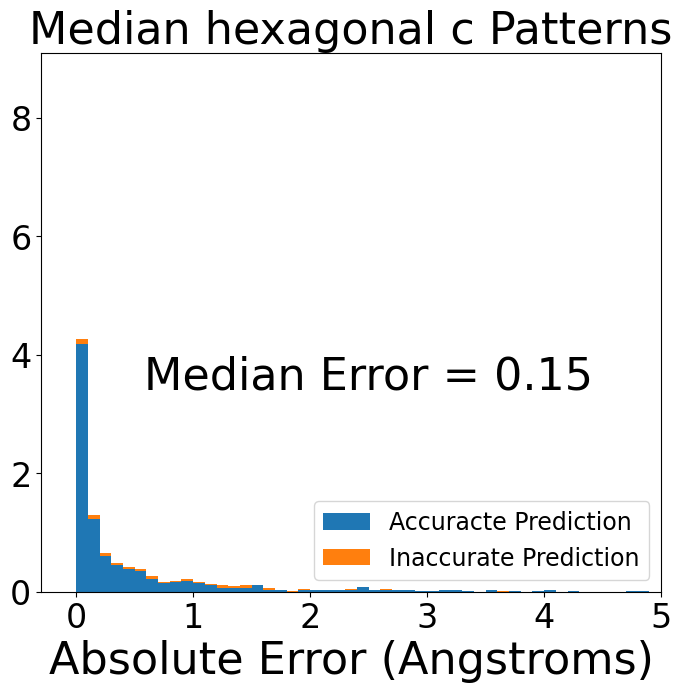

trigonal
a
Median All 0.06375000000000086


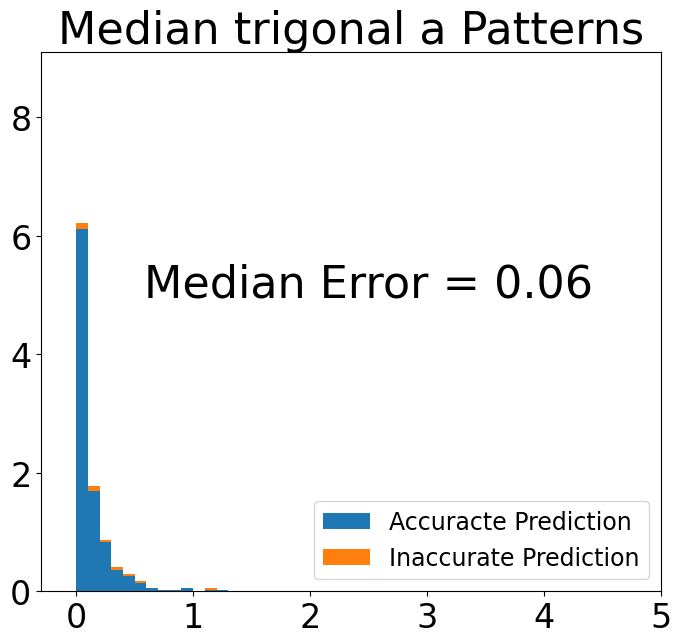

b
Median All 0.06375000000000086


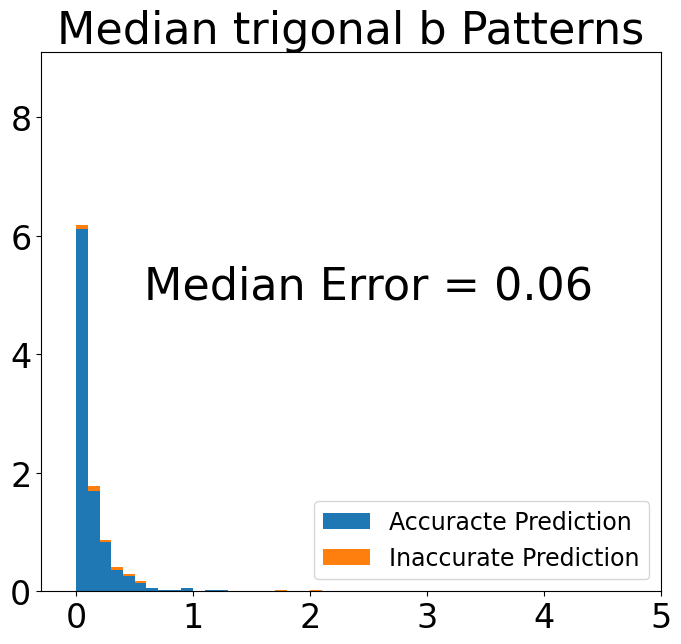

c
Median All 0.40999999999999925


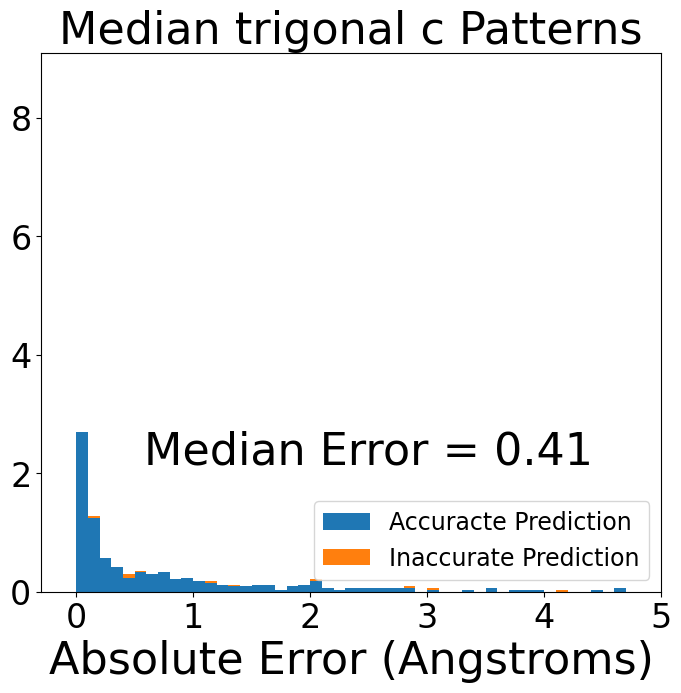

tetragonal
a
Median All 0.07249999999999979


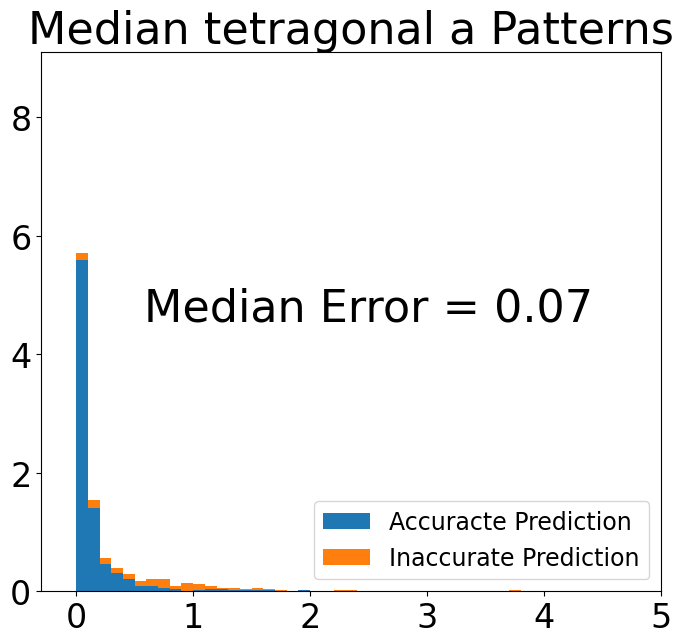

b
Median All 0.07249999999999979


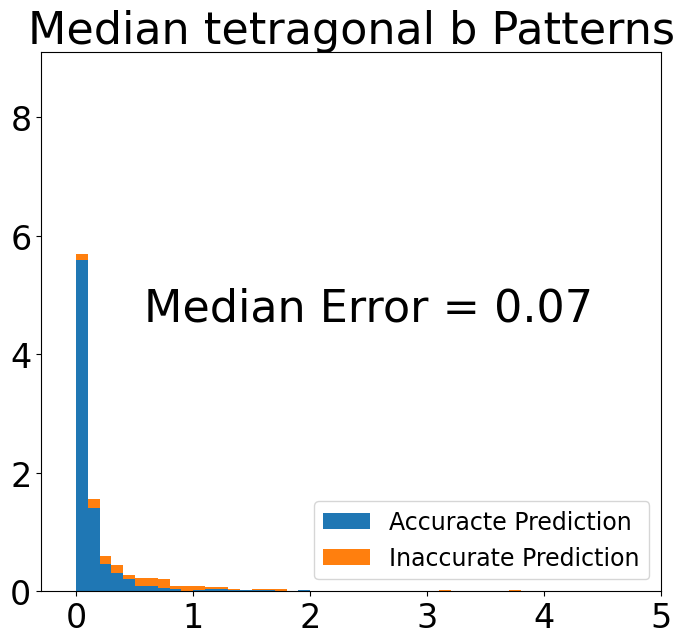

c
Median All 0.28249999999999886


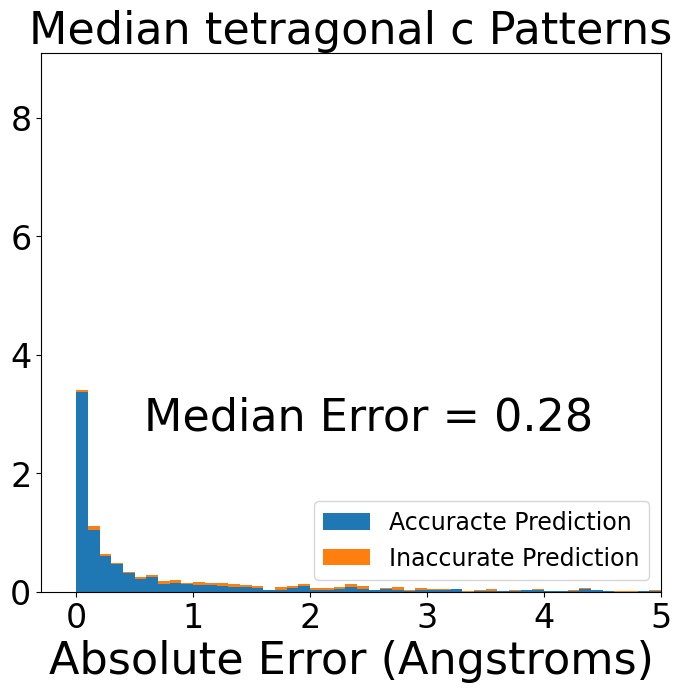

orthorhombic
a
Median All 0.5075000000000003


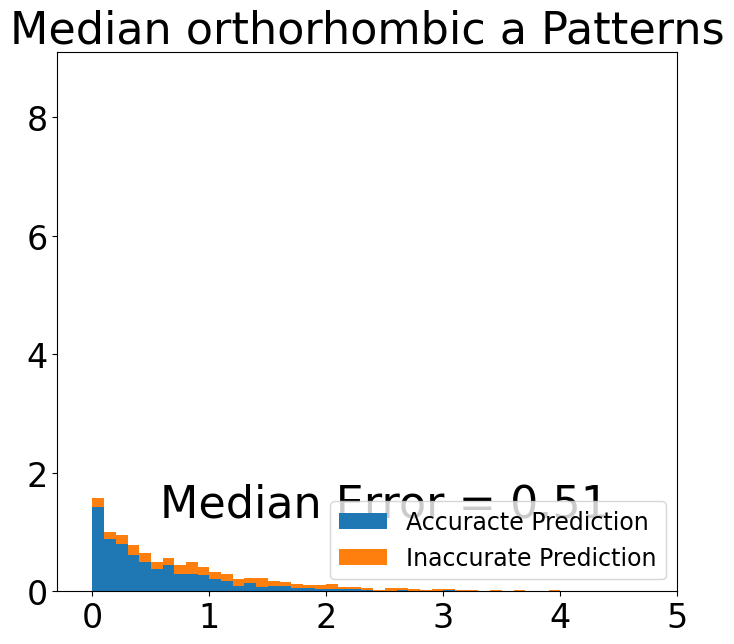

b
Median All 0.6699999999999999


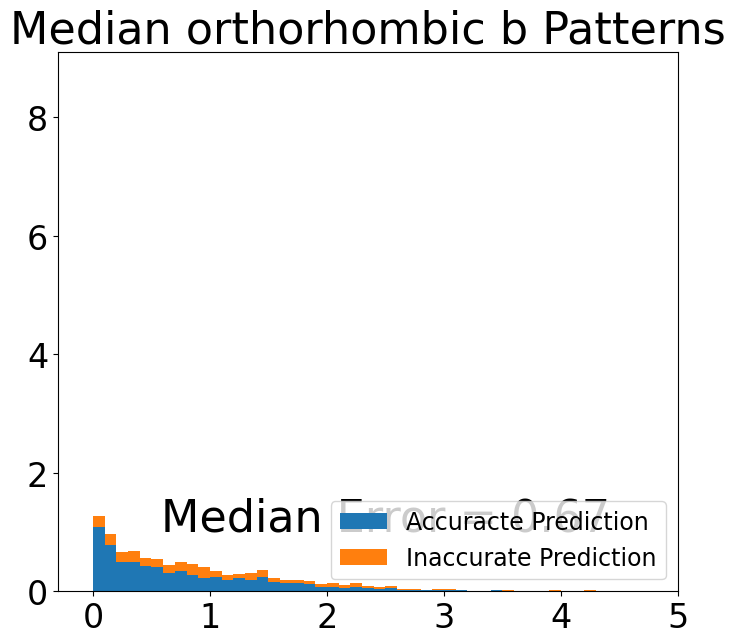

c
Median All 1.160000000000002


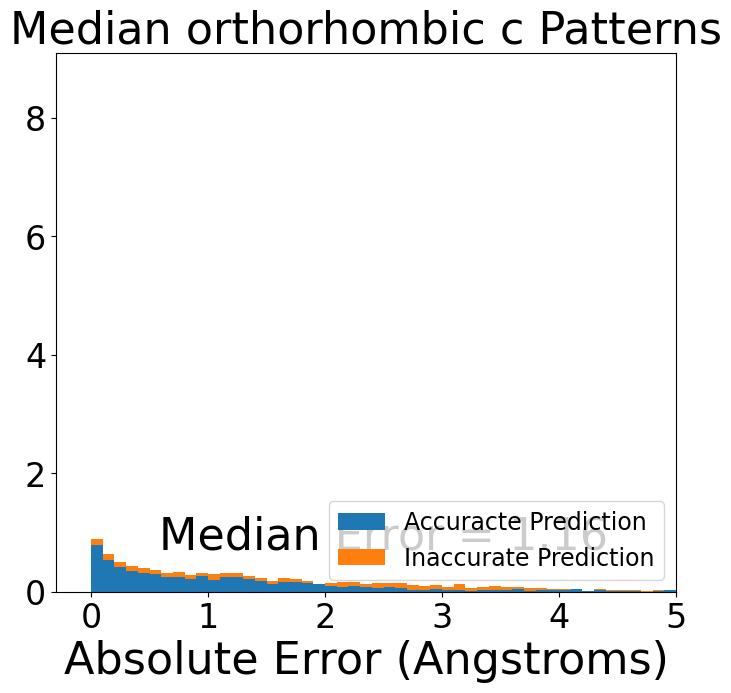

monoclinic
a
Median All 1.2287499999999998


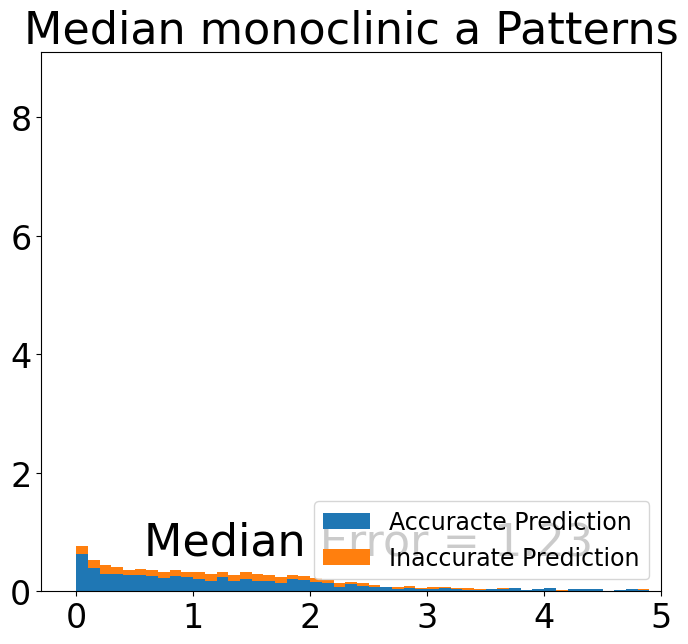

b
Median All 1.09125


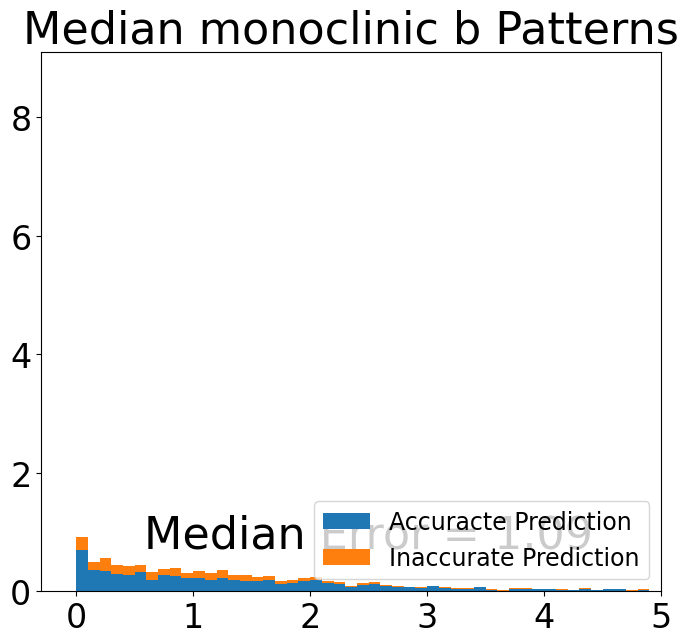

c
Median All 1.375


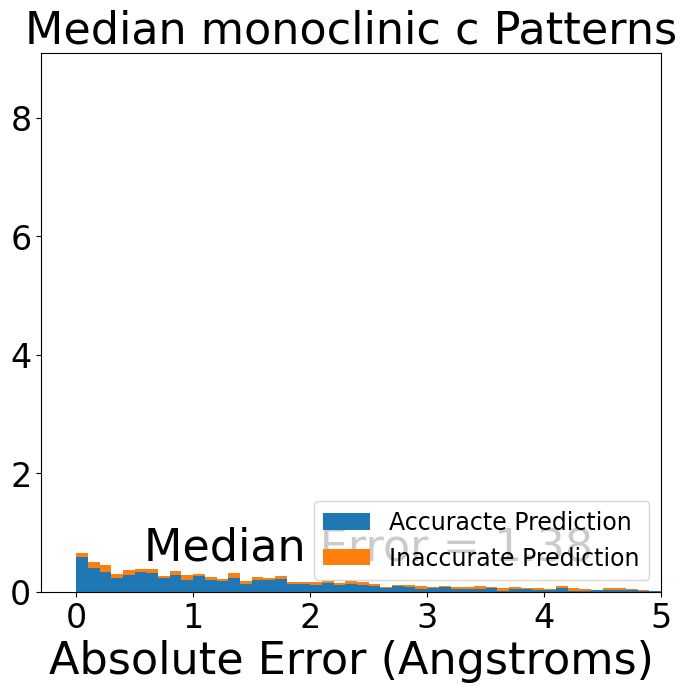

In [13]:
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
# for cry_sys in ['cubic']:
    print(cry_sys)
    plt.rcParams['pdf.fonttype'] = 'truetype'
    df = rf_diff_obj.visualize_lattice_results_aggregate(cry_sys, cry_sys_type = 'Aggregate Predictions Crystal System', 
                                                             prediction_type = 'Median', show_hists = True, show_r2 = False, savefig = True,
                                                        ylims = [0,9.1])

cubic
a
Median All 0.020000000000000462
0.9748700931391681


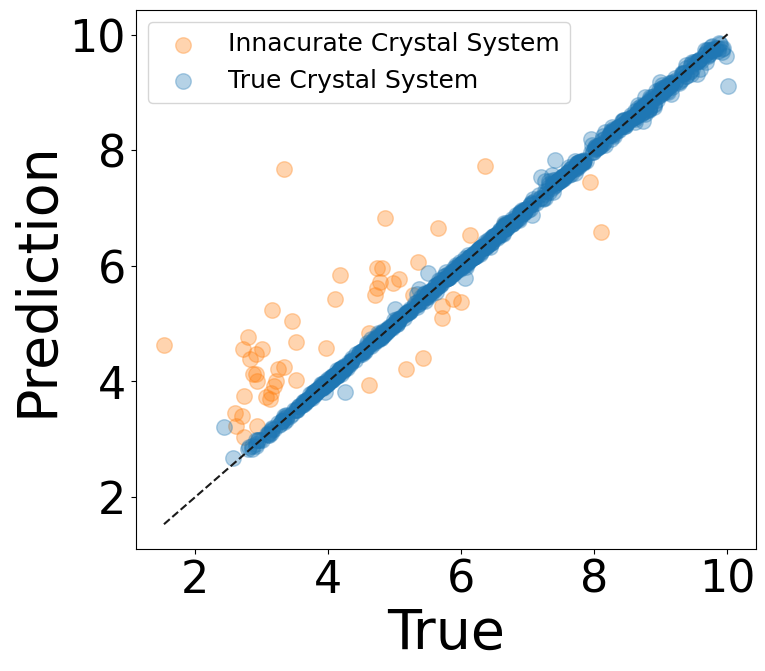

b
Median All 0.020000000000000462
0.9795819997159192


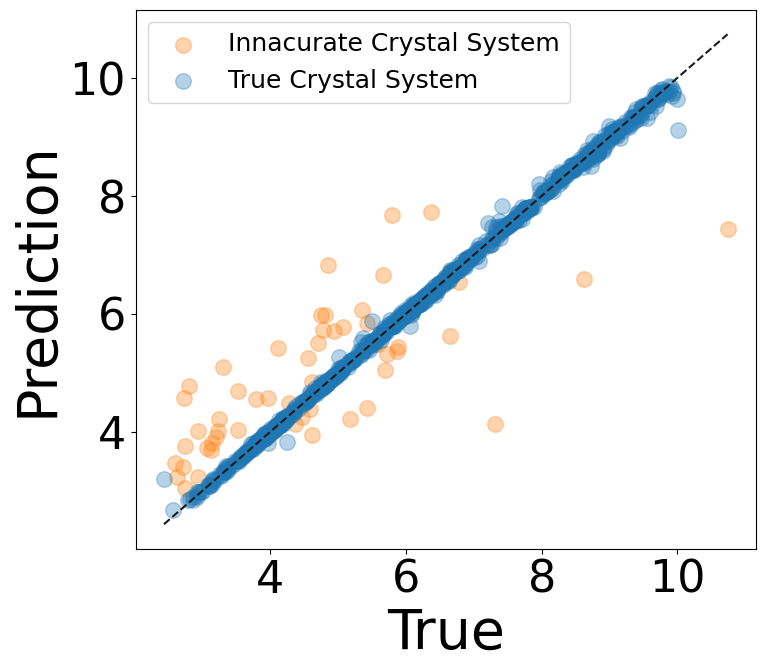

c
Median All 0.020000000000000462
0.8428207031659842


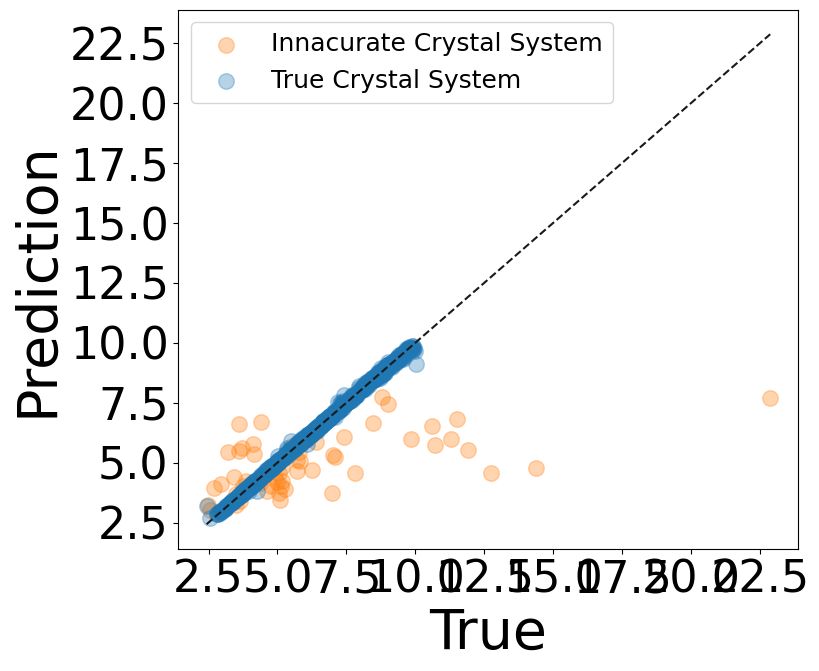

hexagonal
a
Median All 0.08500000000000085
0.963249273078549


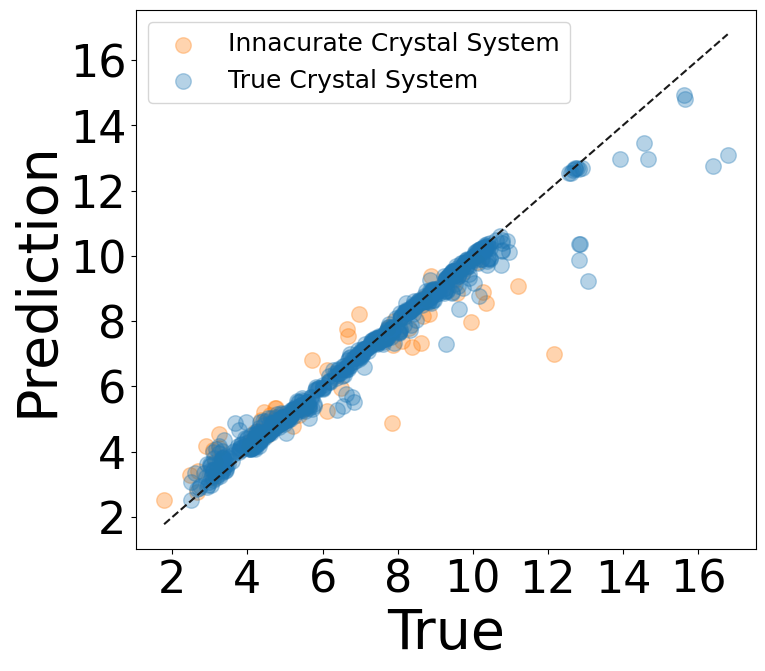

b
Median All 0.08500000000000085
0.9633158015022676


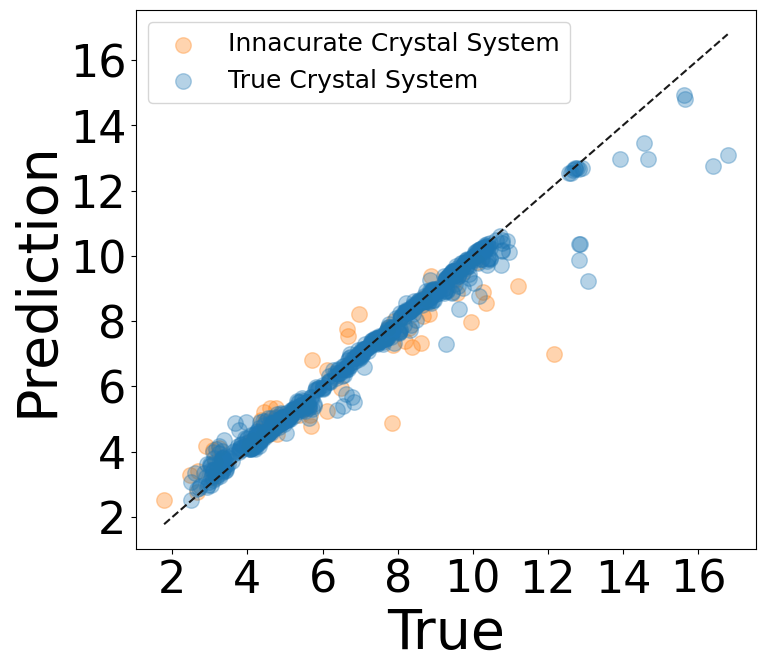

c
Median All 0.15499999999999936
0.7475308128087699


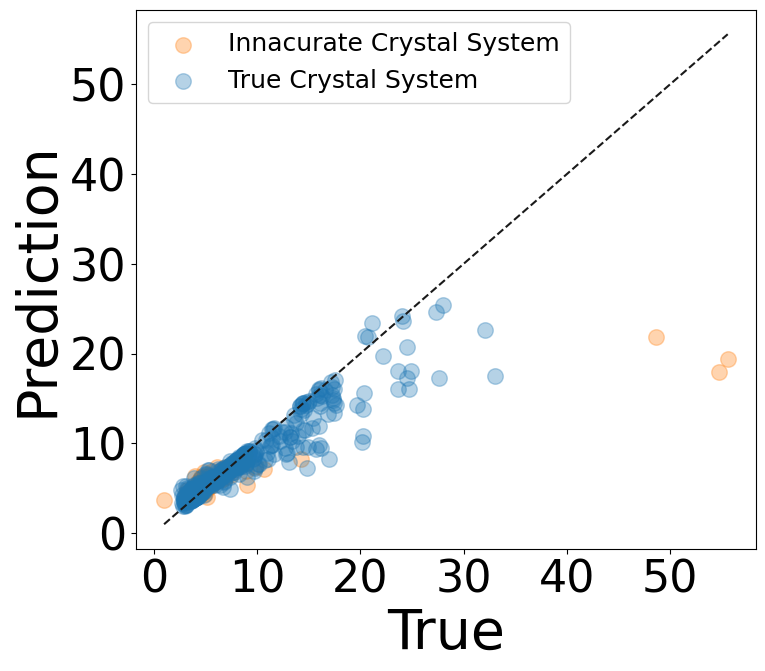

trigonal
a
Median All 0.06375000000000086
0.9900474422255428


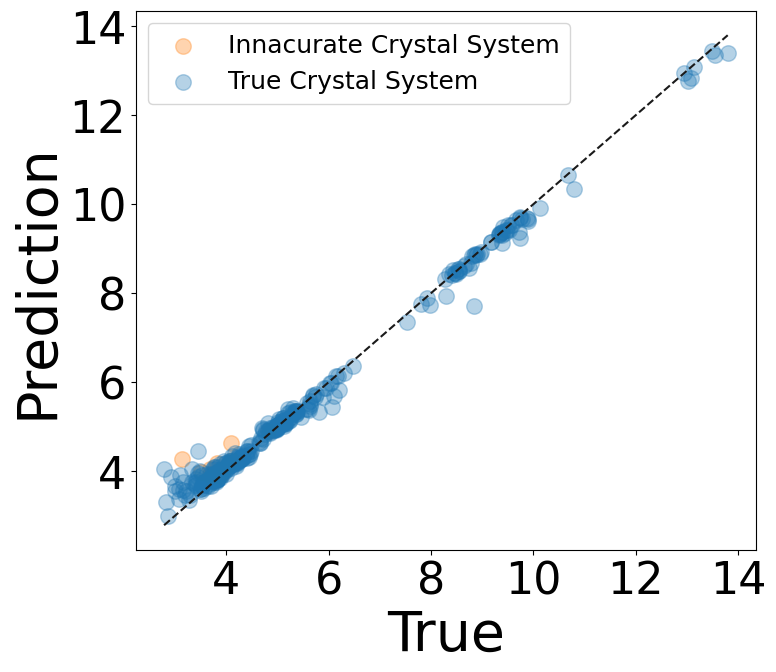

b
Median All 0.06375000000000086
0.9864732086364185


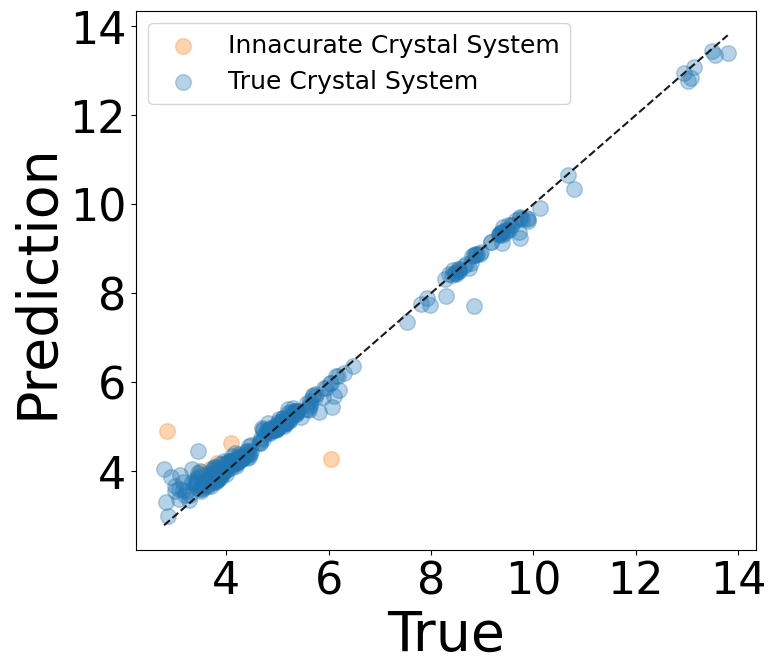

c
Median All 0.40999999999999925
0.8481806563988504


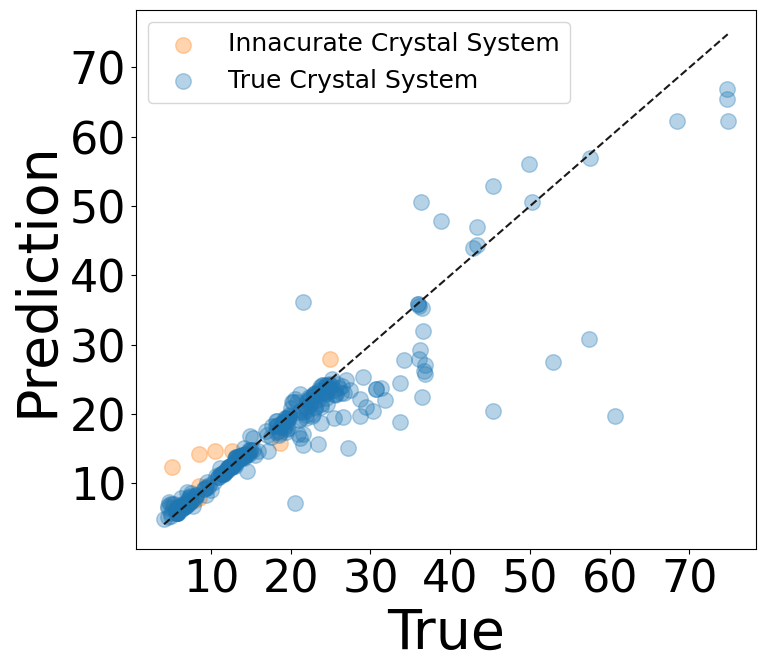

tetragonal
a
Median All 0.07249999999999979
0.8933182317070856


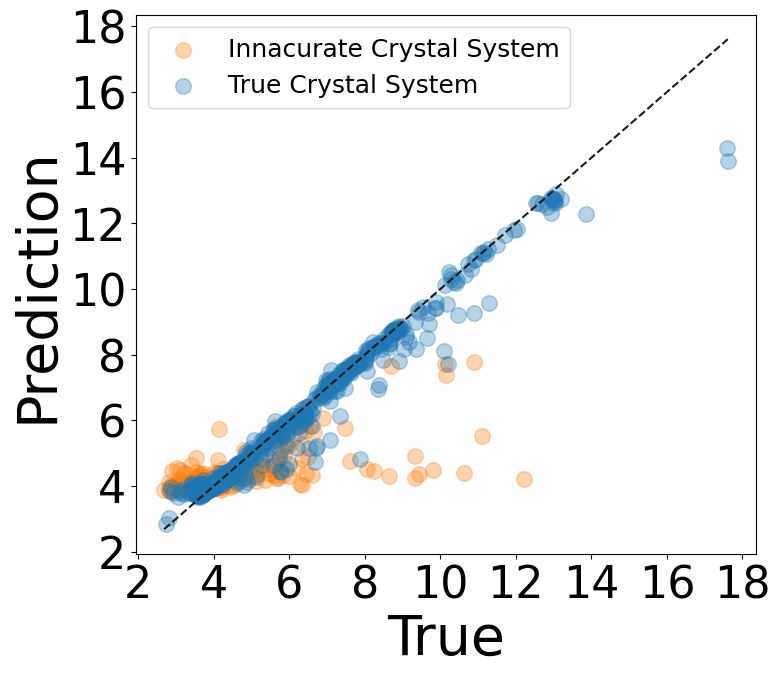

b
Median All 0.07249999999999979
0.8896734795339272


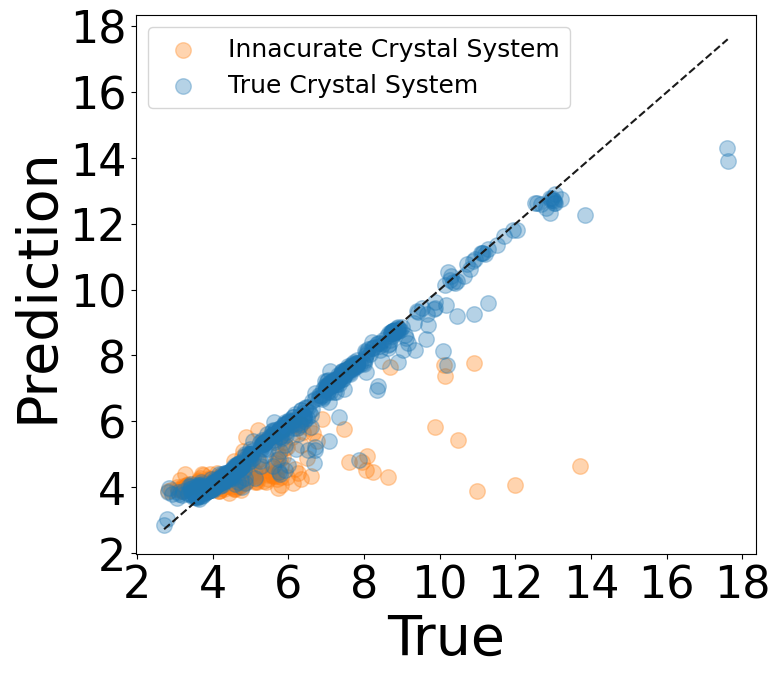

c
Median All 0.28249999999999886
0.6575995781990607


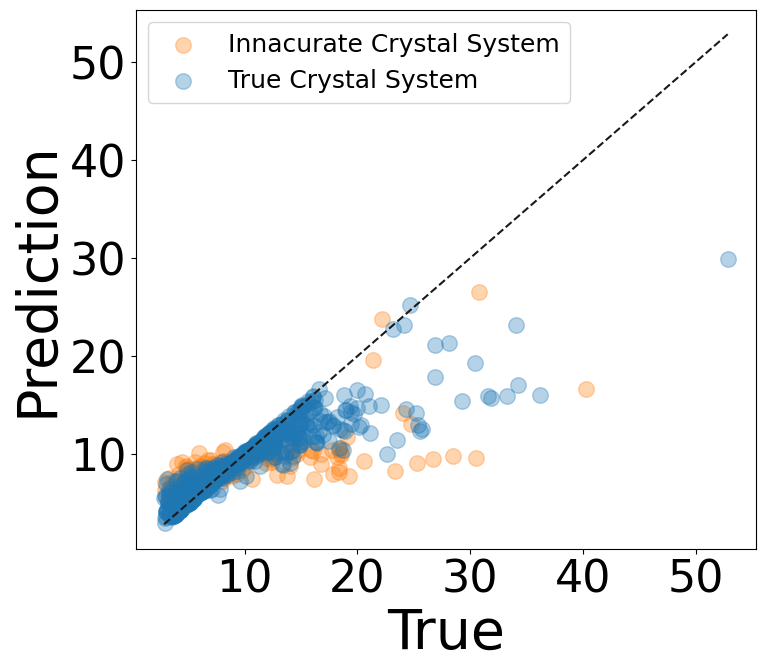

orthorhombic
a
Median All 0.5075000000000003
0.46566783070238627


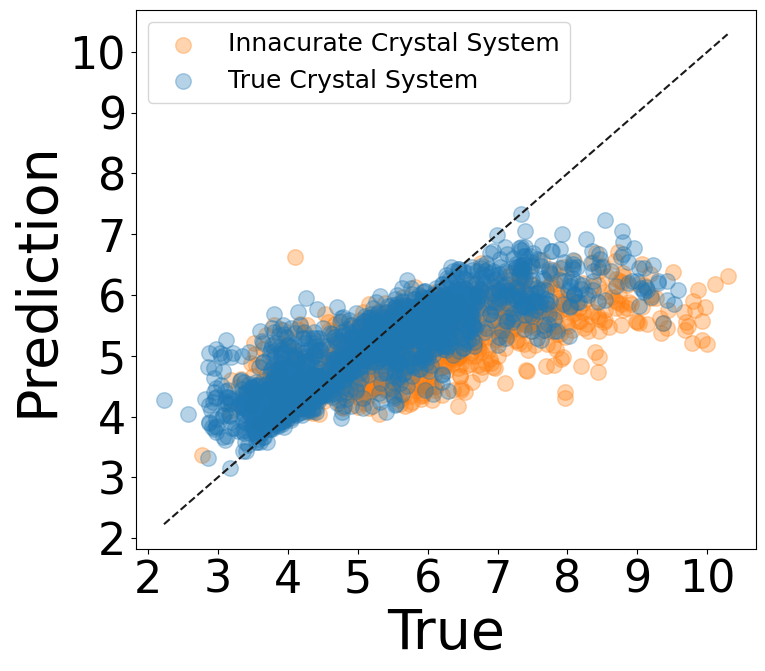

b
Median All 0.6699999999999999
0.663659040170776


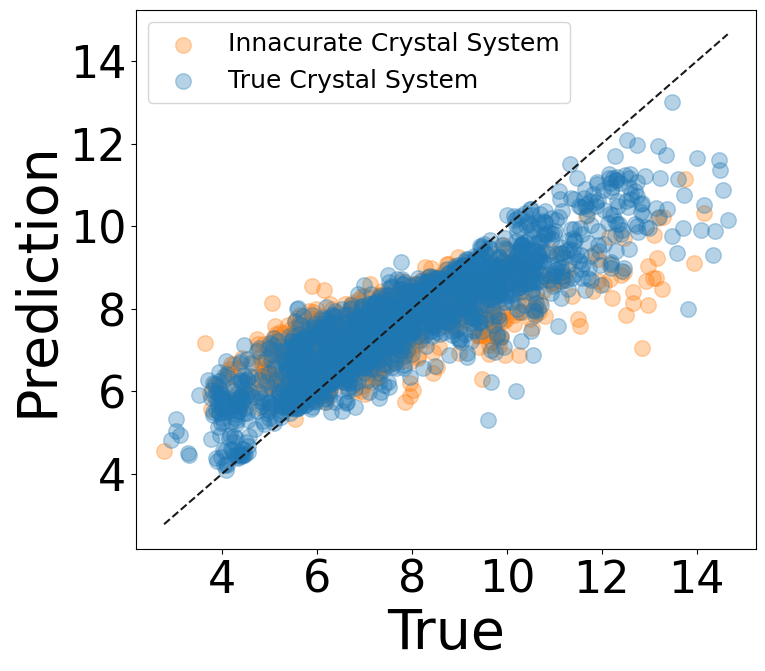

c
Median All 1.160000000000002
0.49150249120811396


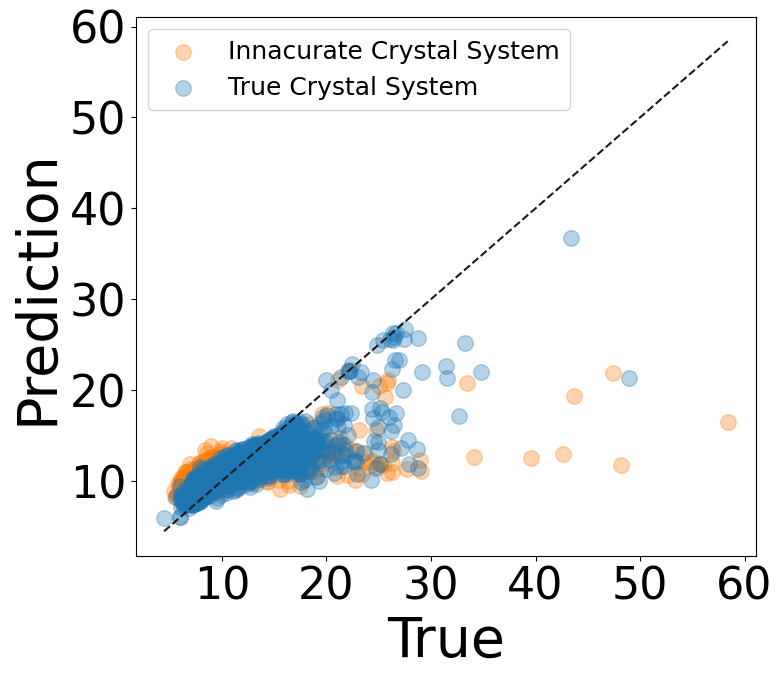

monoclinic
a
Median All 1.2287499999999998
0.29107188308068743


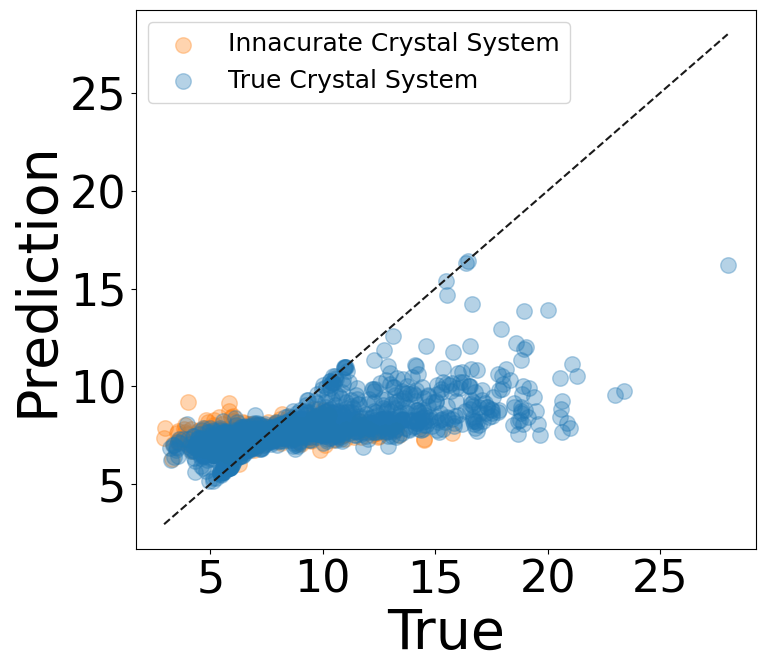

b
Median All 1.09125
0.35871122595773375


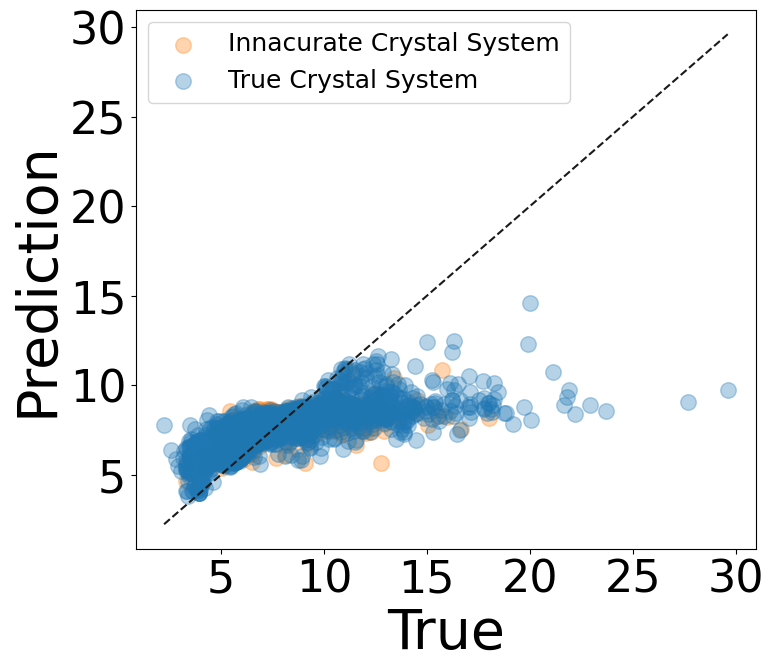

c
Median All 1.375
0.1765741613572821


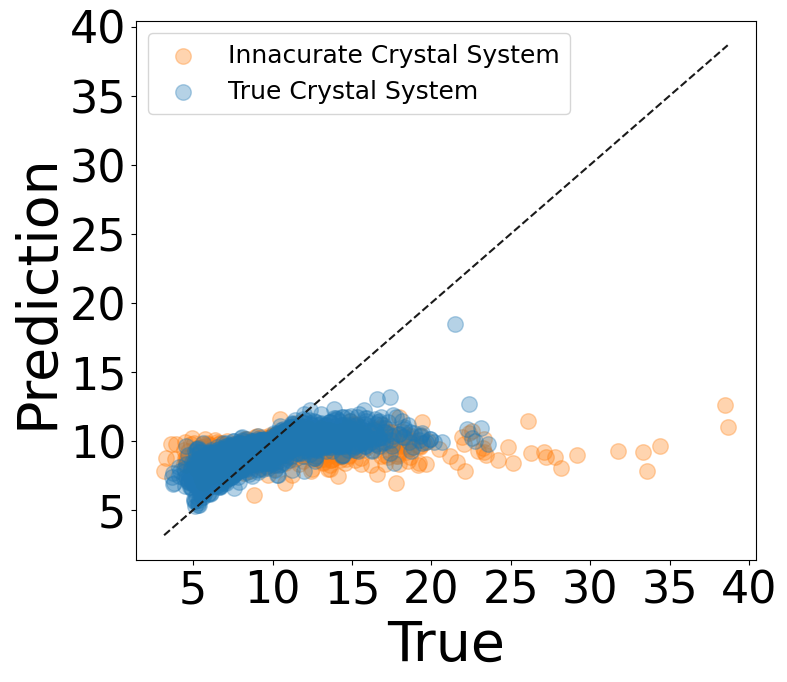

In [13]:
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
# for cry_sys in ['orthorhombic']:
    print(cry_sys)
    plt.rcParams['pdf.fonttype'] = 'truetype'
    df = rf_diff_obj.visualize_lattice_results_aggregate(cry_sys, cry_sys_type = 'Aggregate Predictions Crystal System', 
                                                             prediction_type = 'Median', show_hists = False, show_r2 = True, savefig = False, savenp = True)

cubic
a
Median All 0.020000000000000462
0.9839910246272179


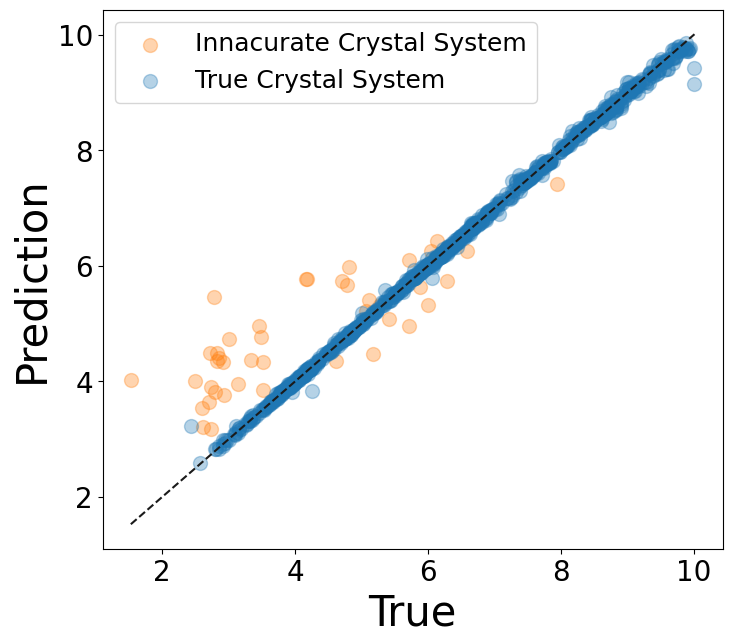

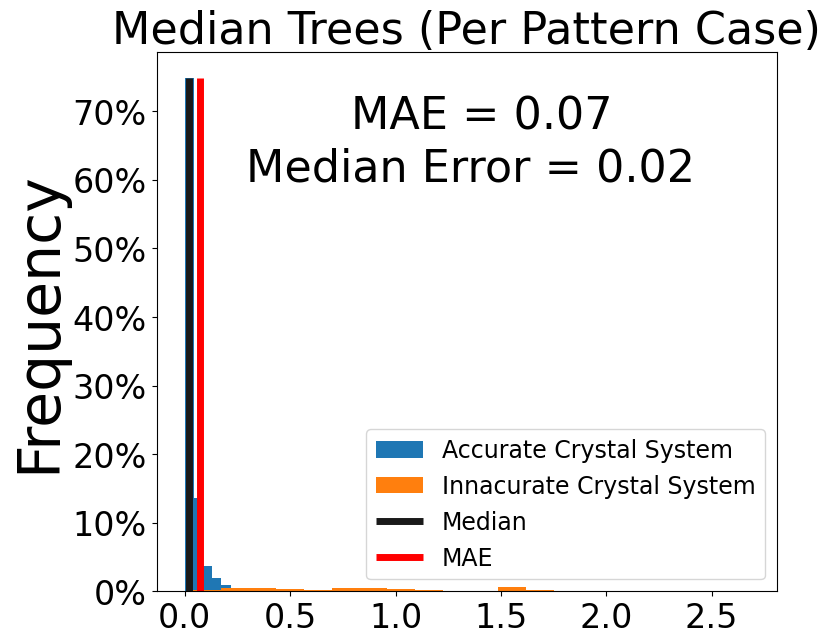

b
Median All 0.020000000000000462
0.9839692955422403


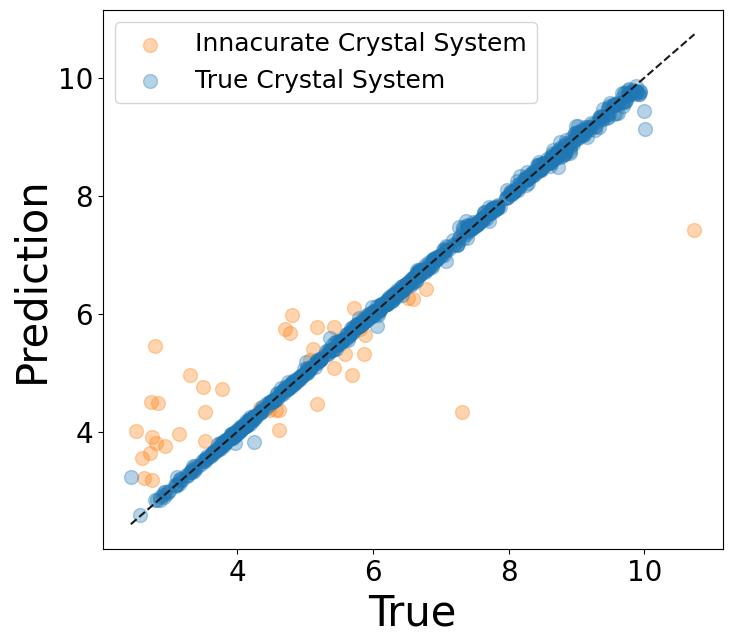

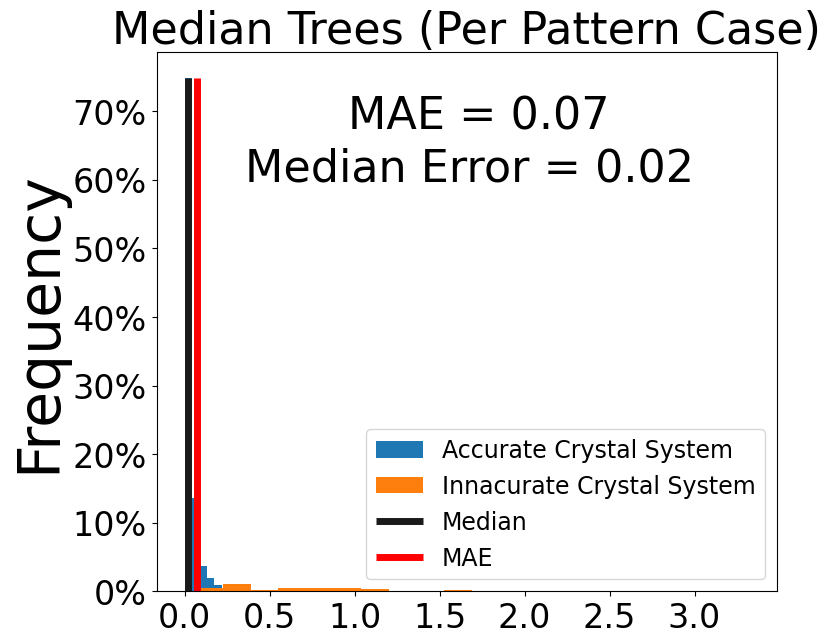

c
Median All 0.020000000000000462
0.9030613855956376


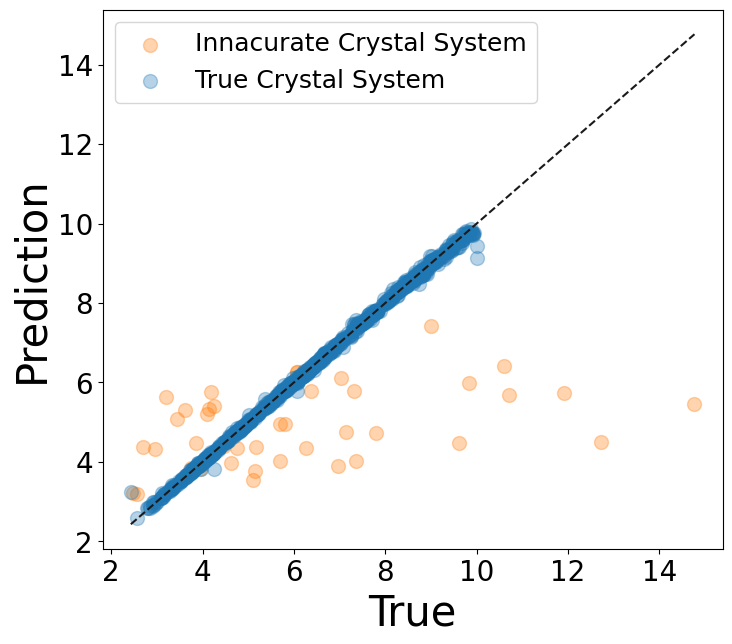

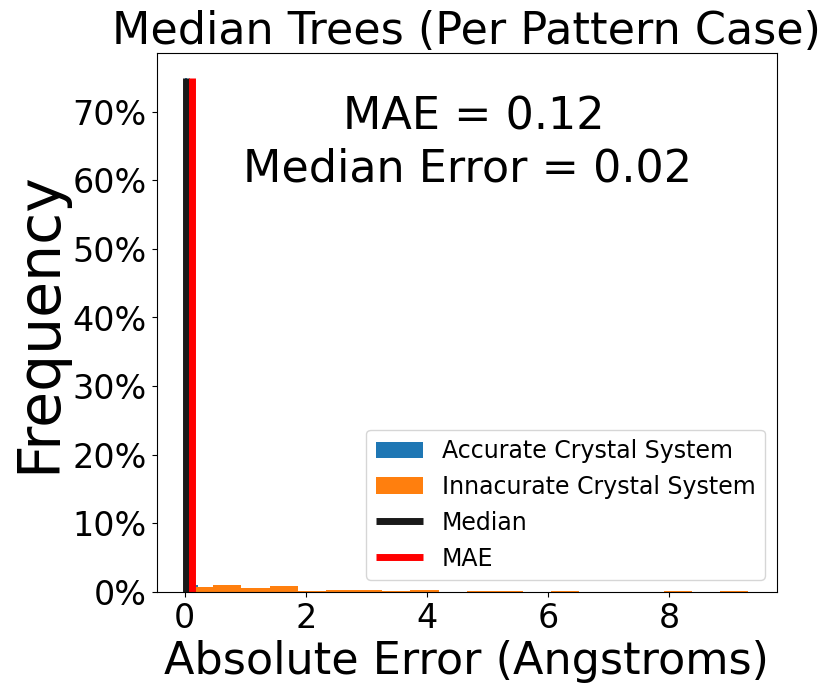

hexagonal
a
Median All 0.07750000000000012
0.9785867558164051


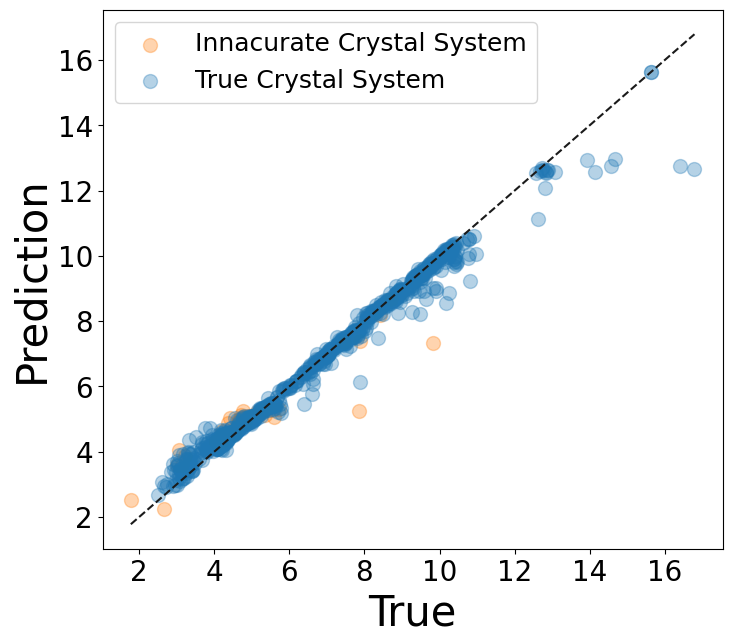

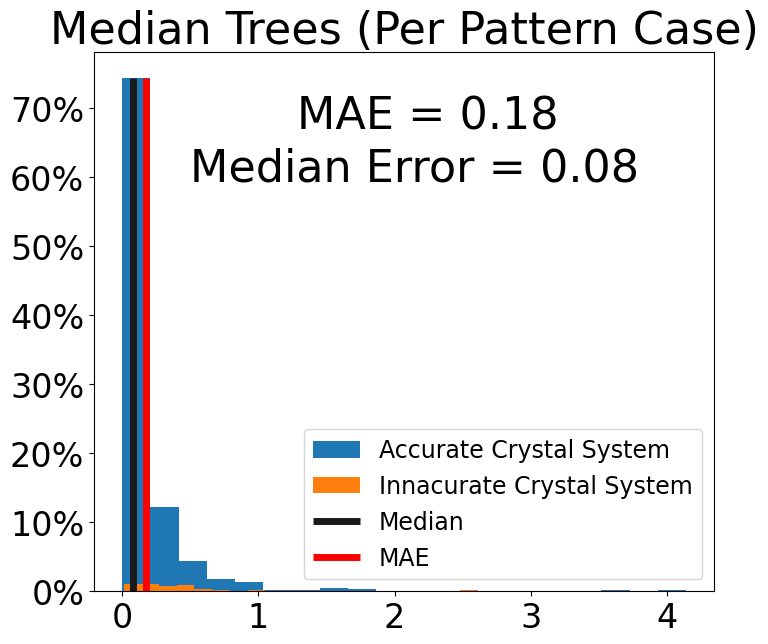

b
Median All 0.07874999999999988
0.9785615122592387


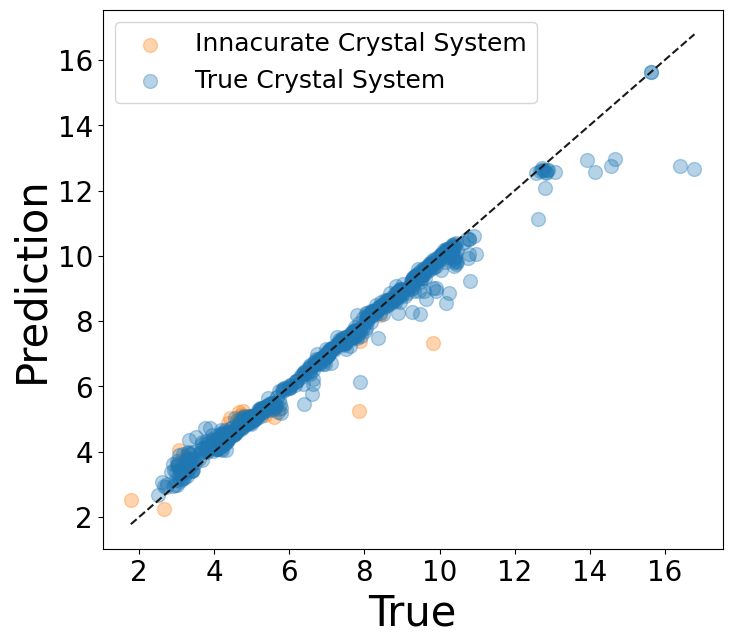

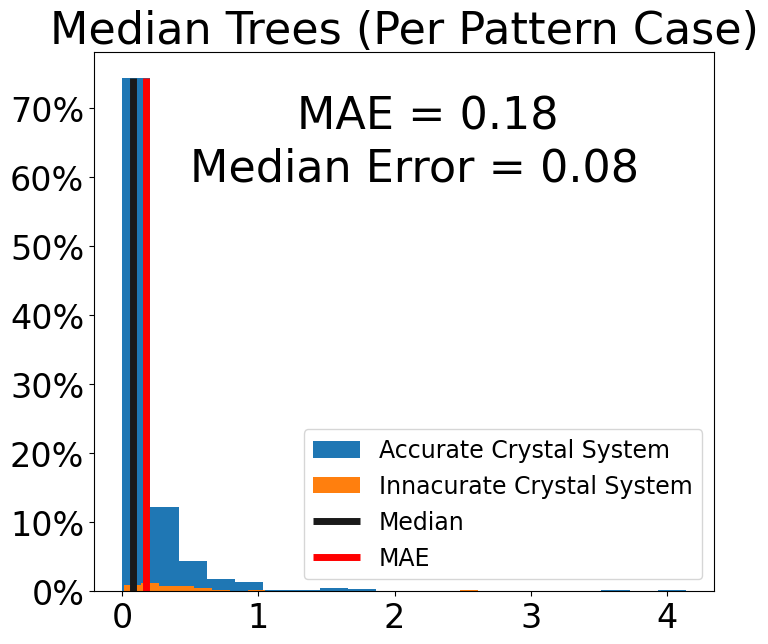

c
Median All 0.13624999999999998
0.792108605526956


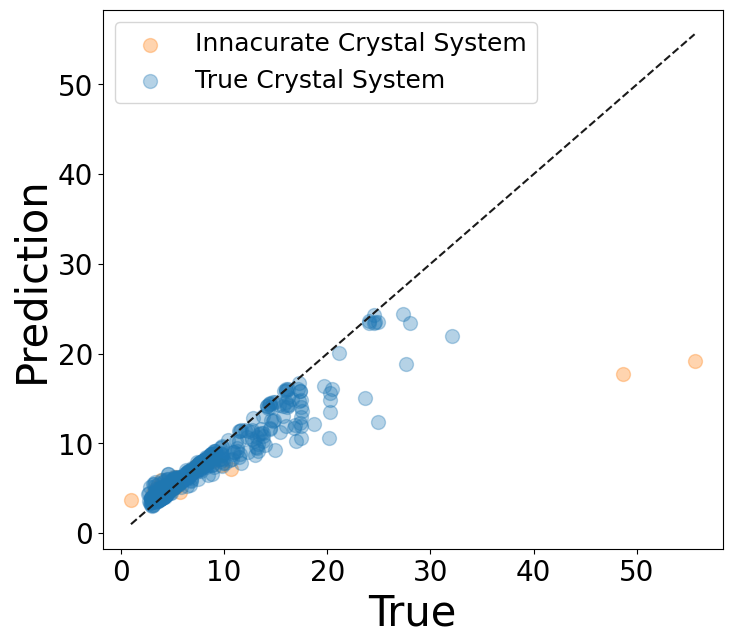

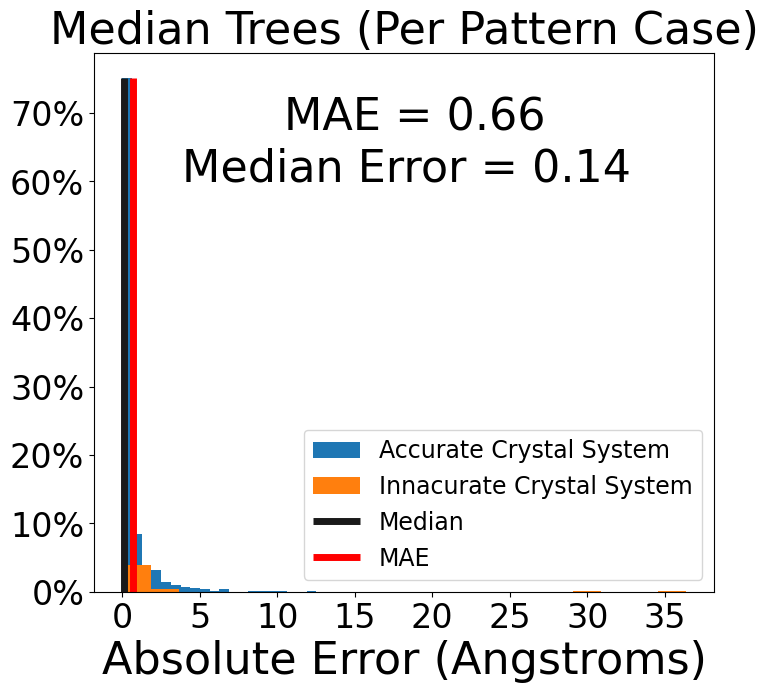

trigonal
a
Median All 0.0649999999999995
0.989465869601234


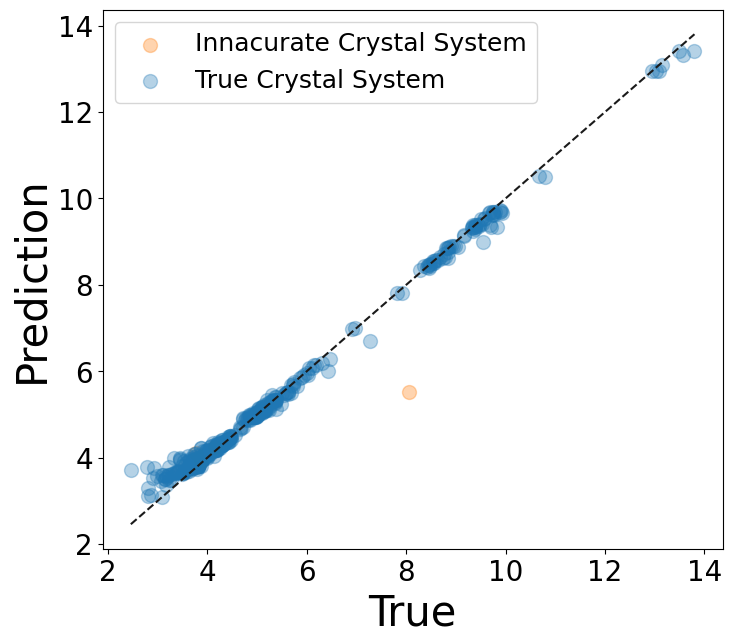

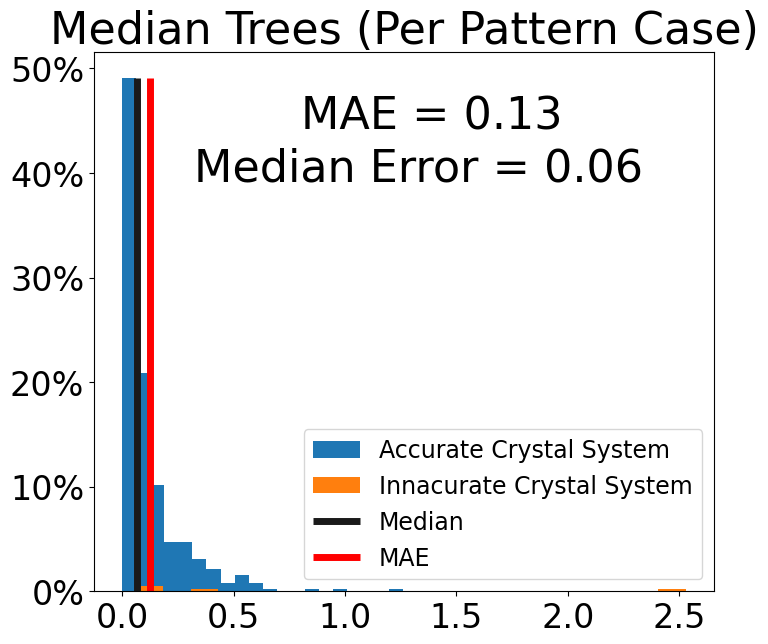

b
Median All 0.0649999999999995
0.989465869601234


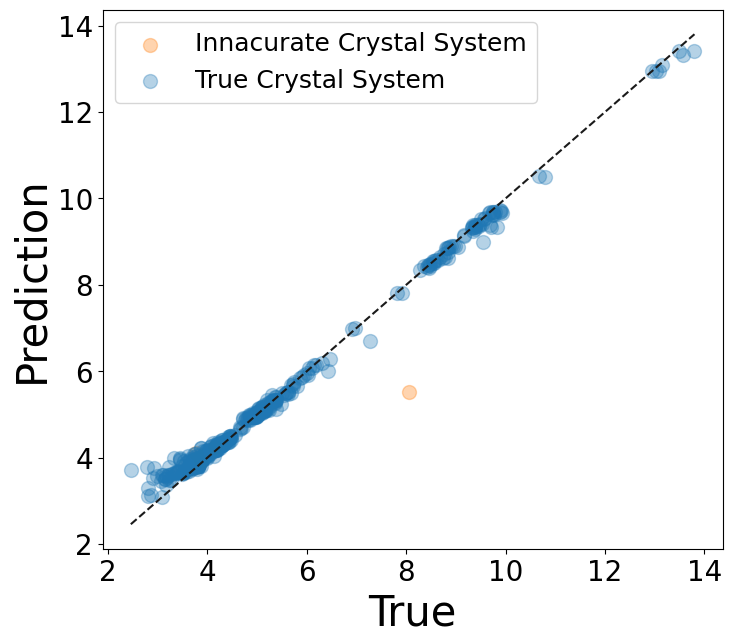

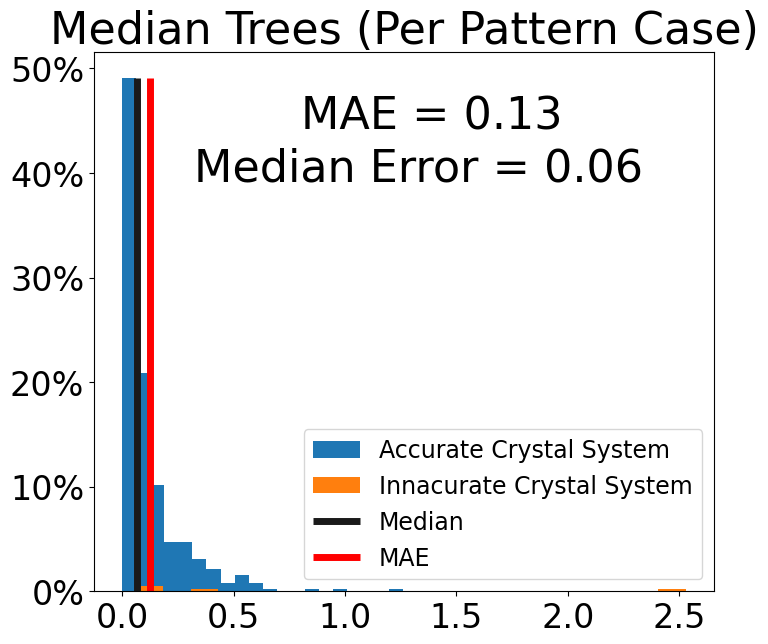

c
Median All 0.3950000000000031
0.832357041630719


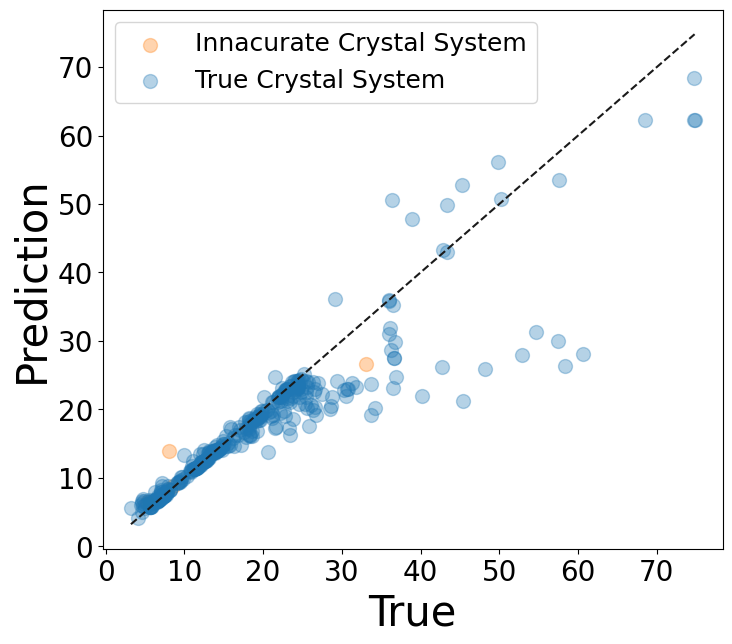

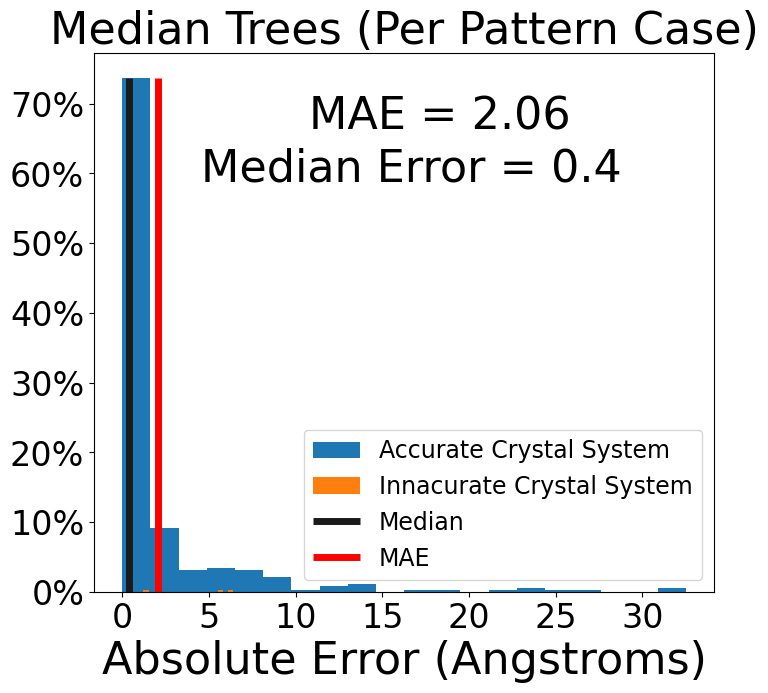

tetragonal
a
Median All 0.06000000000000005
0.9383056171120204


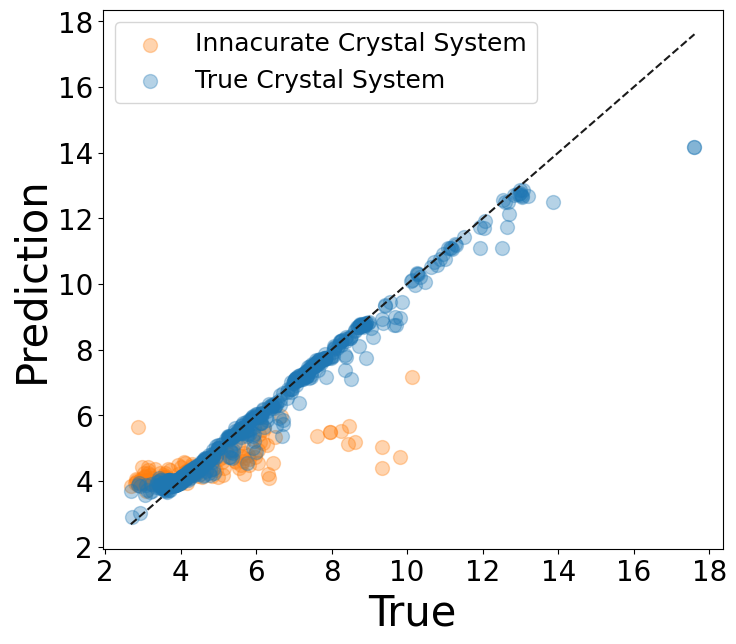

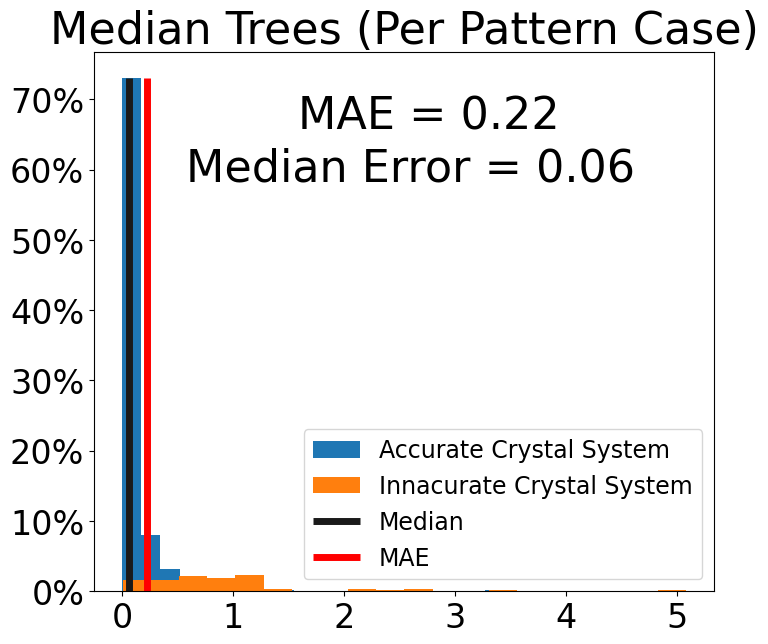

b
Median All 0.06000000000000005
0.9556687773681782


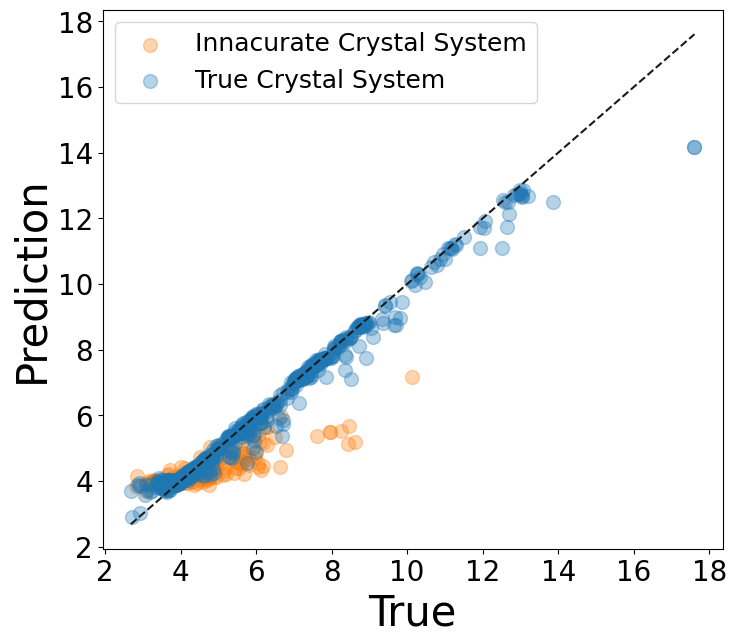

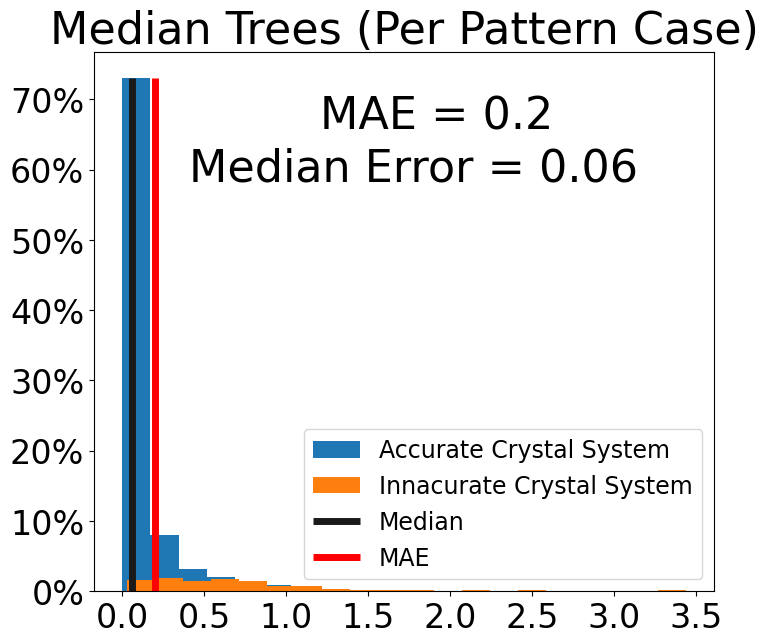

c
Median All 0.21749999999999936
0.707692834523854


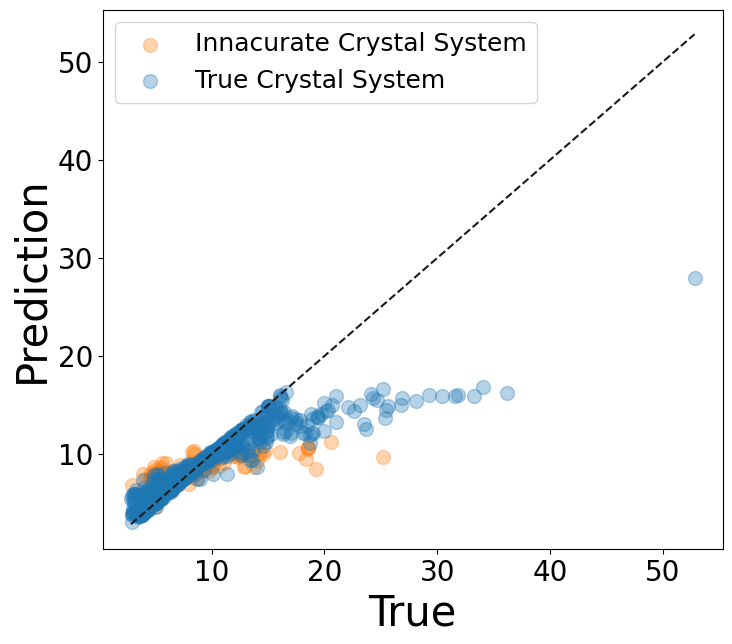

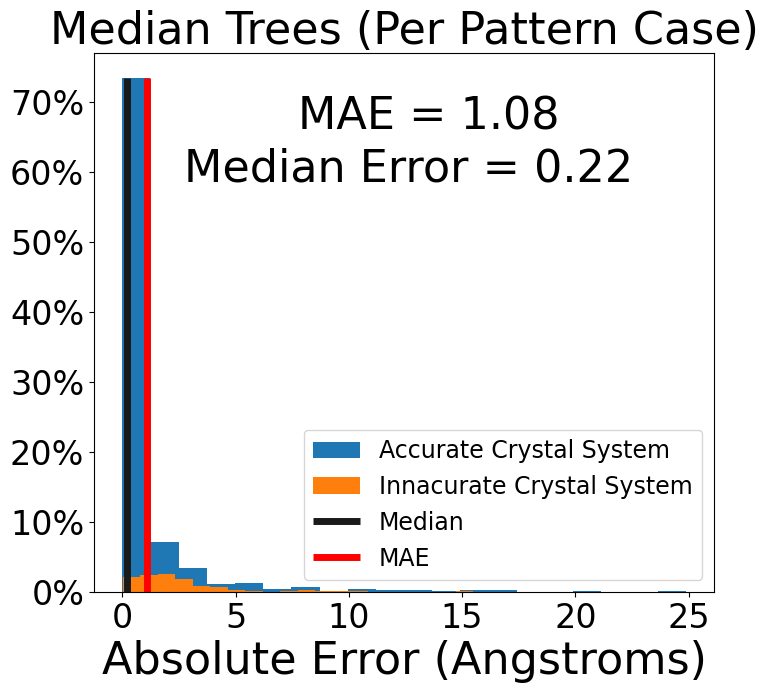

orthorhombic
a
Median All 0.4850000000000003
0.5135208480724143


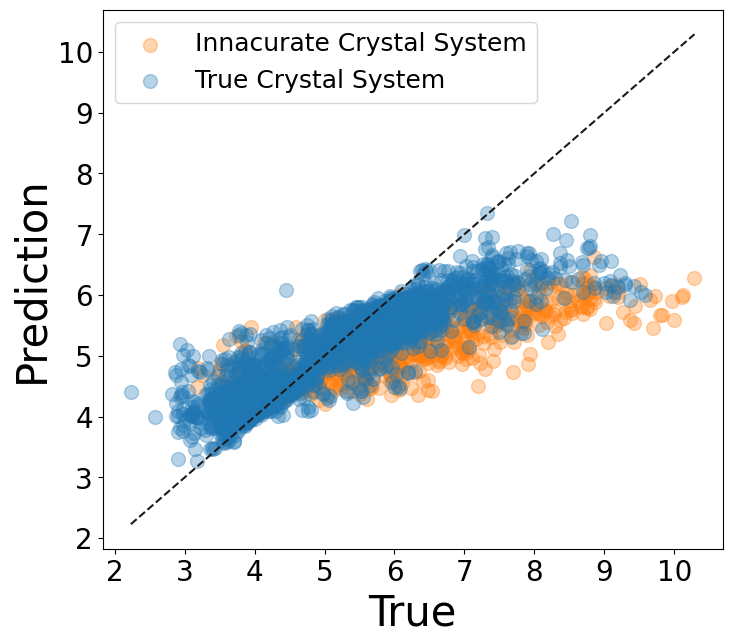

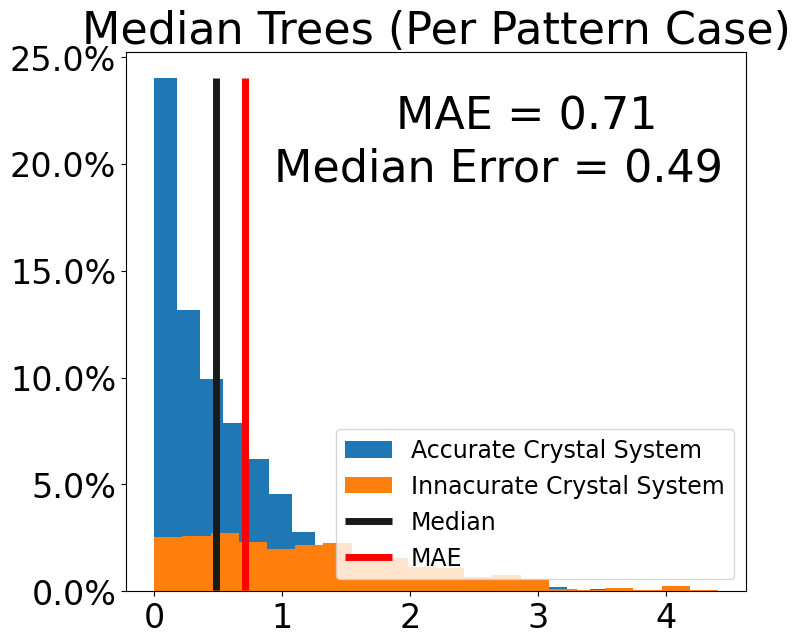

b
Median All 0.6250000000000009
0.6997152470181269


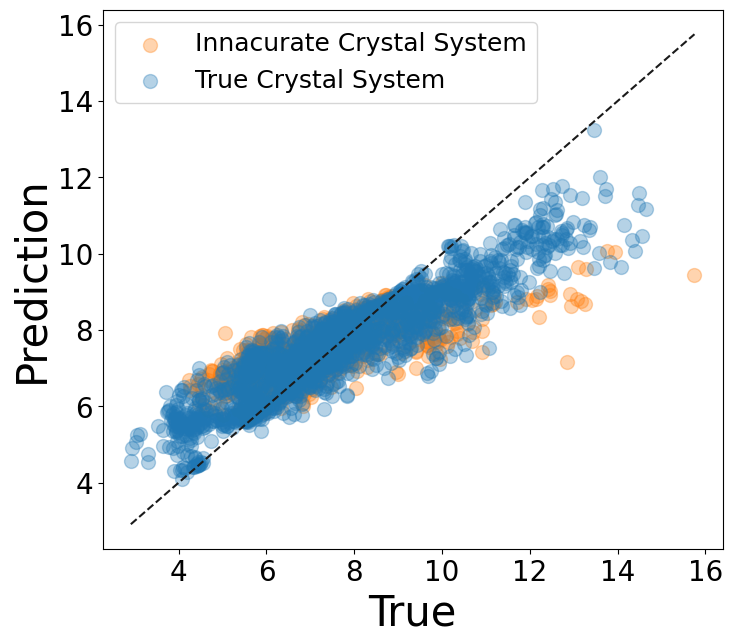

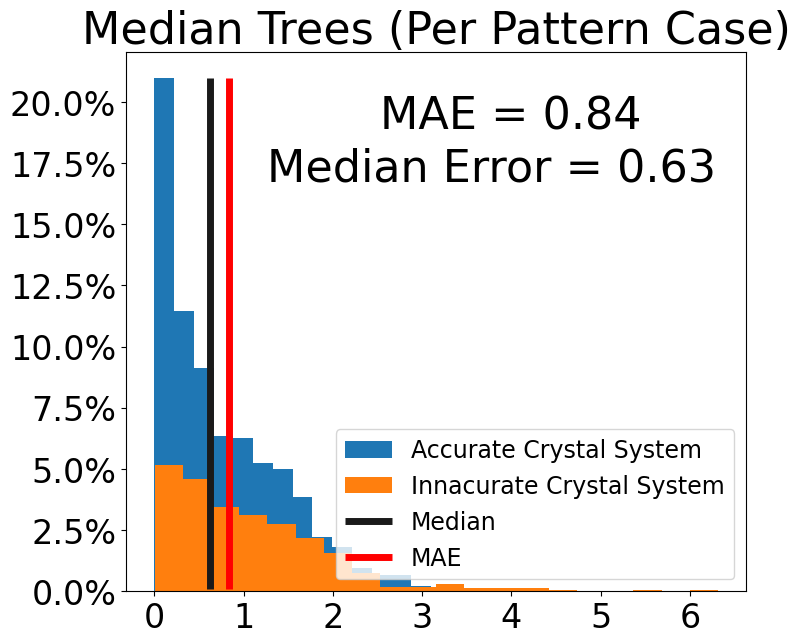

c
Median All 1.1499999999999986
0.49984665910771575


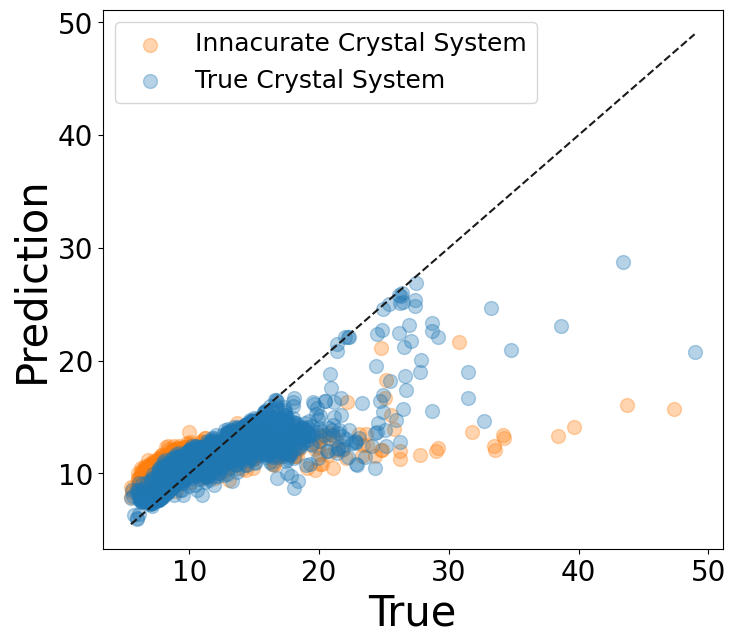

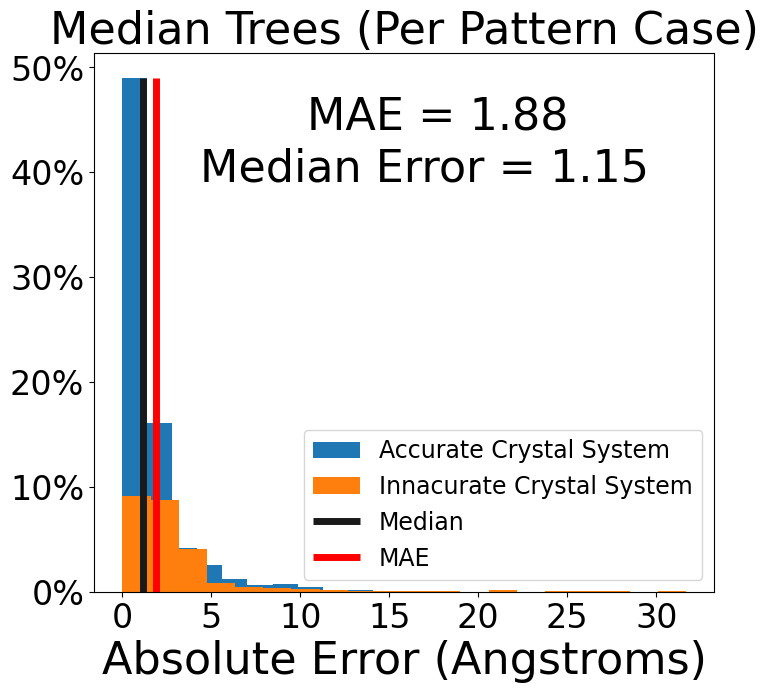

monoclinic
a
Median All 1.2475000000000005
0.26667065514459876


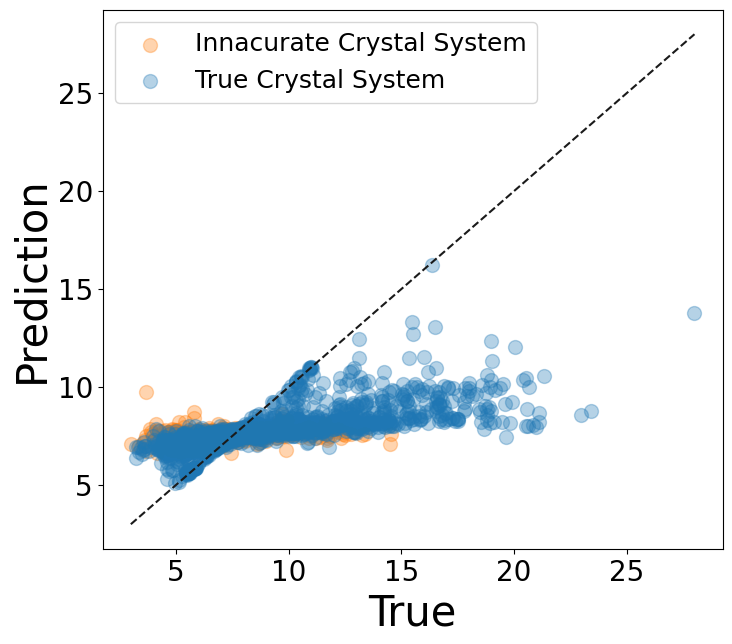

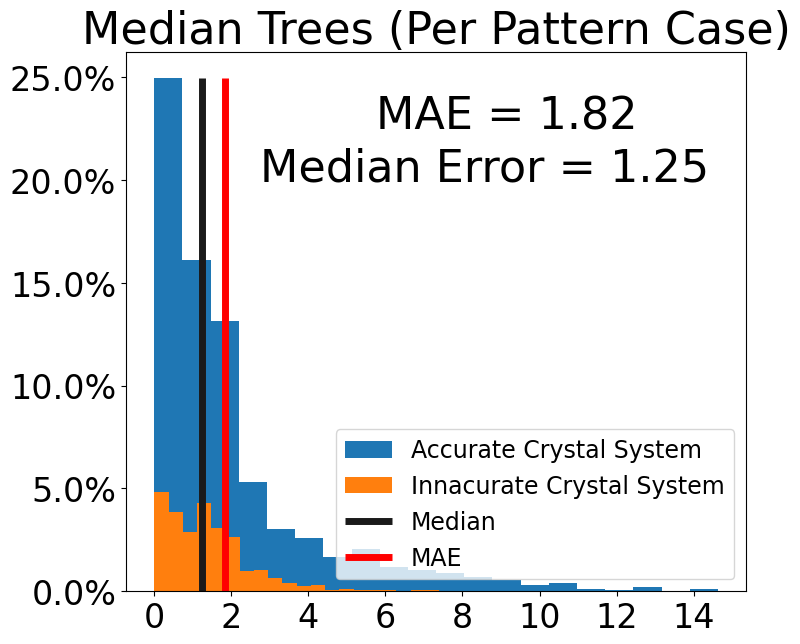

b
Median All 1.1249999999999991
0.3453362012439587


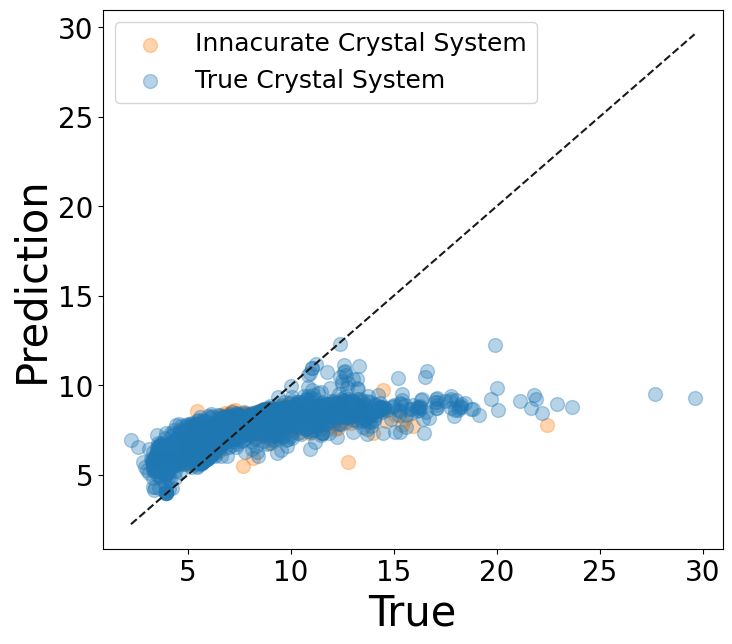

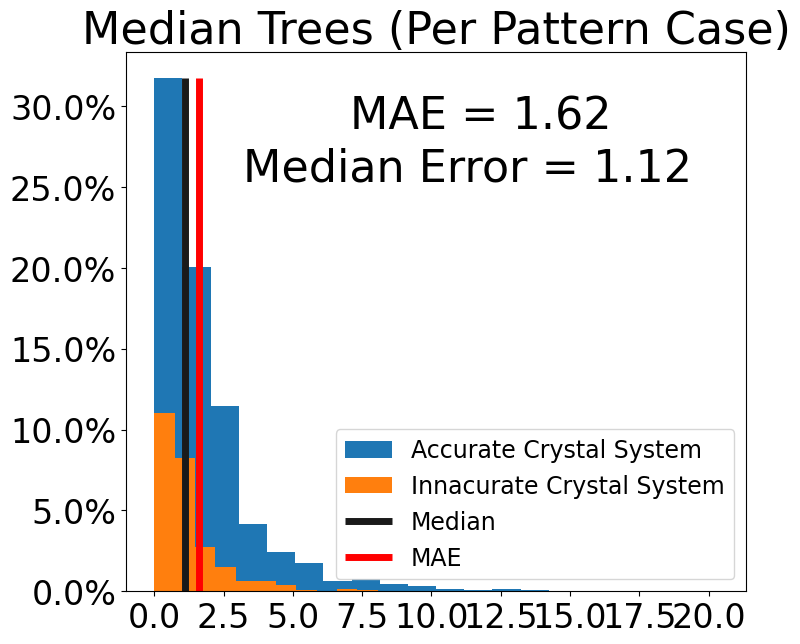

c
Median All 1.3975
0.18490535069445202


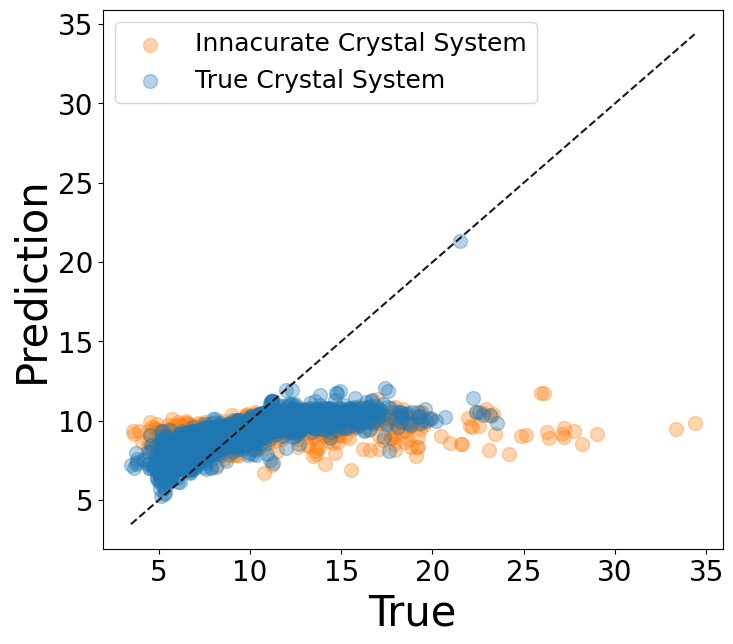

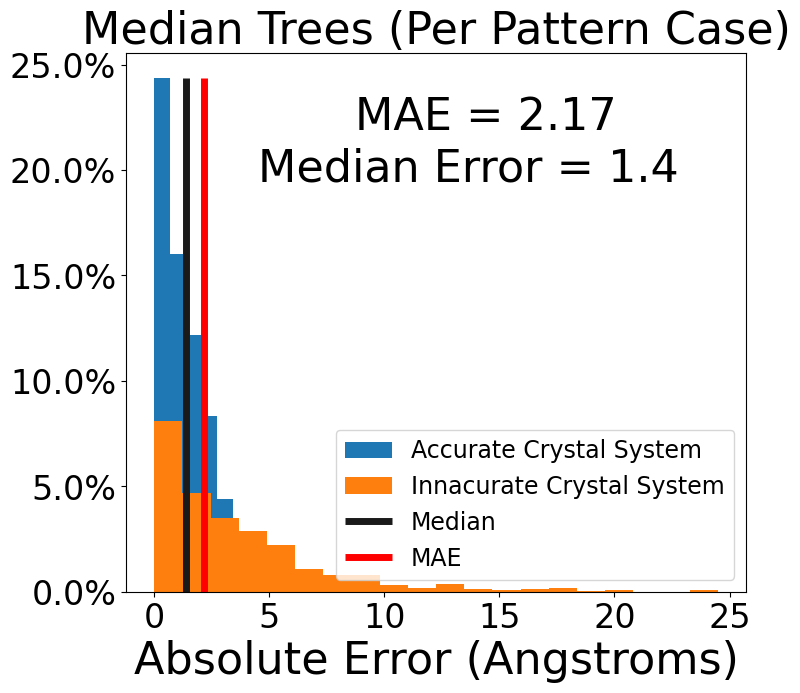

In [60]:
# 100 patterns
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
# for cry_sys in ['orthorhombic']:
    print(cry_sys)
    plt.rcParams['pdf.fonttype'] = 'truetype'
    df = rf_diff_obj.visualize_lattice_results_aggregate(cry_sys, cry_sys_type = 'Aggregate Predictions Crystal System', 
                                                             prediction_type = 'Median', show_hists = True, show_r2 = True, savefig = True)

In [18]:
rf_diff_obj.loaded_submodels_space_group = [False, '']
# for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
for cry_sys in ['trigonal']:
    print(cry_sys)
    out_df = rf_diff_obj.visualize_space_group_results_aggregate(cry_sys)

trigonal
trigonal
loading dfs
starting
loaded dfs
2046
682
326
starting input processing


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.1s remaining:    5.8s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.3s remaining:    0.3s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.3s finished


starting aggregation
Accurate Accuracy
0.8834355828220859
Inaccurate Accuracy
0.0
All Accuracy
0.8520710059171598


In [50]:
rf_diff_obj.loaded_submodels_space_group = [False, '']
for cry_sys in ['monoclinic']:
    print(cry_sys)
    rf_diff_obj.visualize_space_group_results_aggregate(cry_sys)

monoclinic
monoclinic
loading dfs
starting
loaded dfs
5961
1988
1789
starting input processing


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.4s remaining:   17.2s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.8s remaining:    0.7s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.9s finished


starting aggregation
Accurate Accuracy
0.6198993851313583
Inaccurate Accuracy
0.0
All Accuracy
0.44789983844911146


In [ ]:
# find location of condensed df material in output df

# row = rf_diff_obj.condensed_df.iloc[0]
# full_df_vals = row['Full Df Indicies']
# output_df_temp.loc[output_df_temp['Full DF Indicies'].isin(full_df_vals)]

In [71]:
subdf = rf_diff_obj.full_df.loc[rf_diff_obj.full_df.mat_id == 'mp-1001786']
subdf.loc[subdf['zone'] == (0.7060819365278469, -0.706081936527847, 0.05382005033601193)]

,mat_id,zone,radial_200_ang_Colin_basis,crystal system,point group,space_group_first,space_group_symbol,structure
2603,mp-1001786,"(0.7060819365278469, -0.706081936527847, 0.053...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",trigonal,-3m,166,R-3m,"[[0. 0. 0.] Li, [ 1.84544241 -1.06546667 6.04..."


In [76]:
subdf.loc[subdf['zone'] == (0.7071067811865476, -0.7071067811865475, 1.5171284458970975e-17)]

,mat_id,zone,radial_200_ang_Colin_basis,crystal system,point group,space_group_first,space_group_symbol,structure
2621,mp-1001786,"(0.7071067811865476, -0.7071067811865475, 1.51...","[[(0.10943881093725544+0j), (0.109438810937255...",trigonal,-3m,166,R-3m,"[[0. 0. 0.] Li, [ 1.84544241 -1.06546667 6.04..."


In [81]:
subdf.loc[subdf['zone'] == (0.9302839215348991, 0.35907619075631536, 0.075074060537472)]

,mat_id,zone,radial_200_ang_Colin_basis,crystal system,point group,space_group_first,space_group_symbol,structure
2619,mp-1001786,"(0.9302839215348991, 0.35907619075631536, 0.07...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",trigonal,-3m,166,R-3m,"[[0. 0. 0.] Li, [ 1.84544241 -1.06546667 6.04..."


2603
['trigonal', 'hexagonal', 'monoclinic', 'tetragonal', 'orthorhombic', 'cubic']
trigonal        52
hexagonal        8
monoclinic       8
tetragonal       7
orthorhombic     4
cubic            1
dtype: int64


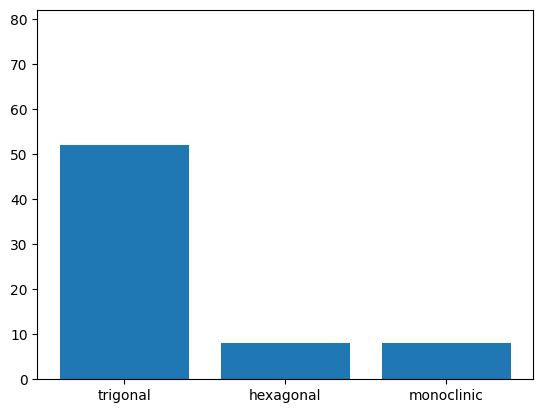

In [90]:
print(output_df.loc[output_df['mat_id'] == 'mp-1001786'].iloc[83]['Full DF Indicies'])
vals = pd.DataFrame(output_df.loc[output_df['mat_id'] == 'mp-1001786'].iloc[83]['Full Predictions Crystal System']).value_counts()
vals_use = []
for i in vals.index:
    vals_use.append(i[0])
print(vals_use)
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.bar(vals_use[0:3], np.asarray(vals)[0:3])
print(vals)
plt.ylim([0,82])
plt.savefig('Accurate Example.pdf', bbox_inches="tight", transparent=True)

2621
['trigonal', 'monoclinic', 'tetragonal', 'orthorhombic', 'hexagonal']
trigonal        25
monoclinic      20
tetragonal      17
orthorhombic    11
hexagonal        7
dtype: int64


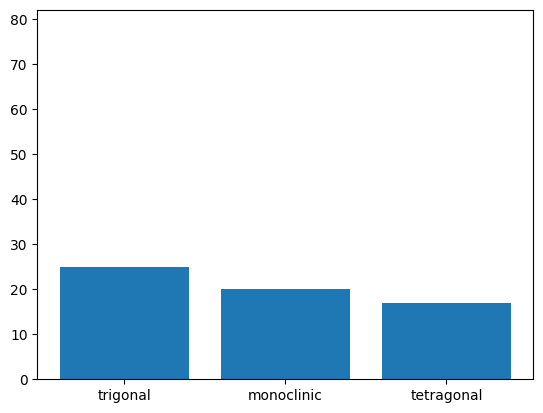

In [91]:
print(output_df.loc[output_df['mat_id'] == 'mp-1001786'].iloc[101]['Full DF Indicies'])
vals = pd.DataFrame(output_df.loc[output_df['mat_id'] == 'mp-1001786'].iloc[101]['Full Predictions Crystal System']).value_counts()
vals_use = []
for i in vals.index:
    vals_use.append(i[0])
print(vals_use)
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.bar(vals_use[0:3], np.asarray(vals)[0:3])
print(vals)
plt.ylim([0,82])
plt.savefig('Accurate Low Con Example.pdf', bbox_inches="tight", transparent=True)

2619
['tetragonal', 'hexagonal', 'trigonal', 'orthorhombic', 'cubic', 'monoclinic']
tetragonal      19
hexagonal       18
trigonal        18
orthorhombic    13
cubic            6
monoclinic       6
dtype: int64


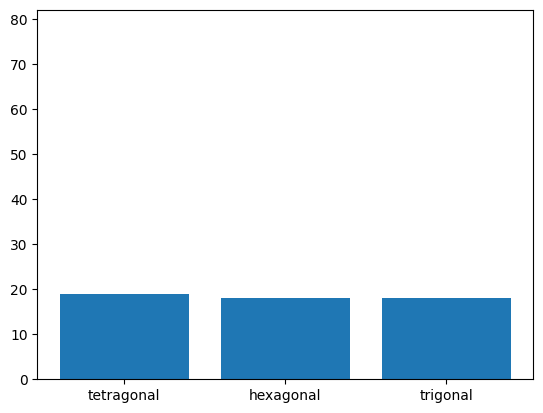

In [92]:
print(output_df.loc[output_df['mat_id'] == 'mp-1001786'].iloc[99]['Full DF Indicies'])
vals = pd.DataFrame(output_df.loc[output_df['mat_id'] == 'mp-1001786'].iloc[99]['Full Predictions Crystal System']).value_counts()
vals_use = []
for i in vals.index:
    vals_use.append(i[0])
print(vals_use)
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.bar(vals_use[0:3], np.asarray(vals)[0:3])
print(vals)
plt.ylim([0,82])
plt.savefig('Innacurate Example.pdf', bbox_inches="tight", transparent=True)

Figure S4 - Prediction Confidence (individual pattern)

Figure S5 - Aggregate Prediction Illustration

Figure 3 Aggregate Prediction Accuracy and confidence

In [5]:
with open('Model_data/Crystal_sys_outputs/cm_ag_percent.pkl', 'rb') as f:
    df_cm = pickle.load(f)

In [4]:
output_df_radial = joblib.load('Model_data/Crystal_sys_outputs/output_df_radial.joblib')

In [23]:
labels = []
for i in np.asarray(pd.DataFrame(rf_diff_obj.condensed_output_df.iloc[2]['Full Predictions Crystal System']).value_counts().index):
    labels.append(i[0][0:5])

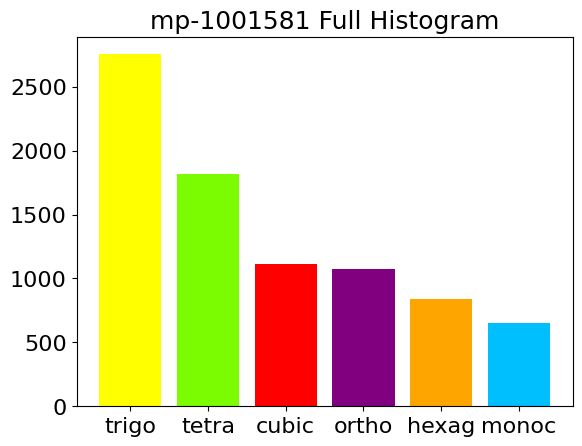

In [32]:
plt.title(rf_diff_obj.condensed_output_df.iloc[0]['mat_id'] + ' Full Histogram', fontsize = 18)
colors = ['yellow', 'lawngreen', 'red', 'purple', 'orange', 'deepskyblue']
for i in range(0, len(labels)): 
    plt.bar(labels[i], np.asarray(pd.DataFrame(rf_diff_obj.condensed_output_df.iloc[2]['Full Predictions Crystal System']).value_counts())[i],
           color = colors[i])
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.show()

In [15]:
condensed_output_df = joblib.load('Model_data/Crystal_sys_outputs/condensed_output_df.joblib')

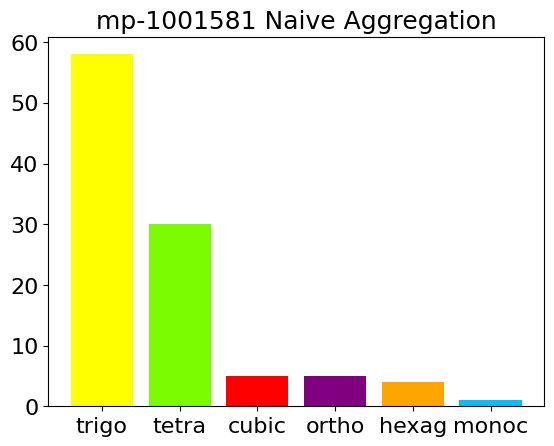

In [33]:
labels = []
for i in np.asarray(pd.DataFrame(condensed_output_df.iloc[2]['Full Predictions Crystal System']).value_counts().index):
    labels.append(i[0][0:5])
colors = ['yellow', 'lawngreen', 'red', 'purple', 'orange', 'deepskyblue']

plt.title(condensed_output_df.iloc[0]['mat_id'] + ' Naive Aggregation', fontsize = 18)
for i in range(0, len(labels)):
    plt.bar(labels[i], np.asarray(pd.DataFrame(condensed_output_df.iloc[2]['Full Predictions Crystal System']).value_counts())[i],
       color = colors[i])
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.show()

In [ ]:
print('file not found')
pred_crystal_system = []
labels_test_cry_sys = []
random_inds = 100
output_df = output_df_radial

for mat in output_df['mat_id'].unique():
    # print(mat)
    subdf = output_df.loc[output_df['mat_id'] == mat]
    labels_test_cry_sys.append(subdf.iloc[0]['True Values Crystal System'])

    subdf = subdf.sample(random_inds, random_state=42)

    predictions_across_zones_cry_sys = subdf['Predictions Crystal System']  

    xs_crystal = np.asarray(predictions_across_zones_cry_sys.value_counts().index)
    ys_crystal = np.asarray(predictions_across_zones_cry_sys.value_counts())
    pred_crystal_system.append(xs_crystal[0])


cm = confusion_matrix(labels_test_cry_sys, pred_crystal_system)

trues = 0
for i in range(0, len(cm)):
    trues += cm[i][i]

cm = cm/len(pred_crystal_system)
for i in range(0, len(cm)):
    for j in range(0, len(cm[0])):
        cm[i][j] = round(cm[i][j]*100, 3)
accuracy = trues/len(output_df['mat_id'].unique())
print('crystal system ' + str(accuracy))

file not found
crystal system 0.7754123289273599


NameError: name 'crystal_sys_alph' is not defined

In [ ]:
crystal_sys_alph = ['Cubic', 'Hexagonal', 'Monoclinic', 'Orthorhombic', 'Tetragonal', 'Trigonal']
df_cm = pd.DataFrame(cm, crystal_sys_alph, crystal_sys_alph)

In [ ]:
df_cm

,Cubic,Hexagonal,Monoclinic,Orthorhombic,Tetragonal,Trigonal
Cubic,10.715,0.023,0.433,0.866,0.094,0.000
Hexagonal,0.094,9.136,0.936,2.222,0.234,0.012
Monoclinic,0.023,0.012,19.546,3.287,0.386,0.000
Orthorhombic,0.082,0.012,3.462,22.985,0.655,0.000
Tetragonal,0.082,0.035,1.369,3.907,11.417,0.000
Trigonal,0.058,0.363,1.181,1.977,0.655,3.743


In [ ]:
df_cm.to_pickle('Model_data/Crystal_sys_outputs/cm_ag_percent_unrounded.pkl')

In [19]:
with open('Model_data/Crystal_sys_outputs/cm_ag_percent.pkl', 'rb') as f:
    df_cm = pickle.load(f)

In [20]:
df_cm

,cubic,hexagonal,trigonal,tetragonal,monoclinic,orthorhombic
cubic,10.8,0.1,0.0,0.1,0.5,0.7
hexagonal,0.1,9.2,0.1,0.3,1.0,1.9
trigonal,0.1,0.5,3.8,0.7,1.4,1.5
tetragonal,0.2,0.2,0.0,11.7,1.6,3.1
monoclinic,0.0,0.0,0.0,0.3,20.9,2.0
orthorhombic,0.2,0.0,0.0,0.7,3.5,22.7


In [21]:
crystal_sys_alph = ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'monoclinic', 'orthorhombic',]

In [22]:
# aggregate
trues = []
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm)[i])))

cubic 0.8852459016393444
hexagonal 0.7301587301587301
trigonal 0.475
tetragonal 0.6964285714285714
monoclinic 0.9008620689655172
orthorhombic 0.8376383763837638


In [23]:
# aggregate
trues = []
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm).T[i])))

cubic 0.9473684210526317
hexagonal 0.92
trigonal 0.9743589743589743
tetragonal 0.8478260869565217
monoclinic 0.7231833910034602
orthorhombic 0.7115987460815048


In [ ]:
# aggregate
trues = []
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm)[i])))

In [9]:
with open('Model_data/Crystal_sys_outputs/df_cm_percent_unrounded.pkl', 'rb') as f:
    df_cm = pickle.load(f)


In [11]:
# individual
crystal_sys_alph = ['Cubic', 'Hexagonal', 'Monoclinic', 'Orthorhombic', 'Tetragonal', 'Trigonal']
trues = []
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm)[i])))

Cubic 0.8623599163330262
Hexagonal 0.5812387318232992
Monoclinic 0.6935343431333167
Orthorhombic 0.7395169701194799
Tetragonal 0.6099508362354229
Trigonal 0.36383928016912653


In [12]:
crystal_sys_alph = ['Cubic', 'Hexagonal', 'Monoclinic', 'Orthorhombic', 'Tetragonal', 'Trigonal']
trues = []
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm).T[i])))

Cubic 0.9232859766013449
Hexagonal 0.7805331889843696
Monoclinic 0.6230406146026326
Orthorhombic 0.5659680831043485
Tetragonal 0.7042884018301169
Trigonal 0.8583958504278514


In [9]:
with open('Model_data/Crystal_sys_outputs/cm_ag_percent.pkl', 'rb') as f:
    df_ag_cm = pickle.load(f)

In [50]:
with open('Model_data/Crystal_sys_outputs/full_confidence_cm_ag.pkl', 'rb') as f:
    df_cm = pickle.load(f)

In [18]:
with open('Model_data/Crystal_sys_outputs/confidence_cm_ag.pkl', 'rb') as f:
    df_cm_ag_con = pickle.load(f)

In [20]:
df_cm_con = np.load('Model_data/Crystal_sys_outputs/prediction_matrix_confidence.npy')


In [17]:
predictions_matrix = []
predictions_ordered = rf_output_radial[0]
pred_crystal_system = rf_output_radial[1]
rf_model = rf_output_radial[2]

labels_test_cry_sys = np.asarray(rf_diff_obj.full_df.iloc[test_indicies]['crystal system'])
mp_ids = np.asarray(rf_diff_obj.full_df.iloc[test_indicies]['mat_id'])

crystal_sys_alph = ['Cubic', 'Hexagonal', 'Monoclinic', 'Orthorhombic', 'Tetragonal', 'Trigonal']

for j in range(0, len(crystal_sys_alph)):
    row = []
    for k in range(0, len(crystal_sys_alph)):
        row.append([])
    predictions_matrix.append(row)

predictions_confidence = []

predictions_ordered_cry_sys_full = []

for i in range(0, len(predictions_ordered)):
    #print(i)
    prediction_ordered_crystal_system = []
    for j in predictions_ordered[i]:
        prediction_ordered_crystal_system.append(rf_model.classes_[int(j)])

    prediction_ordered_cry_sys = prediction_ordered_crystal_system


    prediction_df_crystal_sys = pd.DataFrame(prediction_ordered_cry_sys, columns=['Predictions'])
    val_counts = prediction_df_crystal_sys['Predictions'].value_counts()

    confidence = max(val_counts) / sum(val_counts)
    predictions_confidence.append(confidence)

    prediction_mapped = map_predictions(pred_crystal_system[i], list_of_classes = crystal_sys_alph)
    true_mapped = map_predictions(labels_test_cry_sys[i], list_of_classes = crystal_sys_alph)
    predictions_matrix[true_mapped][prediction_mapped].append(confidence)

    predictions_ordered_cry_sys_full.append(prediction_ordered_cry_sys)

# for k in range(0, len(predictions_matrix)):
#     for l in range(0, len(predictions_matrix)):
#         if len(predictions_matrix[k][l]) == 0:
#             predictions_matrix[k][l] = 0
#         else:
#             predictions_matrix[k][l] = predictions_matrix[k][l]
# np.save('Model_data/Crystal_sys_outputs/prediction_matrix_confidence_full.npy', predictions_matrix)  

In [150]:
random_inds = 100
output_df = output_df_radial
crystal_sys_alph = ['Cubic', 'Hexagonal', 'Monoclinic', 'Orthorhombic', 'Tetragonal', 'Trigonal']
predictions_matrix = []
for j in range(0, len(crystal_sys_alph)):
    row = []
    for k in range(0, len(crystal_sys_alph)):
        row.append([])
    predictions_matrix.append(row)

predictions_confidence = []

# predictions_ordered_cry_sys_full = []
# predictions_ordered_space_group_full = []
# predictions_ordered_point_group_full = []

prediction_majority_crystal_sys = []
    # prediction_majority_point_group = []

for mat in output_df['mat_id'].unique():
    print(mat)
    subdf = output_df.loc[output_df['mat_id'] == mat]
    # labels_test_cry_sys.append(subdf.iloc[0]['True Values Crystal System'])
    true_val = subdf.iloc[0]['True Values Crystal System']
    subdf = subdf.sample(random_inds, random_state=42)

    predictions_across_zones_cry_sys = subdf['Predictions Crystal System']  
    xs = np.asarray(predictions_across_zones_cry_sys.value_counts().index)
    ys = np.asarray(predictions_across_zones_cry_sys.value_counts())
    prediction_majority_crystal_sys.append(xs[0])

    # prediction_ordered_space_group = []
    # for j in predictions_ordered[i]:
        # prediction_ordered_space_group.append(rf_model.classes_[int(j)])

   #  predictions_ordered_space_group_full.append(prediction_ordered_space_group)

    # prediction_ordered_cry_sys = np.asarray(predictions_across_zones_cry_sys)

    # prediction_ordered_point_group = point_group_from_space_group(prediction_ordered_space_group, point_group_df)

    # prediction_df_crystal_sys = pd.DataFrame(prediction_ordered_cry_sys, columns=['Predictions'])
    # val_counts = prediction_df_crystal_sys['Predictions'].value_counts()
    # prediction_majority_crystal_sys.append(val_counts.index[0])

    # prediction_df_point_group = pd.DataFrame(prediction_ordered_point_group, columns=['Predictions'])
    # val_counts = prediction_df_point_group['Predictions'].value_counts()
    # prediction_majority_point_group.append(val_counts.index[0])

    confidence = max(ys) / sum(ys)
    predictions_confidence.append(confidence)

    prediction_mapped = map_predictions(xs[0], list_of_classes = crystal_sys_alph)
    true_mapped = map_predictions(true_val, list_of_classes = crystal_sys_alph)
    predictions_matrix[true_mapped][prediction_mapped].append(confidence)

    # predictions_ordered_cry_sys_full.append(prediction_ordered_cry_sys)
    # predictions_ordered_point_group_full.append(prediction_ordered_point_group)

# for k in range(0, len(predictions_matrix)):
#     for l in range(0, len(predictions_matrix)):
#         print(k,l)
#         if len(predictions_matrix[k][l]) == 0:
#             predictions_matrix[k][l] = 0
#         else:
#             predictions_matrix[k][l] = np.std(predictions_matrix[k][l])
crystal_sys_alph = ['C', 'H', 'M', 'O', 'Te', 'Tr']
df_cm = pd.DataFrame(predictions_matrix, crystal_sys_alph, crystal_sys_alph)
df_cm.to_pickle('Model_data/Crystal_sys_outputs/full_confidence_cm_ag.pkl')

mp-1001581
mp-1001784
mp-1001786
mp-10020
mp-1002107
mp-1002136
mp-10039
mp-10045
mp-10046
mp-10051
mp-1005689
mp-1005792
mp-1005829
mp-1006283
mp-1006322
mp-1006368
mp-1006390
mp-10069
mp-1007636
mp-1007665
mp-1007691
mp-1007760
mp-1007907
mp-1008559
mp-1008561
mp-10086
mp-1008624
mp-1008733
mp-1008833
mp-1008910
mp-10091
mp-1009132
mp-1009230
mp-10094
mp-1009641
mp-1009834
mp-10105
mp-10112
mp-10135
mp-10136
mp-10142
mp-10143
mp-10154
mp-10165
mp-1017
mp-1017465
mp-1017507
mp-1017548
mp-1017566
mp-1018020
mp-1018099
mp-1018104
mp-1018106
mp-1018112
mp-1018116
mp-1018118
mp-1018122
mp-1018139
mp-1018150
mp-1018162
mp-1018176
mp-10184
mp-1018653
mp-1018666
mp-1018667
mp-1018669
mp-1018682
mp-1018687
mp-1018697
mp-1018698
mp-1018701
mp-1018705
mp-1018712
mp-1018713
mp-1018728
mp-1018732
mp-1018735
mp-1018736
mp-1018740
mp-1018744
mp-1018751
mp-1018762
mp-1018782
mp-1018786
mp-1018800
mp-1018814
mp-1018815
mp-1018822
mp-1018823
mp-1018826
mp-1018829
mp-1018892
mp-1018893
mp-1018896
mp-10

In [16]:
confidences = np.asarray(df_cm)[i][j]
# df_confidences_temp = pd.DataFrame(confidences) 
confidences

10.7

In [53]:
on_d = []
off_d = []
for i in range(0, len(np.asarray(df_cm))):
    for j in range(0, len(np.asarray(df_cm)[0])):
        if i == j:
            for k in np.asarray(df_cm)[i][j]:
                on_d.append(k)
        else:
            for l in np.asarray(df_cm)[i][j]:
                off_d.append(l) 

In [19]:
on_d = []
off_d = []
for i in range(0, len(np.asarray(predictions_matrix))):
    for j in range(0, len(np.asarray(predictions_matrix)[0])):
        if i == j:
            for k in np.asarray(predictions_matrix)[i][j]:
                on_d.append(k)
        else:
            for l in np.asarray(predictions_matrix)[i][j]:
                off_d.append(l) 

/tmp/ipykernel_782431/348334150.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  for i in range(0, len(np.asarray(predictions_matrix))):
/tmp/ipykernel_782431/348334150.py:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  for j in range(0, len(np.asarray(predictions_matrix)[0])):
/tmp/ipykernel_782431/348334150.py:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=obje

In [20]:
np.mean(off_d)

0.37782639152104674

In [21]:
np.mean(on_d)

0.5468353419115037

In [ ]:
for i in range(0, len(np.asarray(df_ag_cm))):
    for j in range(0, len(np.asarray(df_ag_cm)[0])):
        if i == j:
            plt.scatter(np.asarray(df_ag_cm)[i][j], np.asarray(df_cm_ag_con)[i][j], color = 'red')
        else:
            plt.scatter(np.asarray(df_ag_cm)[i][j], np.asarray(df_cm_ag_con)[i][j], color = 'steelblue')

In [76]:
rf_diff_obj.visualize_lattice_results_mat_id('trigonal', material_id = 'all', show_plots = False, use_scaled = False)

trigonal
loading dfs
not using scaled
2046
682
using unscaled cols
[5.330999999999999, 5.896875, 5.426625000000001, 5.287749999999999, 5.08, 5.225249999999997, 5.282624999999998, 5.488625, 5.35675, 5.414874999999999, 5.4776250000000015, 5.953999999999999, 4.9613749999999985, 4.836625000000002, 5.486875000000002, 5.233249999999999, 5.3226249999999995, 5.992874999999999, 5.187250000000001, 5.738249999999997, 5.270999999999999, 4.923125000000001, 4.235499999999999, 5.179875000000002, 5.550625000000001, 5.762750000000002, 5.201999999999998, 5.459625000000002, 5.370125, 5.102999999999999, 4.822624999999999, 4.809125, 5.356125, 5.35375, 5.278124999999998, 5.034375, 5.365875, 5.2805, 5.349125, 5.531375000000002, 5.027125000000002, 5.958, 5.4417500000000025, 5.53875, 5.284875, 5.426749999999998, 5.254250000000002, 5.335999999999998, 5.127124999999999, 5.111374999999997, 5.379249999999999, 5.286875, 5.224874999999999, 4.753750000000001, 4.697750000000001, 5.093625000000001, 5.357874999999999, 5

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



[10.651499999999997, 11.020125000000004, 11.567375000000002, 12.839750000000006, 12.289500000000004, 12.560250000000005, 12.889000000000001, 12.919000000000006, 13.025875000000005, 10.828500000000002, 11.9555, 11.587875000000006, 10.529999999999996, 11.755625, 11.885875000000006, 10.043999999999999, 11.101500000000001, 12.655500000000005, 9.896375000000003, 10.651125000000006, 10.23275, 11.207375000000003, 11.55725, 11.857875000000002, 12.219750000000001, 11.403249999999996, 12.020750000000007, 13.237125, 13.192625000000001, 11.605625000000007, 11.262250000000005, 12.580375000000002, 11.341999999999997, 11.517374999999998, 12.432750000000004, 11.612500000000004, 11.458000000000006, 9.9365, 12.523125000000004, 12.257125000000002, 12.64325, 11.826625000000003, 11.642875000000007, 12.204625000000007, 11.083000000000002, 13.145374999999998, 11.927000000000001, 12.413749999999995, 12.928125, 13.004375, 12.091125000000005, 13.039000000000012, 11.710875000000001, 13.108375000000013, 12.994875

In [77]:
rf_diff_obj.full_out_df

,a_full_predictions,a_mode,a_true,b_full_predictions,b_mode,b_true,c_full_predictions,c_mode,c_true,alpha_full_predictions,alpha_mode,alpha_true,beta_full_predictions,beta_mode,beta_true,gamma_full_predictions,gamma_mode,gamma_true,material_id
0,"[5.330999999999999, 5.896875, 5.42662500000000...",5.333859,5.36,"[5.330999999999999, 5.896875, 5.42662500000000...",5.333859,5.36,"[14.372499999999999, 14.209624999999999, 11.74...",14.83075,13.09,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[120.0, 120.0, 120.0, 120.0, 120.0, 120.0, 120...",120.041667,120.0,mp-2920
0,"[4.637624999999999, 5.008499999999997, 4.85662...",5.239,4.52,"[4.637624999999999, 5.008499999999997, 4.85662...",5.239,4.52,"[26.802249999999994, 24.322875, 23.538125, 24....",17.485156,18.41,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[120.0, 120.0, 120.0, 120.0, 120.0, 120.0, 120...",120.041667,120.0,mp-569044
0,"[7.247750000000001, 8.099375, 8.98925, 5.96625...",8.729349,8.66,"[7.247750000000001, 8.099375, 8.98925, 5.96625...",8.729349,8.66,"[11.081, 11.021124999999998, 7.210374999999999...",11.385198,8.6,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[120.0, 120.0, 120.0, 120.0, 120.0, 120.0, 120...",120.041667,120.0,mp-560217
0,"[4.192499999999999, 4.367875000000001, 4.34674...",4.274906,4.26,"[4.192499999999999, 4.367875000000001, 4.34674...",4.274906,4.26,"[7.752250000000001, 7.588875, 12.6723750000000...",7.726849,4.96,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[120.0, 120.0, 120.0, 120.0, 120.0, 120.0, 120...",120.041667,120.0,mp-978847
0,"[6.412999999999999, 7.489500000000001, 6.54612...",7.532448,7.94,"[6.412999999999999, 7.489500000000001, 6.54612...",7.532448,7.94,"[13.694874999999996, 12.180999999999997, 18.22...",10.800396,10.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[120.0, 120.0, 120.0, 120.0, 120.0, 120.0, 120...",120.041667,120.0,mp-1068340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,"[3.9159263731060596, 4.387124999999999, 4.1056...",4.026297,3.9,"[3.9159263731060596, 4.387124999999999, 4.1056...",4.026297,3.9,"[7.321593276515152, 7.813750000000001, 7.98949...",7.816344,6.73,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[120.0, 120.0, 120.0, 120.0, 120.0, 120.0, 120...",120.041667,120.0,mp-5598
0,"[3.6608749999999985, 4.369874999999999, 4.0298...",3.950687,3.73,"[3.6608749999999985, 4.369874999999999, 4.0298...",3.950687,3.73,"[6.981375000000004, 10.835499999999996, 9.4167...",6.891399,5.89,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[120.0, 120.0, 120.0, 120.0, 120.0, 120.0, 120...",120.041667,120.0,mp-20470
0,"[11.669624999999993, 7.573250000000002, 8.2158...",7.835797,11.84,"[11.669624999999993, 7.573250000000002, 8.2158...",7.835797,11.84,"[6.978875, 10.712875, 10.985875000000004, 7.96...",8.227755,6.31,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[120.0, 120.0, 120.0, 120.0, 120.0, 120.0, 120...",120.041667,120.0,mp-3889
0,"[5.451999999999999, 6.255374999999999, 5.78724...",5.535693,5.51,"[5.451999999999999, 6.255374999999999, 5.78724...",5.535693,5.51,"[18.196000000000012, 15.443999999999999, 14.64...",15.479125,15.58,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90.0, 90....",90.041667,90.0,"[120.0, 120.0, 120.0, 120.0, 120.0, 120.0, 

Figure 4 - RMSE of lattice prediction and accuracy of space group 

In [46]:
rf_diff_obj.space_group_full_out_df.reset_index(inplace = True)

In [47]:
rf_diff_obj.space_group_full_out_df

,index,space_group_predictions,space_group_mode,true_space_group,material_id
0,0,"[15, 14, 15, 14, 12, 15, 15, 12, 14, 15, 15, 1...",14,15,mp-1006390
1,0,"[12, 14, 12, 12, 14, 14, 12, 15, 12, 12, 12, 1...",12,12,mp-10094
2,0,"[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 1...",14,13,mp-1019513
3,0,"[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 1...",14,11,mp-1019546
4,0,"[15, 14, 14, 14, 14, 12, 14, 12, 14, 12, 14, 1...",14,5,mp-1019566
...,...,...,...,...,...
1983,0,"[15, 15, 14, 14, 14, 14, 14, 14, 14, 14, 14, 1...",14,15,mp-9804
1984,0,"[14, 14, 14, 14, 12, 15, 14, 15, 14, 14, 14, 1...",14,14,mp-982366
1985,0,"[15, 14, 12, 14, 14, 14, 14, 14, 14, 14, 12, 1...",14,14,mp-984806
1986,0,"[12, 14, 14, 14, 11, 12, 14, 14, 11, 14, 14, 1...",14,11,mp-9849


In [15]:
# ind_trues = []
count_trues = 0
# ind_all = []
count_all = 0

for i in range(0, len(rf_diff_obj.space_group_full_out_df)):
    row = rf_diff_obj.space_group_full_out_df.iloc[i]
    for pred in row['space_group_predictions']:
        if pred == row['true_space_group']:
            count_trues += 1
            count_all += 1 
        else:
            count_all += 1
    # ind_trues.append(count_trues)
    # ind_all.append(count_all)

In [37]:
rf_diff_obj.space_group_rf_output[1][0:100]

array([12, 15, 14, 15, 14, 12, 15, 15, 12, 14, 15, 15, 14, 14, 12, 14, 14,
       12, 14, 14, 12, 14, 12, 14, 14, 12, 14, 12, 12, 14, 14, 12, 15, 14,
       12, 12, 14, 12, 12, 12, 12, 12, 14, 12, 14, 15, 12, 12, 12, 12, 14,
       14, 14, 12, 12, 14, 14, 14, 14, 12, 15, 15, 14, 14, 14, 12, 15, 12,
       15, 15, 12, 14, 12, 12, 14, 15, 14, 14, 14, 12, 12, 12, 12, 14, 12,
       14, 15, 14, 14, 14, 14, 15, 12, 15, 14, 14, 12, 14, 15, 14])

In [38]:
rf_diff_obj.space_group_full_out_df.reset_index(inplace = True)

In [40]:
rf_diff_obj.space_group_full_out_df.iloc[0]['space_group_predictions']

array([14, 15, 14, 15, 15, 15, 15, 15, 15, 12, 14, 14, 14, 15, 14, 12, 14,
       12, 15, 14, 12, 15, 12, 15, 15, 12, 15, 12, 15, 12, 15, 15, 15, 14,
       14, 12, 15, 12, 12, 12, 14, 15, 12, 15, 12, 15, 15, 14, 12, 12, 15,
       15, 12, 12, 12, 15, 12, 15, 15, 15, 15, 12, 15, 12, 12, 15, 15, 12,
       12, 15, 15, 12, 15, 12, 15, 15, 14, 12, 15, 15, 14, 14, 14, 14, 14,
       14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14])

In [19]:
count_trues/count_all

0.470929612648703

In [30]:
rf_diff_obj.space_group_radial_inputs[5][0]

'mp-643392'

In [31]:
np.asarray(rf_diff_obj.space_group_radial_inputs[1])[0]

array([ 1.17729123e-33,  0.00000000e+00,  1.03341843e-33, ...,
       -1.69896189e+00,  1.40699729e-05,  5.49924244e-01])

In [ ]:
rf_diff_obj.full_df.loc[rf_diff_obj.full_df['mat_id'] == 'mp-643392']

In [43]:
rf_diff_obj.space_group_radial_inputs[3].loc[rf_diff_obj.space_group_radial_inputs[3]['mat_id'] == 'mp-643392']

,space_group_first,mat_id
170602,14,mp-643392
170603,14,mp-643392
170604,14,mp-643392
170605,14,mp-643392
170606,14,mp-643392
...,...,...
170697,14,mp-643392
170698,14,mp-643392
170699,14,mp-643392
170700,14,mp-643392


In [50]:
system = 'monoclinic'
space_group_df = joblib.load('Model_data/Lattice_inputs_and_outputs/radial_'+system+'_df_w_lattice.joblib')
space_group_radial_inputs = prepare_training_and_test(space_group_df, split_by_material = True, quantity = 'space_group_first', column_to_use = '200_ang')

radial_inputs_0 = space_group_radial_inputs[0]
radial_inputs_1 = space_group_radial_inputs[1] 
radial_inputs_2 = space_group_radial_inputs[2] 
radial_inputs_3 = space_group_radial_inputs[3] 

rf_output_radial = rf_diffraction(radial_inputs_2, radial_inputs_3, radial_inputs_0, radial_inputs_1, num_trees = 128, max_depth = 30,
                              index_to_use = 9, max_features = 'auto')

new_input_train = []
for inp in space_group_radial_inputs[0]:
    new_input_train.append(np.asarray(inp))
new_input_train = np.asarray(new_input_train)
joblib.dump(new_input_train, 'Model_data/Space_group_inputs_and_outputs/'+system+'_space_groups_input_train_0.joblib', compress = 0)

new_input_test = []
for test in space_group_radial_inputs[1]:
    new_input_test.append(np.asarray(test))
new_input_test = np.asarray(new_input_test)
joblib.dump(new_input_test, 'Model_data/Space_group_inputs_and_outputs/'+system+'_space_groups_input_test_1.joblib', compress = 0)

space_group_radial_inputs[2].to_pickle('Model_data/Space_group_inputs_and_outputs/'+system+'_space_groups_inputs_labels_train_2.pkl')
space_group_radial_inputs[3].to_pickle('Model_data/Space_group_inputs_and_outputs/'+system+'_space_groups_labels_test_3.pkl')

joblib.dump(rf_output_radial, 'Model_data/Space_group_inputs_and_outputs/'+system+'_space_group_model.joblib')

5961
1987
0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
200000
210000
220000
230000
240000
250000
260000
270000
280000
290000
300000
310000
320000
330000
340000
350000
360000
370000
380000
390000
400000
410000
420000
430000
440000
450000
460000
470000
480000
490000
500000
510000
520000
530000
540000
550000
560000
570000
580000
590000
0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
200000
210000
220000
230000
240000
250000
260000
270000
280000
290000
300000
310000
320000
330000
340000
350000
360000
370000
380000
390000
400000
410000
420000
430000
440000
450000
460000
470000
480000
490000
500000
510000
520000
530000
540000
550000
560000
570000
580000
590000
0
10000
20000
30000
40000
50000
60000
70000
80000
90

/global/homes/s/smglsn12/.conda/envs/new-ml/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 128 concurrent workers.


building tree 1 of 128
building tree 2 of 128
building tree 3 of 128
building tree 4 of 128
building tree 5 of 128
building tree 6 of 128
building tree 7 of 128
building tree 8 of 128
building tree 9 of 128
building tree 10 of 128
building tree 11 of 128
building tree 12 of 128
building tree 13 of 128
building tree 14 of 128
building tree 15 of 128
building tree 16 of 128
building tree 17 of 128
building tree 18 of 128
building tree 19 of 128
building tree 20 of 128
building tree 21 of 128
building tree 22 of 128
building tree 23 of 128
building tree 24 of 128
building tree 25 of 128
building tree 26 of 128
building tree 27 of 128
building tree 28 of 128
building tree 29 of 128
building tree 30 of 128
building tree 31 of 128
building tree 32 of 128
building tree 33 of 128
building tree 34 of 128
building tree 35 of 128
building tree 36 of 128
building tree 37 of 128
building tree 38 of 128
building tree 39 of 128
building tree 40 of 128
building tree 41 of 128
building tree 42 of 128
b

[Parallel(n_jobs=-1)]: Done   3 out of 128 | elapsed:   59.5s remaining: 41.3min
[Parallel(n_jobs=-1)]: Done  68 out of 128 | elapsed:  1.5min remaining:  1.3min
[Parallel(n_jobs=-1)]: Done 128 out of 128 | elapsed:  1.8min finished
[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.5s remaining:   18.9s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.7s remaining:    0.6s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.8s finished


accuracy = 0.6243157519063441


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.3s remaining:   10.8s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.7s remaining:    0.6s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.8s finished


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127


['Model_data/Space_group_inputs_and_outputs/monoclinic_space_group_model.joblib']

In [55]:
len(space_group_radial_inputs[3])

198941

In [59]:
space_group_df

,level_0,mat_id,zone,radial_200_ang_Colin_basis,crystal system,point group,space_group_first,space_group_symbol,structure,x,y,z,alpha,beta,gamma,ids
0,803,mp-1001,"(-0.4339311841778313, 0.5480900206616165, 0.71...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",monoclinic,2/m,15,C2/c,"[[ 1.31776095 2.156909 -5.29519569] Ba, [ 3...",7.17,4.45,7.31,90.0,105.11,90.0,mp-1001
1,804,mp-1001,"(-0.4270065713773833, 0.29524202612464434, 0.8...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",monoclinic,2/m,15,C2/c,"[[ 1.31776095 2.156909 -5.29519569] Ba, [ 3...",7.17,4.45,7.31,90.0,105.11,90.0,mp-1001
2,805,mp-1001,"(-0.9394051308718169, -4.328667802898273e-17, ...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",monoclinic,2/m,15,C2/c,"[[ 1.31776095 2.156909 -5.29519569] Ba, [ 3...",7.17,4.45,7.31,90.0,105.11,90.0,mp-1001
3,806,mp-1001,"(-0.1823005603873328, 0.9742182567822844, 0.13...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",monoclinic,2/m,15,C2/c,"[[ 1.31776095 2.156909 -5.29519569] Ba, [ 3...",7.17,4.45,7.31,90.0,105.11,90.0,mp-1001
4,807,mp-1001,"(0.6051158786438114, -1.0052870606470682e-16, ...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",monoclinic,2/m,15,C2/c,"[[ 1.31776095 2.156909 -5.29519569] Ba, [ 3...",7.17,4.45,7.31,90.0,105.11,90.0,mp-1001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795710,3437536,mp-9983,"(0.22324493114017258, 0.9224158077375313, 0.31...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",monoclinic,2/m,11,P2_1/m,"[[ 0.85641096 5.02496049 -3.29667776] Ta, [ 2...",6.62,3.43,9.28,90.0,104.45,90.0,mp-9983
795711,3437537,mp-9983,"(0.5494176270468438, 0.8283585186837866, 0.109...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",monoclinic,2/m,11,P2_1/m,"[[ 0.85641096 5.02496049 -3.29667776] Ta, [ 2...",6.62,3.43,9.28,90.0,104.45,90.0,mp-9983
795712,3437538,mp-9983,"(0.18244164273988372, 0.9572787906302195, 0.22...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",monoclinic,2/m,11,P2_1/m,"[[ 0.85641096 5.02496049 -3.29667776] Ta, [ 2...",6.62,3.43,9.28,90.0,104.45,90.0,mp-9983
795713,3437539,mp-9983,"(0.40040743408799095, 0.6079294928094269, 0.68...","[[0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, 0j, ...",monoclinic,2/m,11,P2_1/m,"[[ 0.85641096 5.02496049 -3.29667776] Ta, [ 2...",6.62,3.43,9.28,90.0,104.45,90.0,mp-9983


In [60]:
with open('Model_data/Crystal_sys_dataframes/full_data_monoclinic.pkl', 'rb') as f:
    space_group_radial_df = pickle.load(f)

In [65]:
bad_indicies = space_group_radial_df.loc[space_group_radial_df['mat_id'] == 'mp-510271'].index
space_group_radial_df.drop(bad_indicies, inplace = True)
space_group_radial_df.reset_index(inplace = True)
space_group_radial_df.drop('index', axis = 1, inplace = True)
space_group_radial_df.to_pickle('Model_data/Crystal_sys_dataframes/full_data_monoclinic.pkl')

In [54]:
rf_diff_obj.space_group_rf_output[2].score(np.asarray(space_group_radial_inputs[1]), 
                                                                                  np.asarray(space_group_radial_inputs[3]))

[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.5s remaining:   18.9s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    1.0s remaining:    0.9s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    1.1s finished


0.6243157519063441

##### rf_diff_obj.loaded_submodels = [False, '']

In [102]:
crystal_sys_alph = ['orthorhombic', 'cubic', 'hexagonal', 'monoclinic', 'tetragonal', 'trigonal']
# crystal_sys_alph = ['monoclinic']
for cry in crystal_sys_alph:
    rf_diff_obj.visualize_space_group_results_mat_id(cry, material_id =  'all', show_plots = False, use_scaled = False)
    print('accuracy individual ' + str(rf_diff_obj.space_group_rf_output[2].score(np.asarray(rf_diff_obj.space_group_radial_inputs[1]), 
                                                                                  np.asarray(rf_diff_obj.space_group_radial_inputs[3]['space_group_first']))))
    count = 0
    for i in range(0, len(rf_diff_obj.space_group_full_out_df)):
        row = rf_diff_obj.space_group_full_out_df.iloc[i]
        if row.space_group_mode == row.true_space_group:
            count += 1 
    print('accuracy aggregated ' + str(count/len(rf_diff_obj.space_group_full_out_df)))

orthorhombic
loading dfs
starting
loaded dfs
6975
2325


[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.5s remaining:   20.1s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    2.8s remaining:    2.5s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    3.4s finished


accuracy individual 0.4956557538746558
accuracy aggregated 0.5027956989247312
cubic
loading dfs
starting
loaded dfs
3110
1037


KeyboardInterrupt: 

In [48]:
rf_diff_obj.space_group_rf_output[2].score(np.asarray(rf_diff_obj.space_group_radial_inputs[1]), 
                                                                                  np.asarray(rf_diff_obj.space_group_radial_inputs[3]['space_group_first']))

[Parallel(n_jobs=128)]: Using backend ThreadingBackend with 128 concurrent workers.
[Parallel(n_jobs=128)]: Done   3 out of 128 | elapsed:    0.3s remaining:   13.9s
[Parallel(n_jobs=128)]: Done  68 out of 128 | elapsed:    0.7s remaining:    0.6s
[Parallel(n_jobs=128)]: Done 128 out of 128 | elapsed:    0.9s finished


0.6931625778121656

Figure 5 - Full Test Set Accuracy

In [8]:
# rf_diff_obj.output_df

In [28]:
rf_diff_obj.load_output_df_radial(path = 'Model_data/Crystal_sys_outputs/output_df_radial.joblib')
rf_diff_obj.condense_crystal_system_output()

mp-1001581
mp-1001784
mp-1001786
mp-10020
mp-1002107
mp-1002136
mp-10039
mp-10045
mp-10046
mp-10051
mp-1005689
mp-1005792
mp-1005829
mp-1006283
mp-1006322
mp-1006368
mp-1006390
mp-10069
mp-1007636
mp-1007665
mp-1007691
mp-1007760
mp-1007907
mp-1008559
mp-1008561
mp-10086
mp-1008624
mp-1008733
mp-1008833
mp-1008910
mp-10091
mp-1009132
mp-1009230
mp-10094
mp-1009641
mp-1009834
mp-10105
mp-10112
mp-10135
mp-10136
mp-10142
mp-10143
mp-10154
mp-10165
mp-1017
mp-1017465
mp-1017507
mp-1017548
mp-1017566
mp-1018020
mp-1018099
mp-1018104
mp-1018106
mp-1018112
mp-1018116
mp-1018118
mp-1018122
mp-1018139
mp-1018150
mp-1018162
mp-1018176
mp-10184
mp-1018653
mp-1018666
mp-1018667
mp-1018669
mp-1018682
mp-1018687
mp-1018697
mp-1018698
mp-1018701
mp-1018705
mp-1018712
mp-1018713
mp-1018728
mp-1018732
mp-1018735
mp-1018736
mp-1018740
mp-1018744
mp-1018751
mp-1018762
mp-1018782
mp-1018786
mp-1018800
mp-1018814
mp-1018815
mp-1018822
mp-1018823
mp-1018826
mp-1018829
mp-1018892
mp-1018893
mp-1018896
mp-10

In [29]:
joblib.dump(rf_diff_obj.condensed_output_df, 'condensed_output_df.joblib')

['condensed_output_df.joblib']

In [31]:
rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df['mat_id'] == 'mp-1001786']

,mat_id,True Values Crystal System,Full Predictions Crystal System,Aggregate Predictions Crystal System,Prediction Confidence,Full Df Indicies
0,mp-1001786,trigonal,"[tetragonal, hexagonal, trigonal, trigonal, te...",trigonal,0.563107,"[2520, 2521, 2522, 2523, 2524, 2525, 2526, 252..."


In [82]:
count = 0 
for i in range(0, len(rf_diff_obj.condensed_output_df)):
    count += len(rf_diff_obj.condensed_output_df.iloc[i]['Full Predictions Crystal System'])
print(count)

859656


In [5]:
rf_diff_obj.condensed_output_df = joblib.load('Model_data/Crystal_sys_outputs/10_pattern_lattice_added_difference_aggregation_condensed_df.joblib')

In [22]:
warnings.filterwarnings('ignore')
systems = ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']
systems.reverse()
percentages = []

for cry_sys in systems:
    predicted_cry_sys = rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System']== cry_sys]
    
    test_cry_sys_correct_predictions = rf_diff_obj.condensed_output_df.loc[(rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System'] == cry_sys) & 
                                                                           (rf_diff_obj.condensed_output_df['True Values Crystal System'] == cry_sys)]
    
    percent_correctly_predicted = len(test_cry_sys_correct_predictions)/len(predicted_cry_sys)
    print(cry_sys + ' ' + str(percent_correctly_predicted))
    percentages.append(percent_correctly_predicted)

monoclinic 0.7225363489499192
orthorhombic 0.7107286708165507
tetragonal 0.848768054375531
trigonal 0.9644970414201184
hexagonal 0.9247943595769683
cubic 0.944672131147541


In [12]:
inac_con = []
acc_con = []
for i in range(0, len(rf_diff_obj.output_df)):
    row = rf_diff_obj.output_df.iloc[i]
    if row['Predictions Crystal System'] == row['True Values Crystal System']:
        acc_con.append(row['Confidence Crystal System'])
    if row['Predictions Crystal System'] != row['True Values Crystal System']:
        inac_con.append(row['Confidence Crystal System'])

print(np.mean(inac_con))
print(np.mean(acc_con))

0.37782639152104697
0.546835341911504


In [13]:
inac_con = []
acc_con = []
for i in range(0, len(rf_diff_obj.condensed_output_df)):
    row = rf_diff_obj.condensed_output_df.iloc[i]
    if row['Aggregate Predictions Crystal System'] == row['True Values Crystal System']:
        acc_con.append(row['Prediction Confidence'])
    if row['Aggregate Predictions Crystal System'] != row['True Values Crystal System']:
        inac_con.append(row['Prediction Confidence'])
        
print(np.mean(inac_con))
print(np.mean(acc_con))

0.6591566874048003
0.8841106942870901


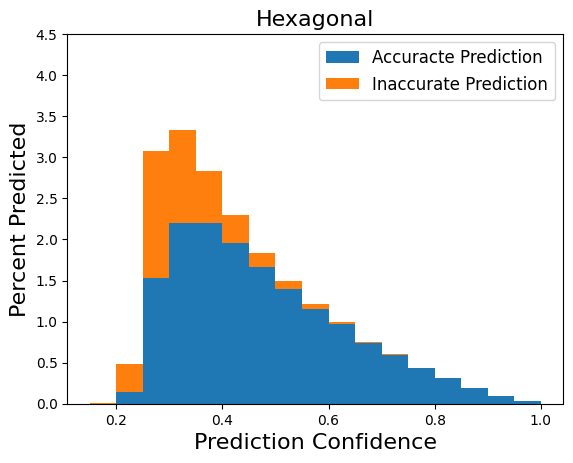

In [15]:
# for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
for cry_sys in ['hexagonal']:
    cry_sys_df = rf_diff_obj.output_df.loc[rf_diff_obj.output_df['Predictions Crystal System'] == cry_sys]
    true_cry_sys_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']==cry_sys]	
    wrong_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']!=cry_sys]
    # plt.hist(cry_sys_df['Prediction Confidence'], bins=np.arange(0.15, 1.05, 0.05), facecolor = 'white', density = True)
    hist = plt.hist([np.asarray(true_cry_sys_pred['Confidence Crystal System']),np.asarray(wrong_pred['Confidence Crystal System'])], 
             bins=np.arange(0.15, 1.05, 0.05), stacked=True, label=['Accuracte Prediction', 'Inaccurate Prediction'], density = True)
    plt.legend(fontsize = 12)
    plt.title(cry_sys.capitalize(), fontsize = 16)
    plt.ylim([0,4.5])
    plt.ylabel('Percent Predicted', fontsize = 16)
    plt.xlabel('Prediction Confidence', fontsize = 16)
    mpl.style.use('default')
    plt.rcParams['pdf.fonttype'] = 'truetype'
    # plt.savefig('Figures/Figure S4/Figure S4 '+ cry_sys +'.pdf', bbox_inches="tight")
    plt.show()

In [23]:
print(hist[1][3:5])
hist[0][0][3]/hist[0][1][3]

[0.3  0.35]


0.6600901500036946

In [25]:
print(hist[1][7:9])
hist[0][0][7]/hist[0][1][7]

[0.5  0.55]


0.9379934210526315

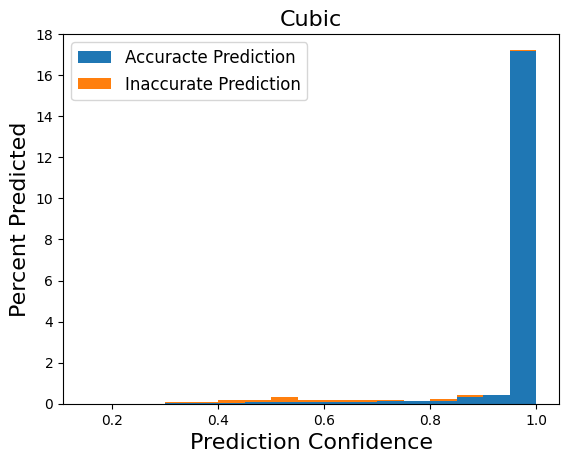

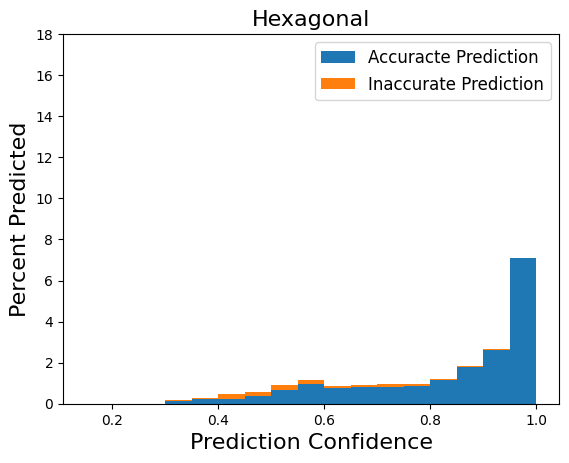

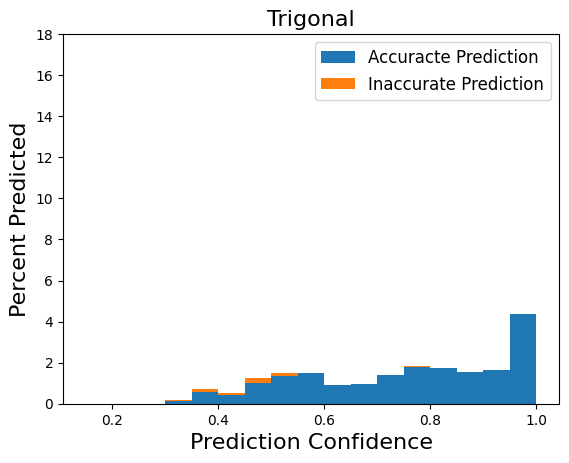

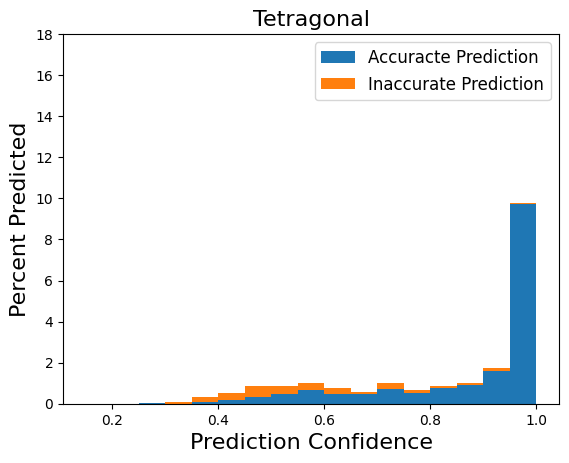

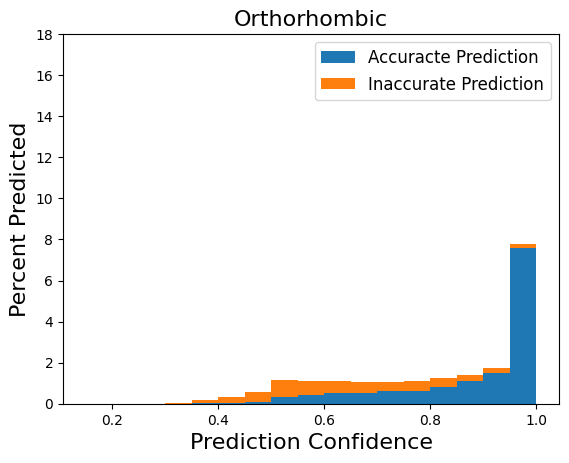

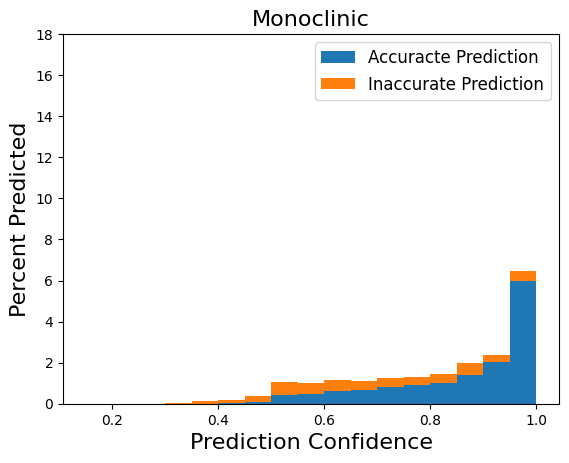

In [11]:
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
    cry_sys_df = rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System'] == cry_sys]
    true_cry_sys_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']==cry_sys]	
    wrong_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']!=cry_sys]
    # plt.hist(cry_sys_df['Prediction Confidence'], bins=np.arange(0.15, 1.05, 0.05), facecolor = 'white', density = True)
    hist = plt.hist([np.asarray(true_cry_sys_pred['Prediction Confidence']),np.asarray(wrong_pred['Prediction Confidence'])], 
             bins=np.arange(0.15, 1.05, 0.05), stacked=True, label=['Accuracte Prediction', 'Inaccurate Prediction'], density = True)
    plt.legend(fontsize = 12)
    plt.title(cry_sys.capitalize(), fontsize = 16)
    plt.ylim([0,18])
    plt.ylabel('Percent Predicted', fontsize = 16)
    plt.xlabel('Prediction Confidence', fontsize = 16)
    mpl.style.use('default')
    plt.rcParams['pdf.fonttype'] = 'truetype'
    plt.savefig('Figures/Figure S4/10 ag Figure S4 '+ cry_sys +'.pdf', bbox_inches="tight")
    plt.show()

In [26]:
hist

(array([[0.        , 0.        , 0.        , 0.        , 0.00807754,
         0.04846527, 0.10500808, 0.44426494, 0.46042003, 0.59773829,
         0.66235864, 0.79159935, 0.88852989, 1.02584814, 1.40549273,
         2.01938611, 5.99353796],
        [0.        , 0.        , 0.00807754, 0.03231018, 0.12116317,
         0.20193861, 0.39579968, 1.05008078, 1.02584814, 1.1631664 ,
         1.11470113, 1.26817447, 1.31663974, 1.47011309, 1.97899838,
         2.36672052, 6.48626817]]),
 array([0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 , 0.65,
        0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ]),
 <a list of 2 BarContainer objects>)

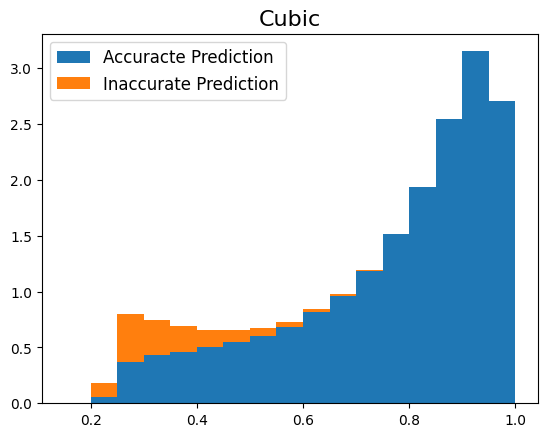

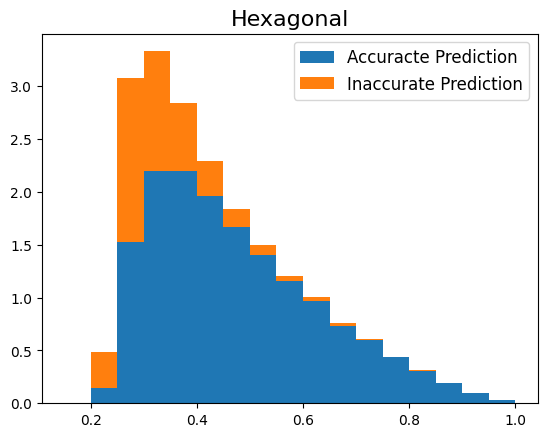

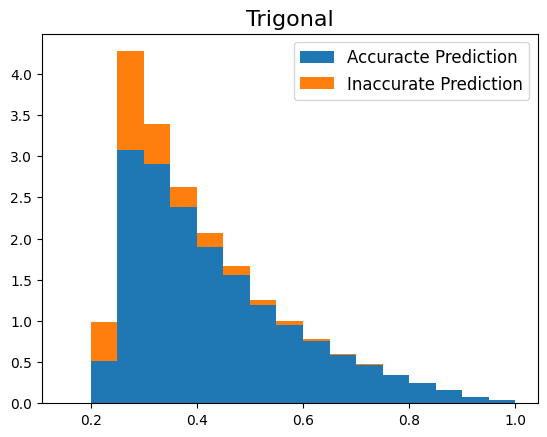

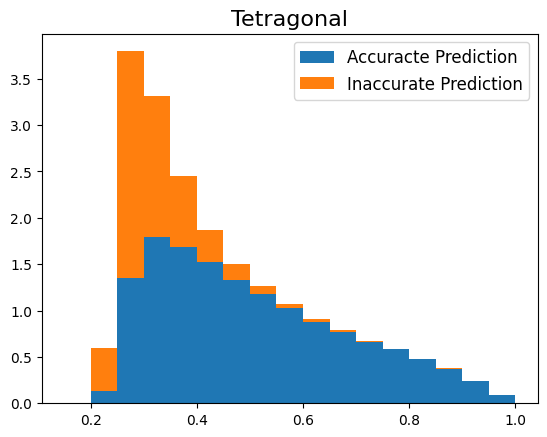

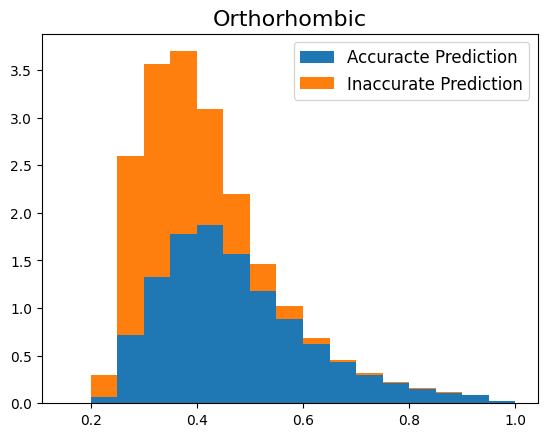

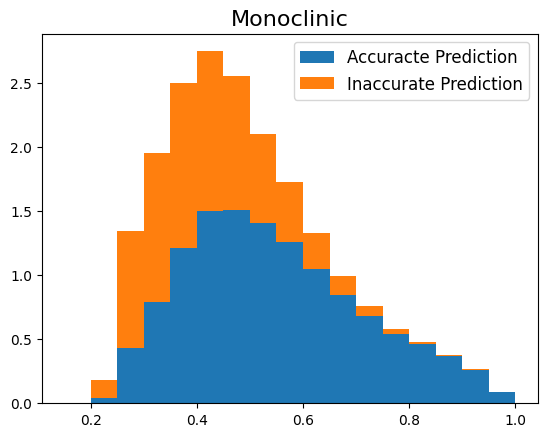

In [12]:
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
    cry_sys_df = rf_diff_obj.output_df.loc[rf_diff_obj.output_df['Predictions Crystal System'] == cry_sys]
    true_cry_sys_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']==cry_sys]	
    wrong_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']!=cry_sys]
    plt.hist([np.asarray(true_cry_sys_pred['Confidence Crystal System']),np.asarray(wrong_pred['Confidence Crystal System'])], 
             bins=np.arange(0.15, 1.05, 0.05), stacked=True, label=['Accuracte Prediction', 'Inaccurate Prediction'], density = True)
    plt.legend(fontsize = 12)
    plt.title(cry_sys.capitalize(), fontsize = 16)
    mpl.style.use('default')
    plt.rcParams['pdf.fonttype'] = 'truetype'
    plt.savefig('Figures/Figure S4/Figure S4 '+ cry_sys +'.pdf', bbox_inches="tight")
    plt.show()

# figure s4

orthorhombic 0.2892713291834493
monoclinic 0.27746365105008075
tetragonal 0.15123194562446898
hexagonal 0.07520564042303172
cubic 0.055327868852459015
trigonal 0.03550295857988166


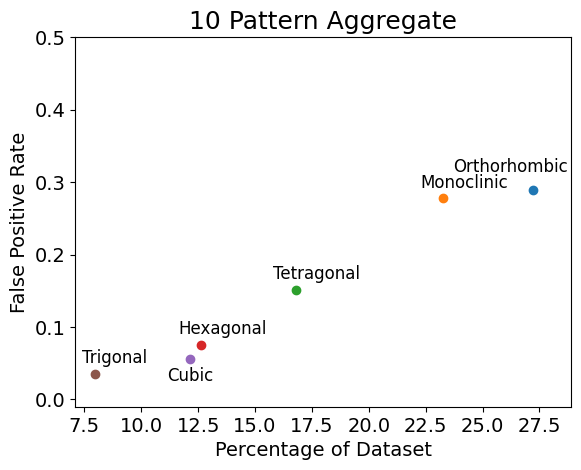

In [8]:
warnings.filterwarnings('ignore')
systems = ['orthorhombic', 'monoclinic', 'tetragonal', 'hexagonal', 'cubic',  'trigonal']
percentages_false_pos = []

for cry_sys in systems:
    predicted_cry_sys = rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System']== cry_sys]
    
    false_positives = rf_diff_obj.condensed_output_df.loc[(rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System'] == cry_sys) & 
                                                                           (rf_diff_obj.condensed_output_df['True Values Crystal System'] != cry_sys)]
    
    false_pos_rate = len(false_positives)/len(predicted_cry_sys)
    print(cry_sys + ' ' + str(false_pos_rate))
    percentages_false_pos.append(false_pos_rate)

vals = np.asarray(rf_diff_obj.condensed_output_df['True Values Crystal System'].value_counts())
vals = vals/sum(vals)
vals = vals*100

plot_set = []
for i in range(0, 6):
    plot_set.append([vals[i], percentages_false_pos[i], systems[i]])
for i in range(len(plot_set)):
    x = plot_set[i][0]
    y = plot_set[i][1]
    z = plot_set[i][2]
    plt.scatter(x, y)
    if z == 'cubic':
        plt.text(x -1, y - 0.03 , z.capitalize(), fontsize=12)
    elif z == 'orthorhombic':
        plt.text(x-3.5, y + 0.025 , z.capitalize(), fontsize=12)
    elif z == 'monoclinic':
        plt.text(x -1, y + 0.015 , z.capitalize(), fontsize=12)
    elif z == 'trigonal':
        plt.text(x-0.6, y + 0.015 , z.capitalize(), fontsize=12)
    else:
        plt.text(x-1, y + 0.015 , z.capitalize(), fontsize=12)
plt.ylabel('False Positive Rate', fontsize = 14)
plt.xlabel('Percentage of Dataset', fontsize = 14)
plt.ylim([-0.01,0.5])
plt.xlim([7.1, 28.9])
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.title('10 Pattern Aggregate', fontsize = 18)
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.savefig('Figures/Figure S3/ag Figure S3.pdf', bbox_inches="tight")
plt.show()

orthorhombic 0.4340318689794378
monoclinic 0.37695942804786126
tetragonal 0.2957109348821624
hexagonal 0.21946600091008597
cubic 0.07671463469710345
trigonal 0.14160559059144368


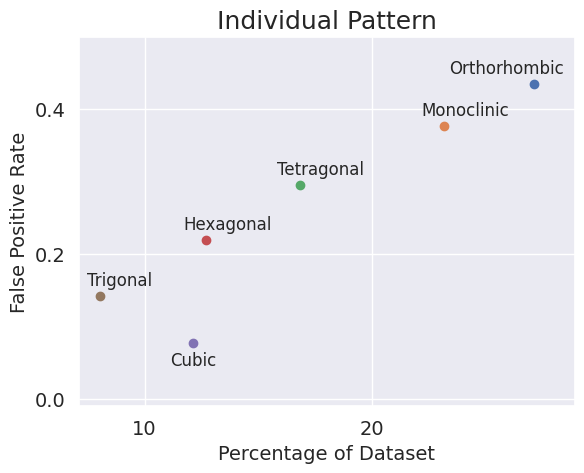

In [11]:
warnings.filterwarnings('ignore')
systems = ['orthorhombic', 'monoclinic', 'tetragonal', 'hexagonal', 'cubic',  'trigonal']
percentages_false_pos = []

for cry_sys in systems:
    predicted_cry_sys = rf_diff_obj.output_df.loc[rf_diff_obj.output_df['Predictions Crystal System']== cry_sys]
    
    false_positives = rf_diff_obj.output_df.loc[(rf_diff_obj.output_df['Predictions Crystal System'] == cry_sys) & 
                                                                           (rf_diff_obj.output_df['True Values Crystal System'] != cry_sys)]
    
    false_pos_rate = len(false_positives)/len(predicted_cry_sys)
    print(cry_sys + ' ' + str(false_pos_rate))
    percentages_false_pos.append(false_pos_rate)

vals = np.asarray(rf_diff_obj.output_df['True Values Crystal System'].value_counts())
vals = vals/sum(vals)
vals = vals*100

plot_set = []
for i in range(0, 6):
    plot_set.append([vals[i], percentages_false_pos[i], systems[i]])
for i in range(len(plot_set)):
    x = plot_set[i][0]
    y = plot_set[i][1]
    z = plot_set[i][2]
    plt.scatter(x, y)
    if z == 'cubic':
        plt.text(x -1, y - 0.03 , z.capitalize(), fontsize=12)
    elif z == 'orthorhombic':
        plt.text(x-3.75, y + 0.015 , z.capitalize(), fontsize=12)
    elif z == 'monoclinic':
        plt.text(x -1, y + 0.015 , z.capitalize(), fontsize=12)
    elif z == 'trigonal':
        plt.text(x-0.6, y + 0.015 , z.capitalize(), fontsize=12)
    else:
        plt.text(x-1, y + 0.015 , z.capitalize(), fontsize=12)
plt.ylabel('False Positive Rate', fontsize = 14)
plt.xlabel('Percentage of Dataset', fontsize = 14)
plt.ylim([-0.01,0.5])
plt.xlim([7.1, 28.9])
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.title('Individual Pattern', fontsize = 18)
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.savefig('Figures/Figure S3/Figure S3.pdf', bbox_inches="tight")
plt.show()

In [27]:

# np.asarray(FINAL_cry_sys_test_df.loc[FINAL_cry_sys_test_df['true_crystal_sys'] == cry_sys][char+'_mode'])
# MAE_acc = np.mean(errors_acc)
# print(MAE_acc)

# print('Innacuracy MAE')
# errors_innac = np.abs(np.asarray(FINAL_cry_sys_test_df.loc[FINAL_cry_sys_test_df['true_crystal_sys'] != cry_sys][char+'_true']) - 
#                       np.asarray(FINAL_cry_sys_test_df.loc[FINAL_cry_sys_test_df['true_crystal_sys'] != cry_sys][char+'_mode']))
# MAE_inacc = np.mean(errors_innac)
# print(MAE_inacc)

# print('All MAE')
# errors_all = np.abs(np.asarray(FINAL_cry_sys_test_df[char+'_true']) -  np.asarray(FINAL_cry_sys_test_df[char+'_mode']))
# MAE_all = np.mean(errors_all)
# print(MAE_all)

Accurate Accuracy
0.8647798742138365
Inaccurate Accuracy
0.0
All Accuracy
0.859375


In [ ]:
# naive aggregation results crystal system - example figure for figures 1 and 2

plt.rcParams['pdf.fonttype'] = 'truetype'
rf_diff_obj.visualize_predictions_by_material(output_df_path = 'Model_data/Crystal_sys_outputs/output_df_radial.joblib',
                                              sample_mat_id = 'mp-1001786', random_inds=None, show_all_materials=False, show_individual=True, 
                                              show_space_group = False, zone = (), savefigure=False, filename = 'Figures/Figure 2/aggregate pred')

In [ ]:
# naive aggregation results - example figure for figure 1

plt.rcParams['pdf.fonttype'] = 'truetype'
rf_diff_obj.visualize_space_group_results_mat_id('trigonal', material_id =  'mp-1001786', show_plots = True, use_scaled = False, savefigure=True, 
                                                filename='Figures/Figure 1/fig1_space_group_example')

In [ ]:
# moved to oop doc

def visualize_lattice_results_individual(cry_sys, output_df, cry_sys_type = 'True Values Crystal System', prediction_type = 'Mean',
                                        show_hists = False, show_r2 = False):
    if cry_sys_type == 'True Values Crystal System':
        col = 'true_cry_sys_full_predictions'
    if cry_sys_type == 'Predictions Crystal System':
        col = 'pred_cry_sys_full_predictions'
    
    medians = []
    
    for char in ['a', 'b', 'c']:
        print(char)
        # print('Accurate MAE')
        if cry_sys == 'orthorhombic':
            # try:
                # ortho_subdf = joblib.load(cry_sys_type[0:4]+'_ortho_lattice_subdf.joblib')
                
            # except FileNotFoundError:
            ortho_subdf = output_df.loc[output_df[cry_sys_type] == cry_sys]
            ortho_subdf = scale_df_lattice(ortho_subdf, 'mat_id')

            joblib.dump(ortho_subdf, cry_sys_type[0:4]+'_ortho_lattice_subdf.joblib')
            
            mean_per_pattern = []
            for i in np.asarray(output_df.loc[output_df[cry_sys_type] == cry_sys][col+'_'+char]):
                if prediction_type == 'Mean':
                    mean_per_pattern.append(np.mean(i))
                if prediction_type == 'Median':
                    mean_per_pattern.append(np.median(i))
            char_ortho = char + '_sorted'
            errors_all = np.abs(np.asarray(ortho_subdf.loc[ortho_subdf[cry_sys_type] == cry_sys][char_ortho]) - mean_per_pattern)
            cry_sys_subdf = ortho_subdf
            
            MAE_all = np.mean(errors_all)

            median_all = np.median(errors_all)
            
            medians.append(median_all)
            
            # print('MAE All ' + str(MAE_all))
            print('Median All ' + str(median_all))
            medians.append(median_all)
            mean_per_pattern_acc = []
            for i in np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys][col+'_'+char]):
                if prediction_type == 'Mean':
                    mean_per_pattern_acc.append(np.mean(i))
                if prediction_type == 'Median':
                    mean_per_pattern_acc.append(np.median(i))

            errors_acc = np.abs(np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys][char_ortho]) - mean_per_pattern_acc)
            MAE_acc = np.mean(errors_acc)
            
            mean_per_pattern_inacc = []
            for i in np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys][col+'_'+char]):
                if prediction_type == 'Mean':
                    mean_per_pattern_inacc.append(np.mean(i))
                if prediction_type == 'Median':
                    mean_per_pattern_inacc.append(np.median(i))

            errors_inacc = np.abs(np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys][char_ortho]) - mean_per_pattern_inacc)
            MAE_inacc = np.mean(errors_inacc)
            # print(MAE_acc)

        else:
            
            cry_sys_subdf = output_df.loc[output_df[cry_sys_type] == cry_sys]
            mean_per_pattern = []
            for i in np.asarray(output_df.loc[output_df[cry_sys_type] == cry_sys][col+'_'+char]):
                if prediction_type == 'Mean':
                    mean_per_pattern.append(np.mean(i))
                if prediction_type == 'Median':
                    mean_per_pattern.append(np.median(i))
                
            errors_all = np.abs(np.asarray(output_df.loc[output_df[cry_sys_type] == cry_sys][char]) - mean_per_pattern)
        
            MAE_all = np.mean(errors_all)

            median_all = np.median(errors_all)
            # print('MAE All ' + str(MAE_all))
            print('Median All ' + str(median_all))
            mean_per_pattern_acc = []
            for i in np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys][col+'_'+char]):
                if prediction_type == 'Mean':
                    mean_per_pattern_acc.append(np.mean(i))
                if prediction_type == 'Median':
                    mean_per_pattern_acc.append(np.median(i))

            errors_acc = np.abs(np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys][char]) - mean_per_pattern_acc)
            MAE_acc = np.mean(errors_acc)
            
            mean_per_pattern_inacc = []
            for i in np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys][col+'_'+char]):
                if prediction_type == 'Mean':
                    mean_per_pattern_inacc.append(np.mean(i))
                if prediction_type == 'Median':
                    mean_per_pattern_inacc.append(np.median(i))

            errors_inacc = np.abs(np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys][char]) - mean_per_pattern_inacc)
            MAE_inacc = np.mean(errors_inacc)
        # print(MAE_inacc)
            # print(MAE_acc)
        
        medians.append(median_all)

        median_acc = np.median(errors_acc)
        # print('MAE Accurate ' + str(MAE_acc))
        # print('Median Accurate ' + str(median_acc))        



        median_inacc = np.median(errors_inacc)
        # print('MAE Inaccurate ' + str(MAE_inacc))
        # print('Median Inaccurate ' + str(median_inacc))  
        # print(' ')
        
        if show_r2:
            plt.figure(figsize=(8, 7))
            true_vals = np.asarray(output_df.loc[output_df[cry_sys_type] == cry_sys][char])
            # plt.scatter(true_vals, mean_per_pattern, alpha = 1)
            r2 = r2_score(true_vals, mean_per_pattern)
            print(r2)
            true_val_inacc = np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys][char])
            plt.scatter(true_val_inacc, mean_per_pattern_inacc, alpha = 0.1, label = "Innacurate Crystal System", 
                       color = '#ff7f0e')
            
            true_val_acc = np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys][char])
            plt.scatter(true_val_acc, mean_per_pattern_acc, alpha = 0.1, label = 'True Crystal System',
                       color = '#1f77b4')


            plt.plot(np.linspace(min(true_vals), max(true_vals), 100), np.linspace(min(true_vals), max(true_vals), 100), linestyle = '--', color = 'k')
            plt.yticks(fontsize=20)
            plt.xticks(fontsize = 20)   
            plt.xlabel('True', fontsize = 30)
            plt.ylabel('Prediction', fontsize = 30)
            plt.legend(fontsize = 18)

            # plt.savefig('Figures/Figure S6/R2_plot_' + cry_sys + '_' + param + '.pdf', bbox_inches="tight", transparent=True)
            plt.show()        

        if show_hists:
            plt.figure(figsize=(8, 7))
            # hist_all = plt.hist(errors_all, bins = 20, weights=np.ones(len(errors_all)) / len(errors_all))
            hist_acc = plt.hist(errors_acc, bins = 20, weights=np.ones(len(errors_acc)) / len(errors_all), label='Accurate Crystal System')
            hist_innac = plt.hist(errors_inacc, bins = 20, weights=np.ones(len(errors_inacc)) / len(errors_all), label = 'Innacurate Crystal System')

            plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
            # plt.title('Error Histogram', fontsize=18)
            plt.title(prediction_type+' Trees (Per Pattern Case)', fontsize = 32)
            plt.vlines(median_all, max(hist_acc[0]), min(hist_acc[0]), color='k', linewidth=5, label='Median')
            plt.vlines(MAE_all, max(hist_acc[0]), min(hist_acc[0]), color='red', linewidth=5, label='MAE')

            plt.text(MAE_all + 0.5*max(errors_all), max(hist_acc[0]) - 0.1 * max(hist_acc[0]), 'MAE = ' + str(round(MAE_all, 2)),
                     horizontalalignment='center', fontsize=32)
            plt.text(median_all + 0.5*max(errors_all), max(hist_acc[0]) - 0.2 * max(hist_acc[0]), 'Median Error = ' + str(round(median_all, 2)),
                     horizontalalignment='center', fontsize=32)

            plt.yticks(fontsize=24)
            plt.xticks(fontsize = 24)


            
            # plt.xlim([0,4])
            plt.legend(fontsize = 17, loc='lower right')
            if char == 'c' or char=='c_sorted':
                plt.xlabel('Absolute Error (Angstroms)', fontsize=32)
            if cry_sys == 'cubic':
                plt.ylabel('Frequency', fontsize=42)
            # plt.savefig('Figures/Figure S5/MAE_plot_' + cry_sys + '_' + char + '.pdf', bbox_inches="tight", transparent=True)
            plt.show()
        
    return medians
        

In [ ]:
# moved to oop doc
def add_lattice_results_to_output_df(df):
    new_rows = []
    for i in range(0, len(df)):
        new_rows.append(None)
    df['pred_cry_sys_full_predictions_a'] = new_rows
    df['pred_cry_sys_full_predictions_b'] = new_rows
    df['pred_cry_sys_full_predictions_c'] = new_rows

    df['true_cry_sys_full_predictions_a'] = new_rows
    df['true_cry_sys_full_predictions_b'] = new_rows
    df['true_cry_sys_full_predictions_c'] = new_rows
    
    print('df ready')
    
    for cry_sys in ['trigonal', 'hexagonal', 'monoclinic', 'orthorhombic', 'tetragonal', 'cubic']:        
        print(cry_sys)
        rf_model = joblib.load('Model_data/Lattice_inputs_and_outputs/' +cry_sys+'_lattice_model.joblib')[2]
        print('model loaded')
        trees = rf_model.estimators_
        # for k in range(0, len(df)):
        for k in range(0, len(df)):
            row = df.iloc[k]
            if row['Predictions Crystal System'] == cry_sys:
                cry_sys_vals = np.asarray(row.radial_200_ang_Colin_basis) 
                input_train_temp = flatten(cry_sys_vals)

                
                abs_i = np.abs(input_train_temp)
                angle_i = np.angle(input_train_temp)
                        # print(temp)
                input_train = []
                for i in range(0, len(abs_i)):
                    input_train.append(abs_i[i])
                    input_train.append(angle_i[i])

                cry_sys_use = np.asarray(input_train).reshape(1, -1)
                # print(cry_sys_use)
                predictions_full = []
                for tree in trees:
                    predictions_full.append(tree.predict(cry_sys_use))

                predictions_ordered = np.asarray(predictions_full).T
                # print(predictions_ordered[0])
                df.at[k, 'pred_cry_sys_full_predictions_a'] = predictions_ordered[0][0]
                df.at[k, 'pred_cry_sys_full_predictions_b'] = predictions_ordered[1][0]
                df.at[k, 'pred_cry_sys_full_predictions_c'] = predictions_ordered[2][0]
                
            if row['True Values Crystal System'] == cry_sys:
                cry_sys_vals = np.asarray(row.radial_200_ang_Colin_basis) 
                input_train_temp = flatten(cry_sys_vals)

                
                abs_i = np.abs(input_train_temp)
                angle_i = np.angle(input_train_temp)
                        # print(temp)
                input_train = []
                for i in range(0, len(abs_i)):
                    input_train.append(abs_i[i])
                    input_train.append(angle_i[i])

                cry_sys_use = np.asarray(input_train).reshape(1, -1)
                # print(cry_sys_use)
                predictions_full = []
                for tree in trees:
                    predictions_full.append(tree.predict(cry_sys_use))

                predictions_ordered = np.asarray(predictions_full).T
                # print(predictions_ordered[0])
                df.at[k, 'true_cry_sys_full_predictions_a'] = predictions_ordered[0][0]
                df.at[k, 'true_cry_sys_full_predictions_b'] = predictions_ordered[1][0]
                df.at[k, 'true_cry_sys_full_predictions_c'] = predictions_ordered[2][0]


    return df

In [ ]:
def show_individual_sg_predictions(df, cry_sys):
    rf_diff_obj.loaded_submodels = [False, '']
    warnings.filterwarnings('ignore')
    print(cry_sys)
    true_cry_sys = df.loc[df['True Values Crystal System']== cry_sys]
    true_cry_sys_indicies = true_cry_sys.index
    test_cry_sys_correct_predictions = df.loc[(df['Predictions Crystal System'] == cry_sys) & 
                                                                           (df['True Values Crystal System'] == cry_sys)]
    correct_cry_sys_indicies = test_cry_sys_correct_predictions.index
    test_set_cry_sys_mispredictions = df.loc[(df['Predictions Crystal System'] == cry_sys) & 
                                                                        (df['True Values Crystal System'] != cry_sys)]
    wrong_cry_sys_prediction_indicies= test_set_cry_sys_mispredictions.index


    universal_cry_sys_test_indicies = []
    for index in correct_cry_sys_indicies:
        universal_cry_sys_test_indicies.append(index)
    # print(len(universal_cry_sys_test_indicies))

    # for i in integers_to_use:
        # universal_cry_sys_test_ids.append(wrong_cry_sys_prediction_ids[i])

    try: 
        # print('trying')
        with open('Model_data/Space_group_inputs_and_outputs/individual_SG_'+cry_sys+'_cry_sys_test_df.pkl', 'rb') as f:
            cry_sys_test_df = pickle.load(f)
        # print('loaded successfully')        

    except:
        for index in wrong_cry_sys_prediction_indicies:
            universal_cry_sys_test_indicies.append(index)

        cry_sys_test_df = pd.DataFrame(columns = df.columns)
        cry_sys_test_df = df.iloc[universal_cry_sys_test_indicies]

        cry_sys_test_df.to_pickle('Model_data/Space_group_inputs_and_outputs/individual_SG_'+cry_sys+'_cry_sys_test_df.pkl')



    cry_sys_vals = np.asarray(cry_sys_test_df.radial_200_ang_Colin_basis) 

    input_train_temp = []
    for unit in cry_sys_vals:
        input_train_temp.append(flatten(unit))

    input_train = []
    for row in input_train_temp:
        temp = []
        abs_i = np.abs(row)
        angle_i = np.angle(row)
        for i in range(0, len(abs_i)):
            temp.append(abs_i[i])
            temp.append(angle_i[i])
            # print(temp)
        input_train.append(np.asarray(temp))

    cry_sys_use = input_train
    rf_model = joblib.load('Model_data/Space_group_inputs_and_outputs/' +cry_sys+'_space_group_model.joblib')[2]
    pred_test = rf_model.predict(cry_sys_use)
    trees = rf_model.estimators_
    predictions_full = []
    for tree in trees:
        predictions_full.append(tree.predict(np.asarray(cry_sys_use)))
    predictions_ordered = np.asarray(predictions_full).T

    SG_pred = []

    for prediction in pred_test:
        SG_pred.append(prediction)

    cry_sys_test_df['SG_pred'] = SG_pred
    sg_full_pred = []
    for i in range(0, len(predictions_ordered)):
        prediction_ordered_sg = []
        for j in predictions_ordered[i]:
            prediction_ordered_sg.append(rf_model.classes_[int(j)])
        sg_full_pred.append(prediction_ordered_sg)

    cry_sys_test_df['SG_full_pred'] = sg_full_pred


    print('Accurate Accuracy')
    acc_df = cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] == cry_sys]
    acc_df.reset_index(inplace = True)
    acc_df.drop('index', axis = 1)


    true_count_acc = 0
    for i in range(0, len(acc_df)):
        row = acc_df.iloc[i]
        if row['SG_pred'] == row['True Value Space Group']:
            true_count_acc += 1
    print(true_count_acc/len(acc_df))

    print('Inaccurate Accuracy')
    inacc_df = cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] != cry_sys]
    inacc_df.reset_index(inplace = True)
    inacc_df.drop('index', axis = 1)


    true_count_inacc = 0
    for i in range(0, len(inacc_df)):
        row = inacc_df.iloc[i]
        if row['SG_pred'] == row['True Value Space Group']:
            true_count_inacc += 1
    print(true_count_inacc/len(inacc_df))

    print('All Accuracy')
    print((true_count_inacc + true_count_acc)/len(cry_sys_test_df))
    
    return cry_sys_test_df

In [ ]:
# test train segregation was successful

# output_df_radial = joblib.load('Model_data/Crystal_sys_outputs/output_df_radial.joblib')
# output_df_radial

radial_train_ids = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_0_5.joblib')
radial_test_ids = joblib.load('Model_data/Crystal_sys_inputs/radial_inputs_1_5.joblib')

len(radial_train_ids)

np.arange(0, 2500000, 25000)

count = 0
uni = output_df_radial['mat_id'].unique()
for ids in radial_train_ids:
    if count in np.arange(0, 2500000, 250000):
        print(100*count/len(radial_train_ids))
    if ids in uni:
        print(ids)
    count += 1

In [ ]:
# original output df processing

patterns = []
for i in np.asarray(output_df_radial['Full DF Indicies']):
    patterns.append(rf_diff_obj.full_df.iloc[i]['radial_200_ang_Colin_basis'])
output_df_radial['radial_200_ang_Colin_basis'] = patterns
# joblib.dump(output_df_radial, 'Model_data/Crystal_sys_outputs/output_df_radial.joblib')
# output_df_radial = joblib.load('Model_data/Crystal_sys_outputs/output_df_radial.joblib')
# output_df_radial['True Value Space Group'] = np.asarray(rf_diff_obj.full_df.iloc[np.asarray(output_df_radial['Full DF Indicies'])]['space_group_first'])
# output_df_radial = joblib.load('Model_data/Crystal_sys_outputs/output_df_radial.joblib')
# output_df_radial_temp = update_df_lattice(output_df_radial)
# output_df_radial_temp['b'] = output_df_radial_temp['y']
# output_df_radial_temp['c'] = output_df_radial_temp['z']
# output_df_radial_temp.drop(['ids'], axis = 1, inplace = True)
# joblib.dump(output_df_radial_temp, 'Model_data/Crystal_sys_outputs/output_df_radial.joblib')
# output_df_radial = joblib.load('Model_data/Crystal_sys_outputs/output_df_radial.joblib')
# output_df_radial
# output_df_temp = add_lattice_results_to_output_df(output_df_radial)
# joblib.dump(output_df_temp, 'Model_data/Crystal_sys_outputs/MONO_FIXED_LATTICE_UPDATED_output_df_radial.joblib')
# joblib.load('Model_data/Crystal_sys_outputs/condensed_output_df.joblib')
# output_df_temp = joblib.load('Model_data/Crystal_sys_outputs/Ortho_fixed_MONO_FIXED_LATTICE_UPDATED_output_df_radial.joblib')

In [ ]:
# moved to oop doc

def visualize_lattice_results_aggregate(cry_sys, output_df, cry_sys_type = 'True Values Crystal System', prediction_type = 'Mean',
                                        show_hists = False, show_r2 = False):
    if cry_sys_type == 'True Values Crystal System':
        col = 'true_median'
    if cry_sys_type == 'Aggregate Predictions Crystal System':
        col = 'pred_median'
    
    medians = []
    
    for char in ['a', 'b', 'c']:
        print(char)
        # print('Accurate MAE')
        if cry_sys == 'orthorhombic':
            try:
                ortho_subdf = joblib.load(cry_sys_type[0:4]+'_ortho_lattice_subdf.joblib')
                
            except FileNotFoundError:
                ortho_subdf = output_df.loc[output_df[cry_sys_type] == cry_sys]
                ortho_subdf = output_df.rename(columns={'true_a': 'a', 'true_b': 'b', 'true_c': 'c'})
                ortho_subdf = scale_df_lattice(ortho_subdf, 'mat_id')

                joblib.dump(ortho_subdf, cry_sys_type[0:4]+'_ortho_lattice_subdf.joblib')
            
            mean_per_pattern = []
            for i in np.asarray(output_df.loc[output_df[cry_sys_type] == cry_sys][col+'_'+char]):
                if prediction_type == 'Mean':
                    mean_per_pattern.append(np.mean(i))
                if prediction_type == 'Median':
                    mean_per_pattern.append(np.median(i))
            char_ortho = char + '_sorted'
            errors_all = np.abs(np.asarray(ortho_subdf.loc[ortho_subdf[cry_sys_type] == cry_sys][char_ortho]) - mean_per_pattern)
            cry_sys_subdf = ortho_subdf
            
            MAE_all = np.mean(errors_all)

            median_all = np.median(errors_all)
            
            medians.append(median_all)
            
            # print('MAE All ' + str(MAE_all))
            print('Median All ' + str(median_all))
            medians.append(median_all)
            mean_per_pattern_acc = []
            for i in np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys][col+'_'+char]):
                if prediction_type == 'Mean':
                    mean_per_pattern_acc.append(np.mean(i))
                if prediction_type == 'Median':
                    mean_per_pattern_acc.append(np.median(i))

            errors_acc = np.abs(np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys][char_ortho]) - mean_per_pattern_acc)
            MAE_acc = np.mean(errors_acc)
            
            mean_per_pattern_inacc = []
            for i in np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys][col+'_'+char]):
                if prediction_type == 'Mean':
                    mean_per_pattern_inacc.append(np.mean(i))
                if prediction_type == 'Median':
                    mean_per_pattern_inacc.append(np.median(i))

            errors_inacc = np.abs(np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys][char_ortho]) - mean_per_pattern_inacc)
            MAE_inacc = np.mean(errors_inacc)
            cry_sys_subdf = cry_sys_subdf.rename(columns={'a_sorted': 'true_a', 'b_sorted': 'true_b', 'c_sorted': 'true_c'})
            # print(MAE_acc)

        else:
            
            cry_sys_subdf = output_df.loc[output_df[cry_sys_type] == cry_sys]
            # mean_per_pattern = []
            # for i in np.asarray(output_df.loc[output_df[cry_sys_type] == cry_sys][col+'_'+char]):
                # if prediction_type == 'Mode':
                    # todo finish
            
            if prediction_type == 'Median':
                mean_per_pattern = np.asarray(output_df.loc[output_df[cry_sys_type] == cry_sys][col+'_'+char])
                
            errors_all = np.abs(np.asarray(output_df.loc[output_df[cry_sys_type] == cry_sys]['true_'+char]) - mean_per_pattern)
        
            MAE_all = np.mean(errors_all)

            median_all = np.median(errors_all)
            # print('MAE All ' + str(MAE_all))
            print('Median All ' + str(median_all))
            mean_per_pattern_acc = np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys][col+'_'+char])
            # mean_per_pattern_acc = []
            # for i in np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys][col+'_'+char]):
                # if prediction_type == 'Mean':
                #     mean_per_pattern_acc.append(np.mean(i))
                # if prediction_type == 'Median':
                #     mean_per_pattern_acc.append(np.median(i))

            errors_acc = np.abs(np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys]['true_'+char]) 
                                - mean_per_pattern_acc)
            MAE_acc = np.mean(errors_acc)
            
            mean_per_pattern_inacc = np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys][col+'_'+char])
            # mean_per_pattern_inacc = []
            # for i in np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys][col+'_'+char]):
            #     if prediction_type == 'Mean':
            #         mean_per_pattern_inacc.append(np.mean(i))
            #     if prediction_type == 'Median':
            #         mean_per_pattern_inacc.append(np.median(i))

            errors_inacc = np.abs(np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys]['true_'+char]) 
                                  - mean_per_pattern_inacc)
            MAE_inacc = np.mean(errors_inacc)
        # print(MAE_inacc)
            # print(MAE_acc)
        
        medians.append(median_all)

        median_acc = np.median(errors_acc)
        # print('MAE Accurate ' + str(MAE_acc))
        # print('Median Accurate ' + str(median_acc))        



        median_inacc = np.median(errors_inacc)
        # print('MAE Inaccurate ' + str(MAE_inacc))
        # print('Median Inaccurate ' + str(median_inacc))  
        # print(' ')
        
        if show_r2:
            plt.figure(figsize=(8, 7))
            true_vals = np.asarray(output_df.loc[output_df[cry_sys_type] == cry_sys]['true_'+char])
            # plt.scatter(true_vals, mean_per_pattern, alpha = 1)
            r2 = r2_score(true_vals, mean_per_pattern)
            print(r2)
            true_val_inacc = np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] != cry_sys]['true_'+char])
            plt.scatter(true_val_inacc, mean_per_pattern_inacc, alpha = 0.33, label = "Innacurate Crystal System", 
                       color = '#ff7f0e')
            
            true_val_acc = np.asarray(cry_sys_subdf.loc[cry_sys_subdf['True Values Crystal System'] == cry_sys]['true_'+char])
            plt.scatter(true_val_acc, mean_per_pattern_acc, alpha = 0.33, label = 'True Crystal System',
                       color = '#1f77b4')


            plt.plot(np.linspace(min(true_vals), max(true_vals), 100), np.linspace(min(true_vals), max(true_vals), 100), linestyle = '--', color = 'k')
            plt.yticks(fontsize=20)
            plt.xticks(fontsize = 20)   
            plt.xlabel('True', fontsize = 30)
            plt.ylabel('Prediction', fontsize = 30)
            plt.legend(fontsize = 18)

            # plt.savefig('Figures/Figure S6/R2_plot_' + cry_sys + '_' + param + '.pdf', bbox_inches="tight", transparent=True)
            plt.show()        

        if show_hists:
            plt.figure(figsize=(8, 7))
            # hist_all = plt.hist(errors_all, bins = 20, weights=np.ones(len(errors_all)) / len(errors_all))
            hist_acc = plt.hist(errors_acc, bins = 20, weights=np.ones(len(errors_acc)) / len(errors_all), label='Accurate Crystal System')
            hist_innac = plt.hist(errors_inacc, bins = 20, weights=np.ones(len(errors_inacc)) / len(errors_all), label = 'Innacurate Crystal System')

            plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
            # plt.title('Error Histogram', fontsize=18)
            plt.title(prediction_type+' Trees (Per Pattern Case)', fontsize = 32)
            plt.vlines(median_all, max(hist_acc[0]), min(hist_acc[0]), color='k', linewidth=5, label='Median')
            plt.vlines(MAE_all, max(hist_acc[0]), min(hist_acc[0]), color='red', linewidth=5, label='MAE')

            plt.text(MAE_all + 0.5*max(errors_all), max(hist_acc[0]) - 0.1 * max(hist_acc[0]), 'MAE = ' + str(round(MAE_all, 2)),
                     horizontalalignment='center', fontsize=32)
            plt.text(median_all + 0.5*max(errors_all), max(hist_acc[0]) - 0.2 * max(hist_acc[0]), 'Median Error = ' + str(round(median_all, 2)),
                     horizontalalignment='center', fontsize=32)

            plt.yticks(fontsize=24)
            plt.xticks(fontsize = 24)


            
            # plt.xlim([0,4])
            plt.legend(fontsize = 17, loc='lower right')
            if char == 'c' or char=='c_sorted':
                plt.xlabel('Absolute Error (Angstroms)', fontsize=32)
            if cry_sys == 'cubic':
                plt.ylabel('Frequency', fontsize=42)
            # plt.savefig('Figures/Figure S5/MAE_plot_' + cry_sys + '_' + char + '.pdf', bbox_inches="tight", transparent=True)
            plt.show()
        
    return cry_sys_subdf
        

In [ ]:
# added to oop doc

def add_full_pred_median(condensed_df):
    for col in ['pred_cry_sys_full_predictions_a',
                'pred_cry_sys_full_predictions_b',	
                'pred_cry_sys_full_predictions_c',	
                'true_cry_sys_full_predictions_a',	
                'true_cry_sys_full_predictions_b',	
                'true_cry_sys_full_predictions_c']:
        print(col)
        full_pred_median = []
        ag_medians = []
        for i in range(0, len(condensed_df)):
            row = condensed_df.iloc[i]
            full_medians = []
            for full_pred in row[col]:
                full_medians.append(np.median(full_pred))
            full_pred_median.append(full_medians)
            
        for medians in full_pred_median:
            ag_medians.append(np.median(medians))
        condensed_df[col[0:4]+'_median_'+col[len(col)-1]] = ag_medians
        condensed_df['full_'+col[0:4]+'_median_'+col[len(col)-1]] = full_pred_median
    return condensed_df
        

In [ ]:
# added to oop doc

def add_lattice_data_to_condensed_df(df, output_df):
    new_rows = []
    for i in range(0, len(df)):
        new_rows.append(None)
    df['pred_cry_sys_full_predictions_a'] = new_rows
    df['pred_cry_sys_full_predictions_b'] = new_rows
    df['pred_cry_sys_full_predictions_c'] = new_rows

    df['true_cry_sys_full_predictions_a'] = new_rows
    df['true_cry_sys_full_predictions_b'] = new_rows
    df['true_cry_sys_full_predictions_c'] = new_rows
    
    print('df ready')
    
    for cry_sys in ['trigonal', 'hexagonal', 'monoclinic', 'orthorhombic', 'tetragonal', 'cubic']:        
        print(cry_sys)
        rf_model = joblib.load('Model_data/Lattice_inputs_and_outputs/' +cry_sys+'_lattice_model.joblib')[2]
        print('model loaded')
        trees = rf_model.estimators_
        # for k in range(0, len(df)):
        for k in range(0, len(df)):
            row = df.iloc[k]
            if row['Aggregate Predictions Crystal System'] == cry_sys:
                full_df_vals = row['Full Df Indicies']
                subdf = output_df.loc[output_df['Full DF Indicies'].isin(full_df_vals)]                
                
                cry_sys_vals = np.asarray(subdf.radial_200_ang_Colin_basis) 
                input_train_temp = []
                for unit in cry_sys_vals:
                    input_train_temp.append(flatten(unit))

                input_train = []
                for line in input_train_temp:
                    temp = []
                    abs_i = np.abs(line)
                    angle_i = np.angle(line)
                    for i in range(0, len(abs_i)):
                        temp.append(abs_i[i])
                        temp.append(angle_i[i])
                        # print(temp)
                    input_train.append(np.asarray(temp))

                cry_sys_use = input_train

                # print(cry_sys_use)
                predictions_full = []
                for tree in trees:
                    predictions_full.append(tree.predict(cry_sys_use))

                predictions_ordered = np.asarray(predictions_full).T
                
                # return predictions_ordered
                # print(predictions_ordered[0])
                df.at[k, 'pred_cry_sys_full_predictions_a'] = predictions_ordered[0]
                df.at[k, 'pred_cry_sys_full_predictions_b'] = predictions_ordered[1]
                df.at[k, 'pred_cry_sys_full_predictions_c'] = predictions_ordered[2]

            if row['True Values Crystal System'] == cry_sys:
                cry_sys_vals = np.asarray(subdf.radial_200_ang_Colin_basis) 
                input_train_temp = []
                for unit in cry_sys_vals:
                    input_train_temp.append(flatten(unit))

                input_train = []
                for line in input_train_temp:
                    temp = []
                    abs_i = np.abs(line)
                    angle_i = np.angle(line)
                    for i in range(0, len(abs_i)):
                        temp.append(abs_i[i])
                        temp.append(angle_i[i])
                        # print(temp)
                    input_train.append(np.asarray(temp))

                cry_sys_use = input_train
                # print(cry_sys_use)
                predictions_full = []
                for tree in trees:
                    predictions_full.append(tree.predict(cry_sys_use))

                predictions_ordered = np.asarray(predictions_full).T
                # print(predictions_ordered[0])
                df.at[k, 'true_cry_sys_full_predictions_a'] = predictions_ordered[0]
                df.at[k, 'true_cry_sys_full_predictions_b'] = predictions_ordered[1]
                df.at[k, 'true_cry_sys_full_predictions_c'] = predictions_ordered[2]


    return df

In [ ]:
# misc code from adding lattice data to condensed df

# test = add_lattice_data_to_condensed_df(rf_diff_obj.condensed_df, output_df_temp)
# joblib.dump(test, 'Model_data/Crystal_sys_outputs/difference_aggregation_condensed_df.joblib')
# test.iloc[14]['pred_cry_sys_full_predictions_c'][0]
# test.iloc[14]
# output_df_temp.iloc[1414]['pred_cry_sys_full_predictions_c']
# output_df_temp.iloc[1414]
# output_df_temp.iloc[101]['true_cry_sys_full_predictions_b']

In [ ]:
# OLD OLD OLD full pipeline lattice param per pattern

rf_diff_obj.loaded_submodels = [False, '']
warnings.filterwarnings('ignore')
# for cry_sys in ['trigonal', 'hexagonal', 'monoclinic', 'orthorhombic', 'tetragonal', 'cubic']:
for cry_sys in ['tetragonal']:
    print(cry_sys)
    true_cry_sys = output_df_radial.loc[output_df_radial['True Values Crystal System']== cry_sys]
    true_cry_sys_indicies = true_cry_sys.index
    test_cry_sys_correct_predictions = output_df_radial.loc[(output_df_radial['Predictions Crystal System'] == cry_sys) & 
                                                                           (output_df_radial['True Values Crystal System'] == cry_sys)]
    correct_cry_sys_indicies = test_cry_sys_correct_predictions.index
    test_set_cry_sys_mispredictions = output_df_radial.loc[(output_df_radial['Predictions Crystal System'] == cry_sys) & 
                                                                        (output_df_radial['True Values Crystal System'] != cry_sys)]
    wrong_cry_sys_prediction_indicies= test_set_cry_sys_mispredictions.index
    

    universal_cry_sys_test_indicies = []
    for index in correct_cry_sys_indicies:
        universal_cry_sys_test_indicies.append(index)
    # for i in integers_to_use:
        # universal_cry_sys_test_ids.append(wrong_cry_sys_prediction_ids[i])

    try: 
        # print('trying')
        with open('Model_data/Lattice_inputs_and_outputs/individual_lattice_'+cry_sys+'_cry_sys_test_df.pkl', 'rb') as f:
            cry_sys_test_df = pickle.load(f)
        # print('loaded successfully')        

    except:
        for index in wrong_cry_sys_prediction_indicies:
            universal_cry_sys_test_indicies.append(index)

        cry_sys_test_df = pd.DataFrame(columns = output_df_radial.columns)
        cry_sys_test_df = output_df_radial.iloc[universal_cry_sys_test_indicies]

        cry_sys_test_df.to_pickle('Model_data/Lattice_inputs_and_outputs/individual_lattice_'+cry_sys+'_cry_sys_test_df.pkl')
        
        
    cry_sys_vals = np.asarray(cry_sys_test_df.radial_200_ang_Colin_basis) 

    input_train_temp = []
    for unit in cry_sys_vals:
        input_train_temp.append(flatten(unit))

    input_train = []
    for row in input_train_temp:
        temp = []
        abs_i = np.abs(row)
        angle_i = np.angle(row)
        for i in range(0, len(abs_i)):
            temp.append(abs_i[i])
            temp.append(angle_i[i])
            # print(temp)
        input_train.append(np.asarray(temp))

    cry_sys_use = input_train
    rf_model = joblib.load('Model_data/Lattice_inputs_and_outputs/' +cry_sys+'_lattice_model.joblib')[2]
    pred_test = rf_model.predict(cry_sys_use)
    trees = rf_model.estimators_
    predictions_full = []
    for tree in trees:
        predictions_full.append(tree.predict(np.asarray(cry_sys_use)))
    predictions_ordered = np.asarray(predictions_full).T

    
    a_pred = []
    b_pred = []
    c_pred = []
    a_full_pred = []
    b_full_pred = []
    c_full_pred = []
    
    # alpha_pred =[]
    # beta_pred = []
    # gamma_pred = []
    for prediction in pred_test:
        a_pred.append(prediction[0])
        b_pred.append(prediction[1])
        c_pred.append(prediction[2])
        # alpha_pred.append(prediction[3])
        # beta_pred.append(prediction[4])
        # gamma_pred.append(prediction[5])
        
    cry_sys_test_df['a_pred'] = a_pred
    cry_sys_test_df['b_pred'] = b_pred
    cry_sys_test_df['c_pred'] = c_pred
    
    for a_list in predictions_ordered[0]:
        a_full_pred.append(a_list)
        
    for b_list in predictions_ordered[1]:
        b_full_pred.append(b_list)
        
    for c_list in predictions_ordered[2]:
        c_full_pred.append(c_list)
    
    cry_sys_test_df['a_full_pred'] = a_full_pred
    cry_sys_test_df['b_full_pred'] = b_full_pred
    cry_sys_test_df['c_full_pred'] = c_full_pred
    # cry_sys_test_df['alpha_pred'] = alpha_pred
    # cry_sys_test_df['beta_pred'] = beta_pred
    # cry_sys_test_df['gamma_pred'] = gamma_pred



    cry_sys_test_df['ids'] = np.asarray(cry_sys_test_df['mat_id'])
    for char in ['a', 'b', 'c']:
        
        print('Accurate MAE')
        if cry_sys == 'orthorhombic':
            ortho_subdf_acc = cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] == cry_sys]
            ortho_subdf_acc = ortho_subdf_acc.rename
            ortho_subdf_acc = scale_df_lattice(ortho_subdf_acc)
            errors_acc = np.abs(np.asarray(ortho_subdf_acc[char+'_sorted']) - 
                            np.asarray(ortho_subdf_acc[char+'_pred']))
        
        else:
            errors_acc = np.abs(np.asarray(cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] == cry_sys][char]) - 
                            np.asarray(cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] == cry_sys][char+'_pred']))
        MAE_acc = np.mean(errors_acc)
        print(MAE_acc)
        
        print('Innacuracy MAE')
        if cry_sys == 'orthorhombic':
            ortho_subdf_inacc = cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] != cry_sys]
            ortho_subdf_inacc = ortho_subdf_inacc.rename(columns={'a': 'x', 'b': 'y', 'c': 'z'})
            ortho_subdf_inacc = scale_df_lattice(ortho_subdf_inacc)
            errors_innac = np.abs(np.asarray(ortho_subdf_inacc[char+'_sorted']) - 
                            np.asarray(ortho_subdf_inacc[char+'_pred']))
        
        else:
            errors_innac = np.abs(np.asarray(cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] != cry_sys][char]) - 
                            np.asarray(cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] != cry_sys][char+'_pred']))
        

        MAE_inacc = np.mean(errors_innac)
        print(MAE_inacc)
        
        print('All MAE')
        if cry_sys == 'orthorhombic':
            cry_sys_test_df = cry_sys_test_df.rename(columns={'a': 'x', 'b': 'y', 'c': 'z'})
            cry_sys_test_df = scale_df_lattice(cry_sys_test_df)
            errors_all = np.abs(np.asarray(cry_sys_test_df[char+'_sorted']) -  np.asarray(cry_sys_test_df[char+'_pred']))
        else:
            errors_all = np.abs(np.asarray(cry_sys_test_df[char]) -  np.asarray(cry_sys_test_df[char+'_pred']))

        MAE_all = np.mean(errors_all)
        print(MAE_all)
        
        print('All Median')
        median = np.median(errors_all)
        print(median)
        
        
        plt.figure(figsize=(8, 7))
        hist_acc = plt.hist(errors_acc, bins = 20, weights=np.ones(len(errors_acc)) / len(errors_all), label='Accurate Crystal System')
        hist_innac = plt.hist(errors_innac, bins = 20, weights=np.ones(len(errors_innac)) / len(errors_all), label = 'Innacurate Crystal System')

        plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
        # plt.title('Error Histogram', fontsize=18)
        plt.vlines(median, max(hist_acc[0]), min(hist_acc[0]), color='k', linewidth=5, label='Median')
        plt.vlines(MAE_all, max(hist_acc[0]), min(hist_acc[0]), color='red', linewidth=5, label='MAE')

        plt.text(MAE_all + 0.5*max(errors_all), max(hist_acc[0]) - 0.1 * max(hist_acc[0]), 'MAE all = ' + str(round(MAE_all, 2)),
                 horizontalalignment='center', fontsize=32)
        plt.text(median + 0.5*max(errors_all), max(hist_acc[0]) - 0.2 * max(hist_acc[0]), 'Median all = ' + str(round(median, 2)),
                 horizontalalignment='center', fontsize=32)
        
        plt.yticks(fontsize=24)
        plt.xticks(fontsize = 24)
        plt.legend(fontsize = 17, loc='lower right')
        if char == 'c' or char=='c_sorted':
            plt.xlabel('Absolute Error (Angstroms)', fontsize=32)
        if cry_sys == 'cubic':
            plt.ylabel('Frequency', fontsize=42)
        # plt.savefig('Figures/Figure S5/MAE_plot_' + cry_sys + '_' + char + '.pdf', bbox_inches="tight", transparent=True)
        plt.show()
        


In [ ]:
# OLD OLD OLD labeled crystal system lattice param per pattern


rf_diff_obj.loaded_submodels = [False, '']
warnings.filterwarnings('ignore')
# for cry_sys in ['orthorhombic', 'trigonal', 'hexagonal', 'monoclinic', 'tetragonal', 'cubic']:
for cry_sys in ['trigonal']:
    print(cry_sys)
    true_cry_sys = output_df_radial.loc[output_df_radial['True Values Crystal System']== cry_sys]    
    
    cry_sys_test_df = true_cry_sys
   
    cry_sys_vals = np.asarray(cry_sys_test_df.radial_200_ang_Colin_basis) 

    input_train_temp = []
    for unit in cry_sys_vals:
        input_train_temp.append(flatten(unit))

    input_train = []
    for row in input_train_temp:
        temp = []
        abs_i = np.abs(row)
        angle_i = np.angle(row)
        for i in range(0, len(abs_i)):
            temp.append(abs_i[i])
            temp.append(angle_i[i])
            # print(temp)
        input_train.append(np.asarray(temp))

    cry_sys_use = input_train
    rf_model = joblib.load('Model_data/Lattice_inputs_and_outputs/' +cry_sys+'_lattice_model.joblib')[2]
    pred_test = rf_model.predict(cry_sys_use)
    trees = rf_model.estimators_
    predictions_full = []
    for tree in trees:
        predictions_full.append(tree.predict(np.asarray(cry_sys_use)))
    predictions_ordered = np.asarray(predictions_full).T

    
    a_pred = []
    b_pred = []
    c_pred = []
    a_full_pred = []
    b_full_pred = []
    c_full_pred = []
    
    # alpha_pred =[]
    # beta_pred = []
    # gamma_pred = []
    for prediction in pred_test:
        a_pred.append(prediction[0])
        b_pred.append(prediction[1])
        c_pred.append(prediction[2])
        # alpha_pred.append(prediction[3])
        # beta_pred.append(prediction[4])
        # gamma_pred.append(prediction[5])
        
    cry_sys_test_df['a_pred'] = a_pred
    cry_sys_test_df['b_pred'] = b_pred
    cry_sys_test_df['c_pred'] = c_pred
    
    for a_list in predictions_ordered[0]:
        a_full_pred.append(a_list)
        
    for b_list in predictions_ordered[1]:
        b_full_pred.append(b_list)
        
    for c_list in predictions_ordered[2]:
        c_full_pred.append(c_list)
    
    cry_sys_test_df['a_full_pred'] = a_full_pred
    cry_sys_test_df['b_full_pred'] = b_full_pred
    cry_sys_test_df['c_full_pred'] = c_full_pred
    # cry_sys_test_df['alpha_pred'] = alpha_pred
    # cry_sys_test_df['beta_pred'] = beta_pred
    # cry_sys_test_df['gamma_pred'] = gamma_pred


    cry_sys_test_df['ids'] = np.asarray(cry_sys_test_df['mat_id'])
    for char in ['a', 'b', 'c']:
        
        print('Accurate MAE')
        if cry_sys == 'orthorhombic':
            ortho_subdf_acc = cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] == cry_sys]
            ortho_subdf_acc = ortho_subdf_acc.rename(columns={'a': 'x', 'b': 'y', 'c': 'z'})
            ortho_subdf_acc = scale_df_lattice(ortho_subdf_acc)
            errors_acc = np.abs(np.asarray(ortho_subdf_acc[char+'_sorted']) - 
                            np.asarray(ortho_subdf_acc[char+'_pred']))
        
        else:
            errors_acc = np.abs(np.asarray(cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] == cry_sys][char]) - 
                            np.asarray(cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] == cry_sys][char+'_pred']))
        MAE_acc = np.mean(errors_acc)
        print(MAE_acc)
        
        print('Innacuracy MAE')
        if cry_sys == 'orthorhombic':
            ortho_subdf_inacc = cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] != cry_sys]
            ortho_subdf_inacc = ortho_subdf_inacc.rename(columns={'a': 'x', 'b': 'y', 'c': 'z'})
            ortho_subdf_inacc = scale_df_lattice(ortho_subdf_inacc)
            errors_innac = np.abs(np.asarray(ortho_subdf_inacc[char+'_sorted']) - 
                            np.asarray(ortho_subdf_inacc[char+'_pred']))
        
        else:
            errors_innac = np.abs(np.asarray(cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] != cry_sys][char]) - 
                            np.asarray(cry_sys_test_df.loc[cry_sys_test_df['True Values Crystal System'] != cry_sys][char+'_pred']))
        

        MAE_inacc = np.mean(errors_innac)
        print(MAE_inacc)
        
        print('All MAE')
        if cry_sys == 'orthorhombic':
            cry_sys_test_df = cry_sys_test_df.rename(columns={'a': 'x', 'b': 'y', 'c': 'z'})
            cry_sys_test_df = scale_df_lattice(cry_sys_test_df)
            errors_all = np.abs(np.asarray(cry_sys_test_df[char+'_sorted']) -  np.asarray(cry_sys_test_df[char+'_pred']))
        else:
            errors_all = np.abs(np.asarray(cry_sys_test_df[char]) -  np.asarray(cry_sys_test_df[char+'_pred']))

        MAE_all = np.mean(errors_all)
        print(MAE_all)
        
        print('All Median')
        median = np.median(errors_all)
        print(median)
        
        
        plt.figure(figsize=(8, 7))
        hist_acc = plt.hist(errors_acc, bins = 20, weights=np.ones(len(errors_acc)) / len(errors_all), label='Accurate Crystal System')
        hist_innac = plt.hist(errors_innac, bins = 20, weights=np.ones(len(errors_innac)) / len(errors_all), label = 'Innacurate Crystal System')

        plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
        # plt.title('Error Histogram', fontsize=18)
        plt.vlines(median, max(hist_acc[0]), min(hist_acc[0]), color='k', linewidth=5, label='Median')
        plt.vlines(MAE_all, max(hist_acc[0]), min(hist_acc[0]), color='red', linewidth=5, label='MAE')

        plt.text(MAE_all + 0.5*max(errors_all), max(hist_acc[0]) - 0.1 * max(hist_acc[0]), 'MAE all = ' + str(round(MAE_all, 2)),
                 horizontalalignment='center', fontsize=32)
        plt.text(median + 0.5*max(errors_all), max(hist_acc[0]) - 0.2 * max(hist_acc[0]), 'Median all = ' + str(round(median, 2)),
                 horizontalalignment='center', fontsize=32)
        
        plt.yticks(fontsize=24)
        plt.xticks(fontsize = 24)
        plt.legend(fontsize = 17, loc='lower right')
        if char == 'c' or char=='c_sorted':
            plt.xlabel('Absolute Error (Angstroms)', fontsize=32)
        if cry_sys == 'cubic':
            plt.ylabel('Frequency', fontsize=42)
        # plt.savefig('Figures/Figure S5/MAE_plot_' + cry_sys + '_' + char + '.pdf', bbox_inches="tight", transparent=True)
        plt.show()
        


In [ ]:
rf_diff_obj.loaded_submodels = [False, '']
crystal_sys_alph = ['cubic', 'hexagonal', 'monoclinic', 'tetragonal', 'trigonal', 'orthorhombic']
# crystal_sys_alph = ['trigonal']
maes = {}
medians = {}
for cry_sys in crystal_sys_alph:
    """
    mae_list = []
    median_list = []
    if cry_sys == 'orthorhombic':
        params = ['a_sorted', 'b_sorted', 'c_sorted']
        rf_diff_obj.visualize_lattice_results_mat_id(cry_sys, material_id = 'all', show_plots = False, use_scaled = True)
    else:
        params = ['a', 'b', 'c']
        rf_diff_obj.visualize_lattice_results_mat_id(cry_sys, material_id = 'all', show_plots = False, use_scaled = False)
    for param in params:
        print(param + ' R2')
        fig = plt.figure(figsize=(8, 7))
        less_10_true = []
        less_10_pred = []
        greater_10_true = []
        greater_10_pred = []
        
        for i in range(0, len(rf_diff_obj.full_out_df)):
            true_param = rf_diff_obj.full_out_df.iloc[i][param+'_true']
            pred_param = rf_diff_obj.full_out_df.iloc[i][param+'_mode']
            if true_param <= 10:
                less_10_true.append(true_param)
                less_10_pred.append(pred_param)
            if true_param > 10:
                greater_10_true.append(true_param)
                greater_10_pred.append(pred_param)        
                
        min_min = min([min(less_10_true), min(less_10_pred)])
        max_min = max([max(less_10_true), max(less_10_pred)])
        max_max = max([max(np.asarray(rf_diff_obj.full_out_df[param+'_true'])), max(np.asarray(rf_diff_obj.full_out_df[param+'_mode']))])
        
        # plt.scatter(np.asarray(rf_diff_obj.full_out_df[param+'_true']), np.asarray(rf_diff_obj.full_out_df[param+'_mode']))
        # r2 = r2(np.asarray(rf_diff_obj.full_out_df[param+'_true']), np.asarray(rf_diff_obj.full_out_df[param+'_mode']))
        # plt.plot(np.linspace(min_min, max_max, 100), np.linspace(min_min, max_max, 100), linestyle = '--', color = 'k')
        # if param == 'c' or param=='c_sorted':
        #     plt.xlabel('True c (Angstroms)', fontsize=32)
        # if cry_sys == 'cubic':
         #    plt.ylabel('Predicted ' + param + ' (Angstroms)', fontsize=32)
        # plt.yticks(fontsize=32)
        # plt.xticks(fontsize = 32)
        less_10_r2 = r2(less_10_true, less_10_pred)
        print(less_10_r2)

        plt.scatter(less_10_true, less_10_pred, alpha = 1)
        plt.plot(np.linspace(min_min, max_min, 100), np.linspace(min_min, max_min, 100), linestyle = '--', color = 'k')
        # if param == 'c' or param=='c_sorted':
        #     plt.xlabel('True c (Angstroms)', fontsize=32)
        # if cry_sys == 'cubic':
        #     plt.ylabel('Predicted ' + param + ' (Angstroms)', fontsize=32)
        plt.yticks(fontsize=32)
        plt.xticks(fontsize = 32)
        plt.xlabel('True '+ param +' (Angstroms)', fontsize=32)
        plt.ylabel('Predicted ' + param + ' (Angstroms)', fontsize=32)
        plt.savefig('Less 10 '+cry_sys + '_' + param + '.pdf', bbox_inches="tight", transparent=True)
        plt.show()
        
        fig = plt.figure(figsize=(8, 7))
        plt.scatter(greater_10_true, greater_10_pred, alpha = 1)
        plt.plot(np.linspace(8, max_max, 100), np.linspace(8, max_max, 100), linestyle = '--', color = 'k')
        greater_10_r2 = r2(greater_10_true, greater_10_pred)
        # if param == 'c' or param=='c_sorted':
            # plt.xlabel('True c (Angstroms)', fontsize=32)
        # if cry_sys == 'cubic':
            # plt.ylabel('Predicted ' + param + ' (Angstroms)', fontsize=32)
        
        plt.xlabel('True '+ param +' (Angstroms)', fontsize=32)
        plt.ylabel('Predicted ' + param + ' (Angstroms)', fontsize=32)
        plt.yticks(fontsize=32)
        plt.xticks(fontsize = 32)
        plt.savefig('Greater 10 '+cry_sys + '_' + param + '.pdf', bbox_inches="tight", transparent=True)
        plt.show()
        
        print(greater_10_r2)
        
        
        # plt.savefig('Figures/Figure 2/R2_plot_' + cry_sys + '_' + param + '.pdf', bbox_inches="tight", transparent=True)

        """
    
    mae_list = []
    median_list = []
    if cry_sys == 'orthorhombic':
        params = ['a_sorted', 'b_sorted', 'c_sorted']
        rf_diff_obj.visualize_lattice_results_mat_id(cry_sys, material_id = 'all', show_plots = False, use_scaled = True)
    else:
        params = ['a', 'b', 'c']
        rf_diff_obj.visualize_lattice_results_mat_id(cry_sys, material_id = 'all', show_plots = False, use_scaled = False)
    for param in params:
        print(param + ' MAE score')
        errors = np.abs(np.asarray(rf_diff_obj.full_out_df[param+'_true'])-np.asarray(rf_diff_obj.full_out_df[param+'_mode']))
        MAE = np.mean(errors)
        median = np.median(errors)
        print('MAE = ' + str(MAE))
        print('median = ' + str(median))
        fig = plt.figure(figsize=(8, 7))
        hist = plt.hist(errors, bins = 20, weights=np.ones(len(errors)) / len(errors))
        plt.gca().yaxis.set_major_formatter(PercentFormatter(1, decimals = 0))
        # plt.title('Error Histogram ' + param, fontsize=36, color = 'white')
        plt.vlines(median, max(hist[0]), min(hist[0]), color='k', linewidth=5, label='Median')
        plt.text(median + max(errors)*0.5, max(hist[0]) - 0.1 * max(hist[0]), 'Median = ' + str(round(median, 3)),
                 horizontalalignment='center', fontsize=32)

        plt.vlines(MAE, max(hist[0]), min(hist[0]), color='red', linewidth=5, label='MAE')
        plt.text(MAE + max(errors)*0.5, max(hist[0]) - 0.2 * max(hist[0]), 'MAE = ' + str(round(MAE, 3)),
                 horizontalalignment='center', fontsize=32)
        if param == 'c' or param=='c_sorted':
            plt.xlabel('Absolute Error (Angstroms)', fontsize=32)
        if cry_sys == 'cubic':
            plt.ylabel('Frequency', fontsize=42)

        ticks = fig.get_axes()[0].get_yticks()
        new_ticks = []
        count = 0
        for tick in ticks:
            if count%2 == 0:
                new_ticks.append(tick)
            count += 1
        fig.get_axes()[0].set_yticks(new_ticks)

        ticks = fig.get_axes()[0].get_xticks()
        new_ticks = []
        count = 1
        for tick in ticks:
            if count%2 == 0:
                new_ticks.append(tick)
            count += 1
        fig.get_axes()[0].set_xticks(new_ticks)
        plt.legend(fontsize = 20, loc='lower right')

        plt.yticks(fontsize=32)
        plt.xticks(fontsize = 32)
        plt.ylim([0, max(hist[0])+0.015])
        plt.savefig('Figures/Figure 5/MAE_plot_' + cry_sys + '_' + param + '.pdf', bbox_inches="tight", transparent=True)
        plt.show()
        mae_list.append(MAE)
        
    # maes[param] = mae_list

# include median error as well 

In [ ]:
rf_diff_obj.loaded_submodels = [False, '']
warnings.filterwarnings('ignore')
for cry_sys in ['trigonal', 'hexagonal', 'monoclinic', 'orthorhombic', 'tetragonal', 'cubic']:
    true_cry_sys = rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df['True Values Crystal System']== cry_sys]
    true_cry_sys_ids = true_cry_sys.mat_id.to_numpy()
    test_cry_sys_correct_predictions = rf_diff_obj.condensed_output_df.loc[(rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System'] == cry_sys) & 
                                                                           (rf_diff_obj.condensed_output_df['True Values Crystal System'] == cry_sys)]
    correct_cry_sys_ids = test_cry_sys_correct_predictions.mat_id.to_numpy()
    test_set_cry_sys_mispredictions = rf_diff_obj.condensed_output_df.loc[(rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System'] == cry_sys) & 
                                                                        (rf_diff_obj.condensed_output_df['True Values Crystal System'] != cry_sys)]
    wrong_cry_sys_prediction_ids = test_set_cry_sys_mispredictions.mat_id.to_numpy()
    
    if cry_sys == 'orthorhombic': 
        rf_diff_obj.visualize_lattice_results_mat_id(cry_sys, material_id = 'all', show_plots = False, use_scaled = True)
        
    else: 
        rf_diff_obj.visualize_lattice_results_mat_id(cry_sys, material_id = 'all', show_plots = False, use_scaled = False)

    lattice_test_cry_sys_ids = list(rf_diff_obj.full_out_df['material_id'])

    universal_cry_sys_test_ids = []
    for mat_id in correct_cry_sys_ids:
        if mat_id in lattice_test_cry_sys_ids:
            universal_cry_sys_test_ids.append(mat_id)
    print(len(lattice_test_cry_sys_ids))
    print(len(universal_cry_sys_test_ids))

    # for i in integers_to_use:
        # universal_cry_sys_test_ids.append(wrong_cry_sys_prediction_ids[i])

    try: 
        print('trying')
        with open('Model_data/Lattice_inputs_and_outputs/TEMP_lattice_'+cry_sys+'_cry_sys_test_df.pkl', 'rb') as f:
            cry_sys_test_df = pickle.load(f)
        print('loaded successfully')        
    
    except:
        for mat_id in wrong_cry_sys_prediction_ids:
            universal_cry_sys_test_ids.append(mat_id)

        cry_sys_test_df = pd.DataFrame(columns = rf_diff_obj.full_df.columns)
        for mat_id in universal_cry_sys_test_ids:
            # print(mat_id)
            subdf = rf_diff_obj.full_df.loc[rf_diff_obj.full_df.mat_id == mat_id]
            cry_sys_test_df = pd.concat([cry_sys_test_df, subdf])
        cry_sys_test_df.to_pickle('Model_data/Lattice_inputs_and_outputs/TEMP_lattice_'+cry_sys+'_cry_sys_test_df.pkl')

    try: 
        print('trying')
        with open('Model_data/Lattice_inputs_and_outputs/lattice_'+cry_sys+'_cry_sys_test_df.pkl', 'rb') as f:
            cry_sys_test_df = pickle.load(f)
        print('loaded successfully')
    except:
        print('failed')
        cry_sys_test_df = update_df_lattice(cry_sys_test_df)
        cry_sys_test_df.to_pickle('Model_data/Lattice_inputs_and_outputs/lattice_'+cry_sys+'_cry_sys_test_df.pkl')
        if cry_sys == 'orthorhombic':
            cry_sys_test_df = scale_df_lattice(cry_sys_test_df)
            cry_sys_test_df.drop('x', axis = 1, inplace = True)
            cry_sys_test_df.drop('y', axis = 1, inplace = True)
            cry_sys_test_df.drop('z', axis = 1, inplace = True)
            cry_sys_test_df = cry_sys_test_df.rename(columns={'a_sorted': 'x', 'b_sorted': 'y', 'c_sorted': 'z'})
            cry_sys_test_df.to_pickle('Model_data/Lattice_inputs_and_outputs/lattice_'+cry_sys+'_cry_sys_test_df.pkl')

    cry_sys_vals = np.asarray(cry_sys_test_df.radial_200_ang_Colin_basis) 

    input_train_temp = []
    for unit in cry_sys_vals:
        input_train_temp.append(flatten(unit))

    input_train = []
    for row in input_train_temp:
        temp = []
        abs_i = np.abs(row)
        angle_i = np.angle(row)
        for i in range(0, len(abs_i)):
            temp.append(abs_i[i])
            temp.append(angle_i[i])
            # print(temp)
        input_train.append(np.asarray(temp))

    cry_sys_use = input_train

    pred_test = rf_diff_obj.lattice_rf_output[2].predict(cry_sys_use)

    a_pred = []
    b_pred = []
    c_pred = []
    alpha_pred =[]
    beta_pred = []
    gamma_pred = []
    for prediction in pred_test:
        a_pred.append(prediction[0])
        b_pred.append(prediction[1])
        c_pred.append(prediction[2])
        alpha_pred.append(prediction[3])
        beta_pred.append(prediction[4])
        gamma_pred.append(prediction[5])

    cry_sys_test_df['a_pred'] = a_pred
    cry_sys_test_df['b_pred'] = b_pred
    cry_sys_test_df['c_pred'] = c_pred
    cry_sys_test_df['alpha_pred'] = alpha_pred
    cry_sys_test_df['beta_pred'] = beta_pred
    cry_sys_test_df['gamma_pred'] = gamma_pred

    FINAL_cry_sys_test_df = pd.DataFrame( columns=['a_full_predictions', 'a_mode', 'a_true',
                                         'b_full_predictions', 'b_mode', 'b_true',
                                         'c_full_predictions', 'c_mode', 'c_true',
                                         'alpha_full_predictions', 'alpha_mode', 'alpha_true',
                                         'beta_full_predictions', 'beta_mode', 'beta_true',
                                         'gamma_full_predictions', 'gamma_mode', 'gamma_true',
                                          'material_id', 'true_crystal_sys'])
    for mat_id in cry_sys_test_df.mat_id.unique():
        # print(mat_id)
        subdf = cry_sys_test_df.loc[cry_sys_test_df.mat_id == mat_id]
        out_df = lattice_visualize_predictions_by_material(subdf, show_plots = False)
        FINAL_cry_sys_test_df = pd.concat([FINAL_cry_sys_test_df, out_df])


    for char in ['a', 'b', 'c']:
        
        print('Accurate MAE')
        errors_acc = np.abs(np.asarray(FINAL_cry_sys_test_df.loc[FINAL_cry_sys_test_df['true_crystal_sys'] == cry_sys][char+'_true']) - 
                            np.asarray(FINAL_cry_sys_test_df.loc[FINAL_cry_sys_test_df['true_crystal_sys'] == cry_sys][char+'_mode']))
        MAE_acc = np.mean(errors_acc)
        print(MAE_acc)
        
        print('Innacuracy MAE')
        errors_innac = np.abs(np.asarray(FINAL_cry_sys_test_df.loc[FINAL_cry_sys_test_df['true_crystal_sys'] != cry_sys][char+'_true']) - 
                              np.asarray(FINAL_cry_sys_test_df.loc[FINAL_cry_sys_test_df['true_crystal_sys'] != cry_sys][char+'_mode']))
        MAE_inacc = np.mean(errors_innac)
        print(MAE_inacc)
        
        print('All MAE')
        errors_all = np.abs(np.asarray(FINAL_cry_sys_test_df[char+'_true']) -  np.asarray(FINAL_cry_sys_test_df[char+'_mode']))
        MAE_all = np.mean(errors_all)
        print(MAE_all)
        
        print('All Median')
        errors_all = np.abs(np.asarray(FINAL_cry_sys_test_df[char+'_true']) -  np.asarray(FINAL_cry_sys_test_df[char+'_mode']))
        median = np.median(errors_all)
        print(median)
        
        
        plt.figure(figsize=(8, 7))
        hist_acc = plt.hist(errors_acc, bins = 20, weights=np.ones(len(errors_acc)) / len(errors_all), label='Accurate Crystal System')
        hist_innac = plt.hist(errors_innac, bins = 20, weights=np.ones(len(errors_innac)) / len(errors_all), label = 'Innacurate Crystal System')

        plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
        # plt.title('Error Histogram', fontsize=18)
        plt.vlines(median, max(hist_acc[0]), min(hist_acc[0]), color='k', linewidth=5, label='Median')
        plt.vlines(MAE_all, max(hist_acc[0]), min(hist_acc[0]), color='red', linewidth=5, label='MAE')

        plt.text(MAE_all + 0.5*max(errors_all), max(hist_acc[0]) - 0.1 * max(hist_acc[0]), 'MAE all = ' + str(round(MAE_all, 2)),
                 horizontalalignment='center', fontsize=32)
        plt.text(median + 0.5*max(errors_all), max(hist_acc[0]) - 0.2 * max(hist_acc[0]), 'Median all = ' + str(round(median, 2)),
                 horizontalalignment='center', fontsize=32)
        ticks = fig.get_axes()[0].get_yticks()
        new_ticks = []
        count = 0
        for tick in ticks:
            if count%2 == 0:
                new_ticks.append(tick)
            count += 1
        fig.get_axes()[0].set_yticks(new_ticks)

        ticks = fig.get_axes()[0].get_xticks()
        new_ticks = []
        count = 1
        for tick in ticks:
            if count%2 == 0:
                new_ticks.append(tick)
            count += 1
        fig.get_axes()[0].set_xticks(new_ticks)
        plt.yticks(fontsize=24)
        plt.xticks(fontsize = 24)
        plt.legend(fontsize = 17, loc='lower right')
        if char == 'a' or char == 'b':
            if cry_sys == 'trigonal':
                plt.xlim([-0.05, 1.65])
        if char == 'c' or char=='c_sorted':
            plt.xlabel('Absolute Error (Angstroms)', fontsize=32)
        if cry_sys == 'cubic':
            plt.ylabel('Frequency', fontsize=42)
        plt.savefig('Figures/Figure S5/MAE_plot_' + cry_sys + '_' + char + '.pdf', bbox_inches="tight", transparent=True)
        plt.show()

    plt.show()